In [ ]:
import os
from PIL import Image, ImageOps
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torch.optim as optim
from tqdm import tqdm
import random
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# **CREAZIONE DATASET**

In [ ]:
class StrawberryDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        image = ImageOps.exif_transpose(image)
        mask = Image.open(self.masks[idx]).convert("L")
        mask = ImageOps.exif_transpose(mask)

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)
            mask = (mask>0).float()

        return image, mask

In [ ]:
#Trasformazioni per le immagini
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])


#Trasformazioni per le maschere
mask_transform = transforms.Compose([
    transforms.Resize((256,256), interpolation = transforms.InterpolationMode.NEAREST),
    transforms.ToTensor(),
])

# **RETE U_NET**






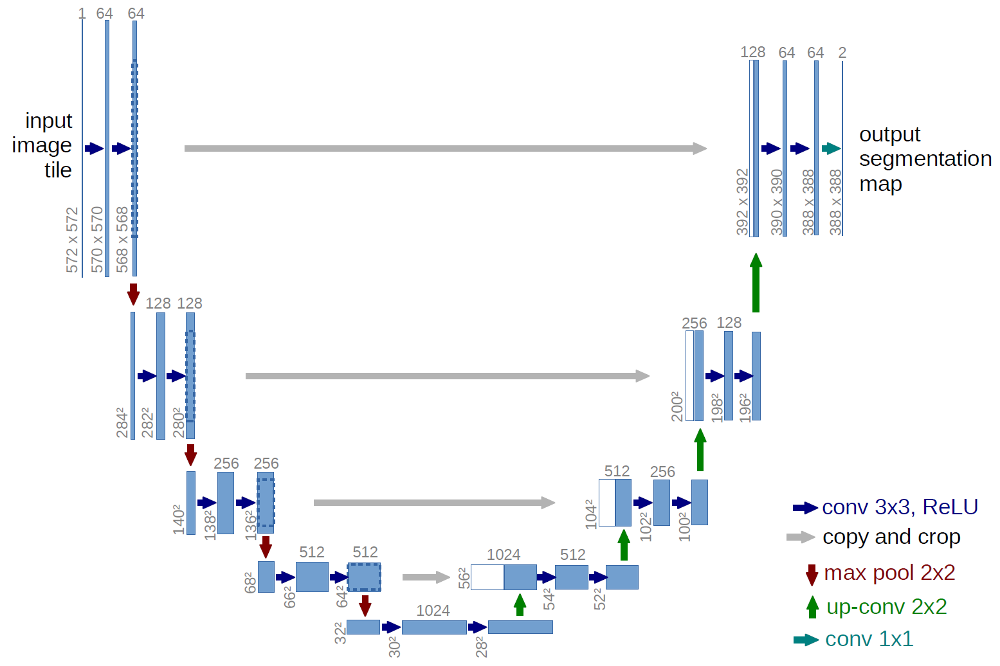

In [ ]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        #Fase di encoder
        self.enc1 = self.double_conv(in_channels, 64)
        self.enc2 = self.double_conv(64, 128)
        self.enc3 = self.double_conv(128, 256)
        self.enc4 = self.double_conv(256, 512)

        #Dropout
        self.dropout = nn.Dropout(p=0.5)

        #Max Pooling
        self.pool = nn.MaxPool2d(2)

        #Bottleneck
        self.bottleneck = self.double_conv(512, 1024)

        #Fase di decoder
        self.upconv4 = self.upconv(1024, 512)
        self.upconv3 = self.upconv(512, 256)
        self.upconv2 = self.upconv(256, 128)
        self.upconv1 = self.upconv(128,64)

        self.dec4 = self.double_conv(1024, 512)
        self.dec3 = self.double_conv(512, 256)
        self.dec2 = self.double_conv(256, 128)
        self.dec1 = self.double_conv(128, 64)

        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def double_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv(self, in_channels, out_channels):
        return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)


    def forward(self, x):
        #Fase di encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        #Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc4))

        #Dropout
        bottleneck = self.dropout(bottleneck)

        #Fase di decoder
        upconv4 = self.upconv4(bottleneck)
        upconv4 = torch.cat([upconv4, enc4], dim=1)
        dec4 = self.dec4(upconv4)

        upconv3 = self.upconv3(dec4)
        upconv3 = torch.cat([upconv3, enc3], dim=1)
        dec3 = self.dec3(upconv3)

        upconv2 = self.upconv2(dec3)
        upconv2 = torch.cat([upconv2, enc2], dim=1)
        dec2 = self.dec2(upconv2)

        upconv1 = self.upconv1(dec2)
        upconv1 = torch.cat([upconv1, enc1], dim=1)
        dec1 = self.dec1(upconv1)

        return self.final_conv(dec1)

# **KAIMING INIT FUNCTION**

In [ ]:
def kaiming_init(model):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.ConvTranspose2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

# **DICE COEFFICIENT E INTERSECTION OVER UNION(IoU)**

In [ ]:
def dice_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum()

  dice = (2.0 * intersection + 1e-8) / (union + 1e-8)
  return dice

def iou_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum() - intersection

  iou = (intersection + 1e-8) / (union + 1e-8)
  return iou

# **TRAINING E VALIDATION**

In [ ]:
def train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, epochs):
    train_losses = []
    val_losses = []
    train_dice = []
    val_dice = []
    train_iou = []
    val_iou = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        #Addestramento
        with tqdm(train_loader, desc=f"Epoch {epoch+1} Training", unit="batch") as tepoch:
          for images, masks in tepoch:

              images, masks = images.to(device), masks.to(device)

              optimizer.zero_grad()

              outputs = model(images)

              loss = criterion(outputs, masks)
              running_loss += loss.item() * images.size(0)
              loss.backward()
              torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) #Prevengo l'esplosione dei gradienti

              optimizer.step()

              dice = dice_coeff(outputs, masks)
              total_dice += dice.item() * images.size(0)

              iou = iou_coeff(outputs, masks)
              total_iou += iou.item() * images.size(0)

              total += images.size(0)

              tepoch.write(f"Training Loss: {loss.item():.4f}")


        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_dice = total_dice / total
        epoch_iou = total_iou / total
        train_losses.append(epoch_loss)
        train_dice.append(epoch_dice)
        train_iou.append(epoch_iou)

        print('\n')
        #Validazione
        model.eval()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        with torch.no_grad():
          with tqdm(validation_loader, desc=f"Epoch {epoch+1} Validation", unit="batch") as tepoch:
            for images, masks in tepoch:

                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                loss = criterion(outputs, masks)
                running_loss += loss.item() * images.size(0)

                dice = dice_coeff(outputs, masks)
                total_dice += dice.item() * images.size(0)

                iou = iou_coeff(outputs, masks)
                total_iou += iou.item() * images.size(0)

                total += images.size(0)

                tepoch.write(f"Validation Loss: {loss.item():.4f}")


        val_loss = running_loss / len(validation_loader.dataset)
        validation_dice = total_dice / total
        validation_iou = total_iou / total
        val_losses.append(val_loss)
        val_dice.append(validation_dice)
        val_iou.append(validation_iou)

        print(f'Epoch {epoch + 1}, Validation Loss: {val_loss:.4f}, Validation Dice: {validation_dice:.4f}, Validation IoU: {validation_iou:.4f}')
        print('\n')

    return train_losses, val_losses, train_dice, val_dice, train_iou, val_iou




# **HYPERPARAMETER TUNING**

In [ ]:
def random_hyperparameters():
    lr = random.choice([1e-3, 1e-4])
    batch_size = random.choice([16, 32])
    weight_decay = random.choice([1e-3, 1e-4])

    return lr, batch_size, weight_decay

def hyperparameter_tuning(trainset, validationset, criterion, device, num_trials=5, num_epochs=15):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    #File pdf per salvare i grafici
    pdf_filename = 'strawberry_hyperparameter_tuning.pdf'
    pdf_pages = PdfPages(pdf_filename)

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=1).to(device)
        kaiming_init(model)
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_dice, val_dice, train_iou, val_iou = train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(18,12))

        plt.subplot(2, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 2)
        plt.plot(range(1, num_epochs+1), train_dice, label='Train Dice', color='red')
        plt.plot(range(1, num_epochs+1), val_dice, label='Validation Dice', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.title(f'Trial {trial + 1} - Dice (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 3)
        plt.plot(range(1, num_epochs+1), train_iou, label='Train IoU', color='red')
        plt.plot(range(1, num_epochs+1), val_iou, label='Validation IoU', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('IoU')
        plt.title(f'Trial {trial + 1} - IoU (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()

        pdf_pages.savefig()

        plt.show()

        print('\n')

    pdf_pages.close()

    print(f'Best validation loss: {best_loss}')
    print(f'Best params: learning rate = {best_params[0]}, batch size = {best_params[1]}, weight_decay = {best_params[2]}')
    torch.save(best_model_wts, 'best_model_strawberry.pth')

    return best_params

# **FAILURE ANALYSIS**

In [23]:
def show_predictions(images, masks, predictions, num_images=5, title=None):
    def overlay(image, mask):
        image = image.permute(1, 2, 0).cpu().numpy()
        mask = mask.squeeze().cpu().numpy()

        color = np.zeros_like(image)
        color[mask > 0] = [0, 255, 255]

        return np.clip(image * 0.5 + color * 0.5, 0, 1)


    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, num_images*5))

    if title:
        fig.suptitle(title, fontsize=16, y=0.95)

    for i in range(num_images):
        ax = axes[i]
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        ax[0].imshow(image.permute(1, 2, 0).cpu().numpy())
        ax[0].set_title("Image")
        ax[0].axis('off')

        image_mask = overlay(image, mask)
        ax[1].imshow(image_mask)
        ax[1].set_title("Image + Mask")
        ax[1].axis('off')

        image_prediction = overlay(image, prediction)
        ax[2].imshow(image_prediction)
        ax[2].set_title("Image + Prediction")
        ax[2].axis('off')

    plt.tight_layout()
    plt.show()


def failure_analysis(model, criterion, testset, best_params, device):
    print('TESTING...')
    model.eval()
    test_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0
    total = 0
    images_list = []
    masks_list = []
    preds_list = []

    test_loader = DataLoader(testset, batch_size=best_params[1], shuffle=False)

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item() * images.size(0)

            dice = dice_coeff(outputs, masks)
            total_dice += dice.item() * images.size(0)

            iou = iou_coeff(outputs, masks)
            total_iou += iou.item() * images.size(0)

            total += images.size(0)

            images_list.extend(images)
            masks_list.extend(masks)
            preds_list.extend(outputs)

    test_loss /= len(test_loader.dataset)
    test_dice = total_dice / total
    test_iou = total_iou / total

    print(f"Final test loss: {test_loss}, Final test Dice: {test_dice:.4f}, Final test IoU: {test_iou:.4f}")

    errors_index = []
    correct_index = []
    for i in range(len(images_list)):
        dice = dice_coeff(preds_list[i], masks_list[i])
        if dice < 0.4:
            errors_index.append(i)
        elif dice > 0.90:
            correct_index.append(i)

    if correct_index:
        print('ALCUNE PREDIZIONI CORRETTE \n')
        show_predictions(
            [images_list[i] for i in correct_index[:5]],
            [masks_list[i] for i in correct_index[:5]],
            [preds_list[i] for i in correct_index[:5]],
        )

    if errors_index:
        print('ALCUNE PREDIZIONI ERRATE \n')
        show_predictions(
            [images_list[i] for i in errors_index[:5]],
            [masks_list[i] for i in errors_index[:5]],
            [preds_list[i] for i in errors_index[:5]],
        )



# **MAIN**

In [ ]:
image_dir = '/content/drive/MyDrive/StrawberryDataset/images'
mask_dir = '/content/drive/MyDrive/StrawberryDataset/masks'

# Creazione dataset
dataset = StrawberryDataset(image_dir=image_dir, mask_dir=mask_dir, image_transform=image_transform, mask_transform=mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size = int(0.7 * len(dataset))
validation_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - validation_size

trainset, validationset, testset = random_split(dataset, [train_size, validation_size, test_size])

criterion = nn.BCEWithLogitsLoss()

Trial 1/5 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [01:38<11:28, 98.33s/batch]

Training Loss: 0.7801


Epoch 1 Training:  25%|██▌       | 2/8 [02:48<08:09, 81.66s/batch]

Training Loss: 1.1253


Epoch 1 Training:  38%|███▊      | 3/8 [04:00<06:26, 77.35s/batch]

Training Loss: 0.2770


Epoch 1 Training:  50%|█████     | 4/8 [05:13<05:02, 75.60s/batch]

Training Loss: 0.2725


Epoch 1 Training:  62%|██████▎   | 5/8 [06:22<03:39, 73.30s/batch]

Training Loss: 0.2608


Epoch 1 Training:  75%|███████▌  | 6/8 [07:29<02:22, 71.09s/batch]

Training Loss: 0.2015


Epoch 1 Training:  88%|████████▊ | 7/8 [08:40<01:11, 71.19s/batch]

Training Loss: 0.1691


Epoch 1 Training: 100%|██████████| 8/8 [09:51<00:00, 73.91s/batch]


Training Loss: 0.1433




Epoch 1 Validation:  33%|███▎      | 1/3 [01:11<02:22, 71.28s/batch]

Validation Loss: 0.1122


Epoch 1 Validation:  67%|██████▋   | 2/3 [02:20<01:09, 69.84s/batch]

Validation Loss: 0.1165


Epoch 1 Validation: 100%|██████████| 3/3 [02:38<00:00, 52.83s/batch]


Validation Loss: 0.1306
Epoch 1, Validation Loss: 0.1162, Validation Dice: 0.0293, Validation IoU: 0.0149




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.62s/batch]

Training Loss: 0.1237


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.69s/batch]

Training Loss: 0.1056


Epoch 2 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0894


Epoch 2 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 0.0736


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.65s/batch]

Training Loss: 0.0682


Epoch 2 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.62s/batch]

Training Loss: 0.0594


Epoch 2 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 0.0957


Epoch 2 Training: 100%|██████████| 8/8 [00:28<00:00,  3.62s/batch]


Training Loss: 0.0574




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.61s/batch]

Validation Loss: 0.0515


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0560


Epoch 2 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.97s/batch]


Validation Loss: 0.0585
Epoch 2, Validation Loss: 0.0543, Validation Dice: 0.7974, Validation IoU: 0.6631




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Training Loss: 0.0665


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.64s/batch]

Training Loss: 0.0805


Epoch 3 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.64s/batch]

Training Loss: 0.0613


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.63s/batch]

Training Loss: 0.0935


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 0.0879


Epoch 3 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.64s/batch]

Training Loss: 0.0522


Epoch 3 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.63s/batch]

Training Loss: 0.0811


Epoch 3 Training: 100%|██████████| 8/8 [00:28<00:00,  3.62s/batch]


Training Loss: 0.0622




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 0.0527


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0570


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.0628
Epoch 3, Validation Loss: 0.0558, Validation Dice: 0.7486, Validation IoU: 0.5982




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.60s/batch]

Training Loss: 0.0601


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.60s/batch]

Training Loss: 0.0618


Epoch 4 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.63s/batch]

Training Loss: 0.0597


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.64s/batch]

Training Loss: 0.0507


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.64s/batch]

Training Loss: 0.0541


Epoch 4 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.63s/batch]

Training Loss: 0.0460


Epoch 4 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 0.0438


Epoch 4 Training: 100%|██████████| 8/8 [00:28<00:00,  3.61s/batch]


Training Loss: 0.0511




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.59s/batch]

Validation Loss: 0.0476


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0508


Epoch 4 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0577
Epoch 4, Validation Loss: 0.0502, Validation Dice: 0.7764, Validation IoU: 0.6345




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.66s/batch]

Training Loss: 0.0473


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.66s/batch]

Training Loss: 0.0508


Epoch 5 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.64s/batch]

Training Loss: 0.0504


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.62s/batch]

Training Loss: 0.0473


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 0.0517


Epoch 5 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.64s/batch]

Training Loss: 0.0489


Epoch 5 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.66s/batch]

Training Loss: 0.0523


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0523




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0457


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0492


Epoch 5 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.99s/batch]


Validation Loss: 0.0560
Epoch 5, Validation Loss: 0.0484, Validation Dice: 0.7801, Validation IoU: 0.6395




Epoch 6 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.61s/batch]

Training Loss: 0.0516


Epoch 6 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.61s/batch]

Training Loss: 0.0484


Epoch 6 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.61s/batch]

Training Loss: 0.0454


Epoch 6 Training:  50%|█████     | 4/8 [00:14<00:14,  3.63s/batch]

Training Loss: 0.0557


Epoch 6 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 0.0403


Epoch 6 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.64s/batch]

Training Loss: 0.0481


Epoch 6 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.64s/batch]

Training Loss: 0.0471


Epoch 6 Training: 100%|██████████| 8/8 [00:28<00:00,  3.61s/batch]


Training Loss: 0.0406




Epoch 6 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 0.0372


Epoch 6 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0408


Epoch 6 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 0.0436
Epoch 6, Validation Loss: 0.0395, Validation Dice: 0.8407, Validation IoU: 0.7252




Epoch 7 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.62s/batch]

Training Loss: 0.0434


Epoch 7 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.63s/batch]

Training Loss: 0.0379


Epoch 7 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.65s/batch]

Training Loss: 0.0452


Epoch 7 Training:  50%|█████     | 4/8 [00:14<00:14,  3.64s/batch]

Training Loss: 0.0430


Epoch 7 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.65s/batch]

Training Loss: 0.0444


Epoch 7 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.67s/batch]

Training Loss: 0.0453


Epoch 7 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.66s/batch]

Training Loss: 0.0389


Epoch 7 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0390




Epoch 7 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 0.0391


Epoch 7 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.0434


Epoch 7 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.0441
Epoch 7, Validation Loss: 0.0416, Validation Dice: 0.8438, Validation IoU: 0.7299




Epoch 8 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.63s/batch]

Training Loss: 0.0474


Epoch 8 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.66s/batch]

Training Loss: 0.0408


Epoch 8 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.68s/batch]

Training Loss: 0.0415


Epoch 8 Training:  50%|█████     | 4/8 [00:14<00:14,  3.67s/batch]

Training Loss: 0.0365


Epoch 8 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.65s/batch]

Training Loss: 0.0444


Epoch 8 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0387


Epoch 8 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 0.0334


Epoch 8 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0440




Epoch 8 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 0.0332


Epoch 8 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.66s/batch]

Validation Loss: 0.0374


Epoch 8 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 0.0442
Epoch 8, Validation Loss: 0.0364, Validation Dice: 0.8444, Validation IoU: 0.7308




Epoch 9 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Training Loss: 0.0394


Epoch 9 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.1039


Epoch 9 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.67s/batch]

Training Loss: 0.0878


Epoch 9 Training:  50%|█████     | 4/8 [00:14<00:14,  3.65s/batch]

Training Loss: 0.0391


Epoch 9 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.65s/batch]

Training Loss: 0.0777


Epoch 9 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.65s/batch]

Training Loss: 0.0951


Epoch 9 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 0.0712


Epoch 9 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0692




Epoch 9 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.63s/batch]

Validation Loss: 0.0590


Epoch 9 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0619


Epoch 9 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.0604
Epoch 9, Validation Loss: 0.0604, Validation Dice: 0.8020, Validation IoU: 0.6695




Epoch 10 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.60s/batch]

Training Loss: 0.0760


Epoch 10 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.61s/batch]

Training Loss: 0.0471


Epoch 10 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.63s/batch]

Training Loss: 0.0543


Epoch 10 Training:  50%|█████     | 4/8 [00:14<00:14,  3.65s/batch]

Training Loss: 0.0481


Epoch 10 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.64s/batch]

Training Loss: 0.0448


Epoch 10 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.62s/batch]

Training Loss: 0.0463


Epoch 10 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.63s/batch]

Training Loss: 0.0416


Epoch 10 Training: 100%|██████████| 8/8 [00:28<00:00,  3.61s/batch]


Training Loss: 0.0439




Epoch 10 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.62s/batch]

Validation Loss: 0.0495


Epoch 10 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.62s/batch]

Validation Loss: 0.0535


Epoch 10 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0497
Epoch 10, Validation Loss: 0.0513, Validation Dice: 0.8102, Validation IoU: 0.6810




Epoch 11 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Training Loss: 0.0625


Epoch 11 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.0559


Epoch 11 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.64s/batch]

Training Loss: 0.0519


Epoch 11 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 0.0564


Epoch 11 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 0.0599


Epoch 11 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.66s/batch]

Training Loss: 0.0534


Epoch 11 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0388


Epoch 11 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0694




Epoch 11 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.60s/batch]

Validation Loss: 0.0669


Epoch 11 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.64s/batch]

Validation Loss: 0.0720


Epoch 11 Validation: 100%|██████████| 3/3 [00:05<00:00,  2.00s/batch]


Validation Loss: 0.0660
Epoch 11, Validation Loss: 0.0690, Validation Dice: 0.7635, Validation IoU: 0.6177




Epoch 12 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Training Loss: 0.0729


Epoch 12 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.64s/batch]

Training Loss: 0.0547


Epoch 12 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.62s/batch]

Training Loss: 0.0421


Epoch 12 Training:  50%|█████     | 4/8 [00:14<00:14,  3.62s/batch]

Training Loss: 0.0495


Epoch 12 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 0.0492


Epoch 12 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.62s/batch]

Training Loss: 0.0427


Epoch 12 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.65s/batch]

Training Loss: 0.0480


Epoch 12 Training: 100%|██████████| 8/8 [00:28<00:00,  3.62s/batch]


Training Loss: 0.0441




Epoch 12 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.61s/batch]

Validation Loss: 0.0384


Epoch 12 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.63s/batch]

Validation Loss: 0.0412


Epoch 12 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0445
Epoch 12, Validation Loss: 0.0403, Validation Dice: 0.8309, Validation IoU: 0.7107




Epoch 13 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Training Loss: 0.0406


Epoch 13 Training:  25%|██▌       | 2/8 [00:07<00:21,  3.64s/batch]

Training Loss: 0.0422


Epoch 13 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.61s/batch]

Training Loss: 0.0399


Epoch 13 Training:  50%|█████     | 4/8 [00:14<00:14,  3.61s/batch]

Training Loss: 0.0423


Epoch 13 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.63s/batch]

Training Loss: 0.0419


Epoch 13 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.62s/batch]

Training Loss: 0.0426


Epoch 13 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.62s/batch]

Training Loss: 0.0428


Epoch 13 Training: 100%|██████████| 8/8 [00:28<00:00,  3.61s/batch]


Training Loss: 0.0441




Epoch 13 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.61s/batch]

Validation Loss: 0.0358


Epoch 13 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.61s/batch]

Validation Loss: 0.0387


Epoch 13 Validation: 100%|██████████| 3/3 [00:05<00:00,  1.98s/batch]


Validation Loss: 0.0428
Epoch 13, Validation Loss: 0.0379, Validation Dice: 0.8419, Validation IoU: 0.7270




Epoch 14 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Training Loss: 0.0414


Epoch 14 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.0425


Epoch 14 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0381


Epoch 14 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 0.0420


Epoch 14 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.66s/batch]

Training Loss: 0.0435


Epoch 14 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.65s/batch]

Training Loss: 0.0381


Epoch 14 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.64s/batch]

Training Loss: 0.0344


Epoch 14 Training: 100%|██████████| 8/8 [00:29<00:00,  3.63s/batch]


Training Loss: 0.0418




Epoch 14 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 0.0335


Epoch 14 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0371


Epoch 14 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.00s/batch]


Validation Loss: 0.0426
Epoch 14, Validation Loss: 0.0362, Validation Dice: 0.8495, Validation IoU: 0.7385




Epoch 15 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.64s/batch]

Training Loss: 0.0391


Epoch 15 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.68s/batch]

Training Loss: 0.0381


Epoch 15 Training:  38%|███▊      | 3/8 [00:10<00:18,  3.66s/batch]

Training Loss: 0.0384


Epoch 15 Training:  50%|█████     | 4/8 [00:14<00:14,  3.66s/batch]

Training Loss: 0.0405


Epoch 15 Training:  62%|██████▎   | 5/8 [00:18<00:10,  3.67s/batch]

Training Loss: 0.0454


Epoch 15 Training:  75%|███████▌  | 6/8 [00:21<00:07,  3.67s/batch]

Training Loss: 0.0343


Epoch 15 Training:  88%|████████▊ | 7/8 [00:25<00:03,  3.67s/batch]

Training Loss: 0.0414


Epoch 15 Training: 100%|██████████| 8/8 [00:29<00:00,  3.64s/batch]


Training Loss: 0.0391




Epoch 15 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.64s/batch]

Validation Loss: 0.0353


Epoch 15 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 0.0393


Epoch 15 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 0.0399
Epoch 15, Validation Loss: 0.0376, Validation Dice: 0.8580, Validation IoU: 0.7513




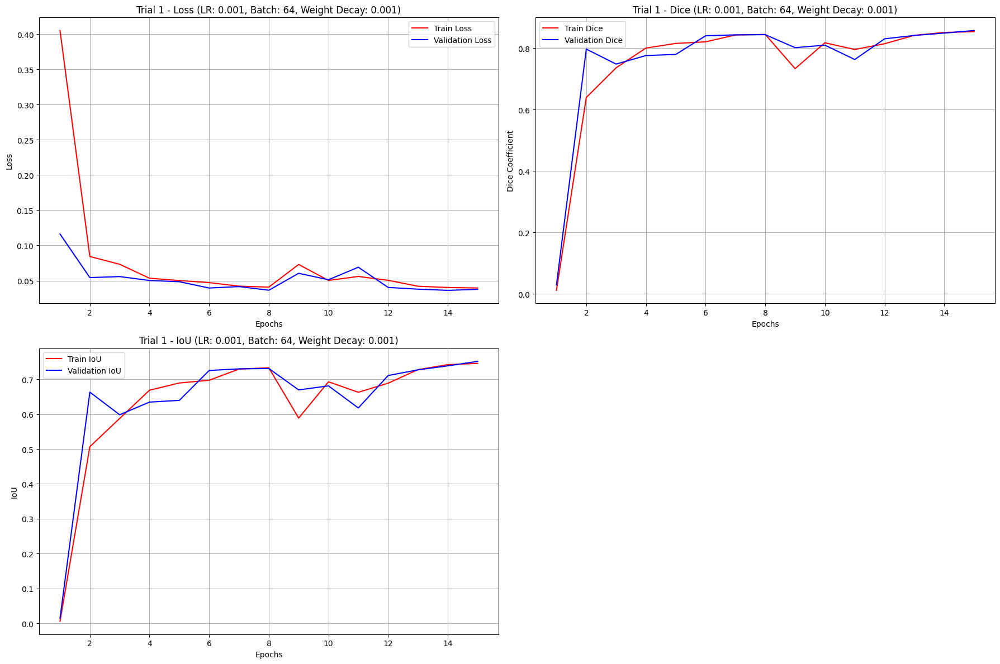



Trial 2/5 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.0001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.7664


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 1.0120


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.3208


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.2380


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.2281


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.1848


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.1472


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.1110


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.1290


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0841


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0680


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0629


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.2204


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0859


Epoch 1 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.1363


Epoch 1 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.1417


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0581


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0733


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0778


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0478


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0664


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0642


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0511


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0450


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0433


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0634


Epoch 1 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0621


Epoch 1 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0473


Epoch 1 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0413


Epoch 1 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0610


Epoch 1 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0702


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0463




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0411


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0430


Epoch 1 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0447


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0391


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0373


Epoch 1 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0449


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0487


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0477


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0456
Validation Loss: 0.0244
Epoch 1, Validation Loss: 0.0434, Validation Dice: 0.8311, Validation IoU: 0.7114




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0488


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0602


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0631


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0688


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0440


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0596


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0554


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0432


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.10batch/s]

Training Loss: 0.0511


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.10batch/s]

Training Loss: 0.0696


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0521


Epoch 2 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0512


Epoch 2 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0414


Epoch 2 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0635


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0573


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0428


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0571


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0431


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0607


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0595


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0423


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0486


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0546


Epoch 2 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.0483


Epoch 2 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0447


Epoch 2 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.0364


Epoch 2 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0331


Epoch 2 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0371


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0398


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0343


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0346


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0431




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0311


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0346


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0355


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0273


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0320


Epoch 2 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.53batch/s]

Validation Loss: 0.0393


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0356


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0389


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0455
Validation Loss: 0.0264
Epoch 2, Validation Loss: 0.0355, Validation Dice: 0.8498, Validation IoU: 0.7394




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0403


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0490


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0515


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0368


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.0455


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.0427


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.0425


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.0349


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.0379


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0327


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0379


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0485


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0477


Epoch 3 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.09batch/s]

Training Loss: 0.0339


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0517


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0524


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0377


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0465


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0346


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 0.0428


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0342


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0343


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0361


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0359


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0310


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0246


Epoch 3 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0315


Epoch 3 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0453


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0353


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0288


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0315


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0439




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0258


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0291


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0304


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0235


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0281


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0349


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0294


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0377


Epoch 3 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0412
Validation Loss: 0.0225
Epoch 3, Validation Loss: 0.0311, Validation Dice: 0.8682, Validation IoU: 0.7679




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0284


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0336


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0273


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0392


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0531


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0323


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0424


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0346


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0321


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0416


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0331


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0381


Epoch 4 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0327


Epoch 4 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0372


Epoch 4 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0355


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0251


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0302


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0373


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0256


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 0.0379


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0272


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0283


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0267


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0298


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0284


Epoch 4 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.07batch/s]

Training Loss: 0.0332


Epoch 4 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0304


Epoch 4 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0328


Epoch 4 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0335


Epoch 4 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0223


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0304


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0195




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0237


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0272


Epoch 4 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0283


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0232


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.47batch/s]

Validation Loss: 0.0250


Epoch 4 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0324


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0278


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0333


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0394
Validation Loss: 0.0189
Epoch 4, Validation Loss: 0.0288, Validation Dice: 0.8804, Validation IoU: 0.7871




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0285


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.11batch/s]

Training Loss: 0.0281


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0231


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0320


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0278


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0246


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0279


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0356


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0283


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0273


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0384


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0282


Epoch 5 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0216


Epoch 5 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0247


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0314


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0257


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0254


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0291


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0219


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0243


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0285


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0253


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0264


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0281


Epoch 5 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 0.0181


Epoch 5 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0266


Epoch 5 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0245


Epoch 5 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0241


Epoch 5 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0328


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0355


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0259


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0226




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:05,  1.56batch/s]

Validation Loss: 0.0200


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0237


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.55batch/s]

Validation Loss: 0.0247


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.54batch/s]

Validation Loss: 0.0213


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0217


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0255


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0268


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0292


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0286
Validation Loss: 0.0148
Epoch 5, Validation Loss: 0.0245, Validation Dice: 0.9049, Validation IoU: 0.8265




Epoch 6 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0265


Epoch 6 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0210


Epoch 6 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.0270


Epoch 6 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0269


Epoch 6 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0276


Epoch 6 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0366


Epoch 6 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0276


Epoch 6 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 0.0258


Epoch 6 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.0195


Epoch 6 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.10batch/s]

Training Loss: 0.0239


Epoch 6 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0212


Epoch 6 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 0.0212


Epoch 6 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0230


Epoch 6 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0319


Epoch 6 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0219


Epoch 6 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0284


Epoch 6 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0236


Epoch 6 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0254


Epoch 6 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0226


Epoch 6 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0277


Epoch 6 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0255


Epoch 6 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0297


Epoch 6 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0386


Epoch 6 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0358


Epoch 6 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.08batch/s]

Training Loss: 0.0302


Epoch 6 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.08batch/s]

Training Loss: 0.0305


Epoch 6 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0259


Epoch 6 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0237


Epoch 6 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0365


Epoch 6 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0294


Epoch 6 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0329


Epoch 6 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0397




Epoch 6 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0209


Epoch 6 Validation:  20%|██        | 2/10 [00:01<00:05,  1.55batch/s]

Validation Loss: 0.0256


Epoch 6 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0259


Epoch 6 Validation:  40%|████      | 4/10 [00:02<00:03,  1.53batch/s]

Validation Loss: 0.0227


Epoch 6 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0227


Epoch 6 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0274


Epoch 6 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0285


Epoch 6 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0315


Epoch 6 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0304
Validation Loss: 0.0127
Epoch 6, Validation Loss: 0.0261, Validation Dice: 0.8993, Validation IoU: 0.8174




Epoch 7 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0304


Epoch 7 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0306


Epoch 7 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0254


Epoch 7 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0250


Epoch 7 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0238


Epoch 7 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0246


Epoch 7 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0266


Epoch 7 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0229


Epoch 7 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0201


Epoch 7 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.0240


Epoch 7 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0327


Epoch 7 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0280


Epoch 7 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0204


Epoch 7 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0265


Epoch 7 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0244


Epoch 7 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0258


Epoch 7 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0248


Epoch 7 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0232


Epoch 7 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0364


Epoch 7 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0188


Epoch 7 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0272


Epoch 7 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0243


Epoch 7 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0286


Epoch 7 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0206


Epoch 7 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0212


Epoch 7 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0276


Epoch 7 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.0246


Epoch 7 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.07batch/s]

Training Loss: 0.0314


Epoch 7 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.06batch/s]

Training Loss: 0.0314


Epoch 7 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0180


Epoch 7 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0217


Epoch 7 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0142




Epoch 7 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0180


Epoch 7 Validation:  20%|██        | 2/10 [00:01<00:05,  1.55batch/s]

Validation Loss: 0.0212


Epoch 7 Validation:  30%|███       | 3/10 [00:01<00:04,  1.55batch/s]

Validation Loss: 0.0227


Epoch 7 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0183


Epoch 7 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0207


Epoch 7 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0246


Epoch 7 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0213


Epoch 7 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0293


Epoch 7 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0324
Validation Loss: 0.0184
Epoch 7, Validation Loss: 0.0231, Validation Dice: 0.9054, Validation IoU: 0.8277




Epoch 8 Training:   3%|▎         | 1/32 [00:00<00:29,  1.07batch/s]

Training Loss: 0.0200


Epoch 8 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.0257


Epoch 8 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.0276


Epoch 8 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.0231


Epoch 8 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0220


Epoch 8 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0220


Epoch 8 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.09batch/s]

Training Loss: 0.0204


Epoch 8 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0265


Epoch 8 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0189


Epoch 8 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0277


Epoch 8 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0206


Epoch 8 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0264


Epoch 8 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0214


Epoch 8 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0296


Epoch 8 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0222


Epoch 8 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0191


Epoch 8 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0205


Epoch 8 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0194


Epoch 8 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0162


Epoch 8 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 0.0206


Epoch 8 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0299


Epoch 8 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0213


Epoch 8 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0271


Epoch 8 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0266


Epoch 8 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0252


Epoch 8 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.08batch/s]

Training Loss: 0.0231


Epoch 8 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0269


Epoch 8 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0247


Epoch 8 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0179


Epoch 8 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0193


Epoch 8 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0267


Epoch 8 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0265




Epoch 8 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0179


Epoch 8 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0210


Epoch 8 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0215


Epoch 8 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0174


Epoch 8 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0189


Epoch 8 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0232


Epoch 8 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.53batch/s]

Validation Loss: 0.0215


Epoch 8 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0268


Epoch 8 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0292
Validation Loss: 0.0127
Epoch 8, Validation Loss: 0.0219, Validation Dice: 0.9142, Validation IoU: 0.8422




Epoch 9 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0183


Epoch 9 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0230


Epoch 9 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0219


Epoch 9 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.08batch/s]

Training Loss: 0.0216


Epoch 9 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0209


Epoch 9 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0232


Epoch 9 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.09batch/s]

Training Loss: 0.0181


Epoch 9 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 0.0215


Epoch 9 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.0268


Epoch 9 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.10batch/s]

Training Loss: 0.0166


Epoch 9 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0151


Epoch 9 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0181


Epoch 9 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0205


Epoch 9 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0232


Epoch 9 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0212


Epoch 9 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0207


Epoch 9 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0153


Epoch 9 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0248


Epoch 9 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0259


Epoch 9 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0202


Epoch 9 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0269


Epoch 9 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0255


Epoch 9 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0220


Epoch 9 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0155


Epoch 9 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0247


Epoch 9 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0189


Epoch 9 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0187


Epoch 9 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0200


Epoch 9 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0278


Epoch 9 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0225


Epoch 9 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0198


Epoch 9 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0183




Epoch 9 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0177


Epoch 9 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0210


Epoch 9 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0213


Epoch 9 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0213


Epoch 9 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0187


Epoch 9 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0227


Epoch 9 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0242


Epoch 9 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0253


Epoch 9 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.62batch/s]


Validation Loss: 0.0262
Validation Loss: 0.0109
Epoch 9, Validation Loss: 0.0220, Validation Dice: 0.9150, Validation IoU: 0.8434




Epoch 10 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0236


Epoch 10 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.0226


Epoch 10 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0207


Epoch 10 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0207


Epoch 10 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0186


Epoch 10 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0216


Epoch 10 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0255


Epoch 10 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0276


Epoch 10 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0206


Epoch 10 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0211


Epoch 10 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0237


Epoch 10 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0182


Epoch 10 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0210


Epoch 10 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0237


Epoch 10 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0218


Epoch 10 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0188


Epoch 10 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.06batch/s]

Training Loss: 0.0217


Epoch 10 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0167


Epoch 10 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0171


Epoch 10 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0223


Epoch 10 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0189


Epoch 10 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0180


Epoch 10 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0240


Epoch 10 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0352


Epoch 10 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0175


Epoch 10 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0188


Epoch 10 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0187


Epoch 10 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0208


Epoch 10 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0175


Epoch 10 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0167


Epoch 10 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0204


Epoch 10 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0262




Epoch 10 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0194


Epoch 10 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0243


Epoch 10 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0268


Epoch 10 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0207


Epoch 10 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0258


Epoch 10 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0317


Epoch 10 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0231


Epoch 10 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0361


Epoch 10 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0428
Validation Loss: 0.0229
Epoch 10, Validation Loss: 0.0278, Validation Dice: 0.8880, Validation IoU: 0.7997




Epoch 11 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0215


Epoch 11 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0246


Epoch 11 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0346


Epoch 11 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0263


Epoch 11 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0192


Epoch 11 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0373


Epoch 11 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0226


Epoch 11 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0172


Epoch 11 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0309


Epoch 11 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0199


Epoch 11 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0249


Epoch 11 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0237


Epoch 11 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0210


Epoch 11 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0224


Epoch 11 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0153


Epoch 11 Training:  50%|█████     | 16/32 [00:14<00:15,  1.06batch/s]

Training Loss: 0.0163


Epoch 11 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 0.0200


Epoch 11 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0214


Epoch 11 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.0195


Epoch 11 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0353


Epoch 11 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.0196


Epoch 11 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 0.0207


Epoch 11 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0366


Epoch 11 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0191


Epoch 11 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0260


Epoch 11 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0193


Epoch 11 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0167


Epoch 11 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0204


Epoch 11 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 0.0227


Epoch 11 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.0196


Epoch 11 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0204


Epoch 11 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0190




Epoch 11 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0176


Epoch 11 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0214


Epoch 11 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0214


Epoch 11 Validation:  40%|████      | 4/10 [00:02<00:03,  1.53batch/s]

Validation Loss: 0.0164


Epoch 11 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.53batch/s]

Validation Loss: 0.0193


Epoch 11 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.54batch/s]

Validation Loss: 0.0243


Epoch 11 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.53batch/s]

Validation Loss: 0.0196


Epoch 11 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0257


Epoch 11 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.68batch/s]


Validation Loss: 0.0275
Validation Loss: 0.0100
Epoch 11, Validation Loss: 0.0214, Validation Dice: 0.9149, Validation IoU: 0.8436




Epoch 12 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0208


Epoch 12 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0219


Epoch 12 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0238


Epoch 12 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0212


Epoch 12 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.0258


Epoch 12 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0159


Epoch 12 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0170


Epoch 12 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0234


Epoch 12 Training:  28%|██▊       | 9/32 [00:08<00:22,  1.04batch/s]

Training Loss: 0.0186


Epoch 12 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0187


Epoch 12 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0191


Epoch 12 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0191


Epoch 12 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0192


Epoch 12 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.09batch/s]

Training Loss: 0.0210


Epoch 12 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0184


Epoch 12 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0228


Epoch 12 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0204


Epoch 12 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0200


Epoch 12 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0190


Epoch 12 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0209


Epoch 12 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0183


Epoch 12 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0161


Epoch 12 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.10batch/s]

Training Loss: 0.0225


Epoch 12 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0190


Epoch 12 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0191


Epoch 12 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0204


Epoch 12 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0127


Epoch 12 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0196


Epoch 12 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0240


Epoch 12 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0184


Epoch 12 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0238


Epoch 12 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0187




Epoch 12 Validation:  10%|█         | 1/10 [00:00<00:06,  1.50batch/s]

Validation Loss: 0.0165


Epoch 12 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0204


Epoch 12 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0227


Epoch 12 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0161


Epoch 12 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0192


Epoch 12 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0222


Epoch 12 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0209


Epoch 12 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0262


Epoch 12 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0302
Validation Loss: 0.0160
Epoch 12, Validation Loss: 0.0216, Validation Dice: 0.9171, Validation IoU: 0.8472




Epoch 13 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0164


Epoch 13 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0191


Epoch 13 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0183


Epoch 13 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0201


Epoch 13 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0188


Epoch 13 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0180


Epoch 13 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0171


Epoch 13 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0150


Epoch 13 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0153


Epoch 13 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0150


Epoch 13 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0178


Epoch 13 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0150


Epoch 13 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0187


Epoch 13 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0179


Epoch 13 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0164


Epoch 13 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0183


Epoch 13 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0278


Epoch 13 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0212


Epoch 13 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.08batch/s]

Training Loss: 0.0154


Epoch 13 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0171


Epoch 13 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.0121


Epoch 13 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0152


Epoch 13 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0193


Epoch 13 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0170


Epoch 13 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0180


Epoch 13 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0189


Epoch 13 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0141


Epoch 13 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0222


Epoch 13 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0172


Epoch 13 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0200


Epoch 13 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0183


Epoch 13 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0238




Epoch 13 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0134


Epoch 13 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0153


Epoch 13 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0174


Epoch 13 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0143


Epoch 13 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0157


Epoch 13 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.53batch/s]

Validation Loss: 0.0173


Epoch 13 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0177


Epoch 13 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0216


Epoch 13 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0223
Validation Loss: 0.0147
Epoch 13, Validation Loss: 0.0172, Validation Dice: 0.9339, Validation IoU: 0.8762




Epoch 14 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0179


Epoch 14 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0149


Epoch 14 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0177


Epoch 14 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0170


Epoch 14 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0131


Epoch 14 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0147


Epoch 14 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0142


Epoch 14 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0197


Epoch 14 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0255


Epoch 14 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0193


Epoch 14 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0161


Epoch 14 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0146


Epoch 14 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0197


Epoch 14 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0135


Epoch 14 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0141


Epoch 14 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0147


Epoch 14 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0154


Epoch 14 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0169


Epoch 14 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0156


Epoch 14 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0192


Epoch 14 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0165


Epoch 14 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0152


Epoch 14 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0163


Epoch 14 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0165


Epoch 14 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0157


Epoch 14 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0158


Epoch 14 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0169


Epoch 14 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0138


Epoch 14 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0236


Epoch 14 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0181


Epoch 14 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0203


Epoch 14 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0170




Epoch 14 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0130


Epoch 14 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0155


Epoch 14 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0164


Epoch 14 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.0128


Epoch 14 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0153


Epoch 14 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0175


Epoch 14 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.53batch/s]

Validation Loss: 0.0159


Epoch 14 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0215


Epoch 14 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0215
Validation Loss: 0.0132
Epoch 14, Validation Loss: 0.0166, Validation Dice: 0.9358, Validation IoU: 0.8797




Epoch 15 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0151


Epoch 15 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0155


Epoch 15 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0212


Epoch 15 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0135


Epoch 15 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0172


Epoch 15 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0176


Epoch 15 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0174


Epoch 15 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0191


Epoch 15 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0153


Epoch 15 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0244


Epoch 15 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0161


Epoch 15 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0182


Epoch 15 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0166


Epoch 15 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0192


Epoch 15 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0172


Epoch 15 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0147


Epoch 15 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0144


Epoch 15 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0180


Epoch 15 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0163


Epoch 15 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0166


Epoch 15 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0172


Epoch 15 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0130


Epoch 15 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0234


Epoch 15 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.0161


Epoch 15 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0191


Epoch 15 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.0164


Epoch 15 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0172


Epoch 15 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0158


Epoch 15 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0148


Epoch 15 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0143


Epoch 15 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0135


Epoch 15 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0140




Epoch 15 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0127


Epoch 15 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0148


Epoch 15 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0153


Epoch 15 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0147


Epoch 15 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0141


Epoch 15 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0157


Epoch 15 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0155


Epoch 15 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0178


Epoch 15 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0188
Validation Loss: 0.0065
Epoch 15, Validation Loss: 0.0154, Validation Dice: 0.9396, Validation IoU: 0.8861




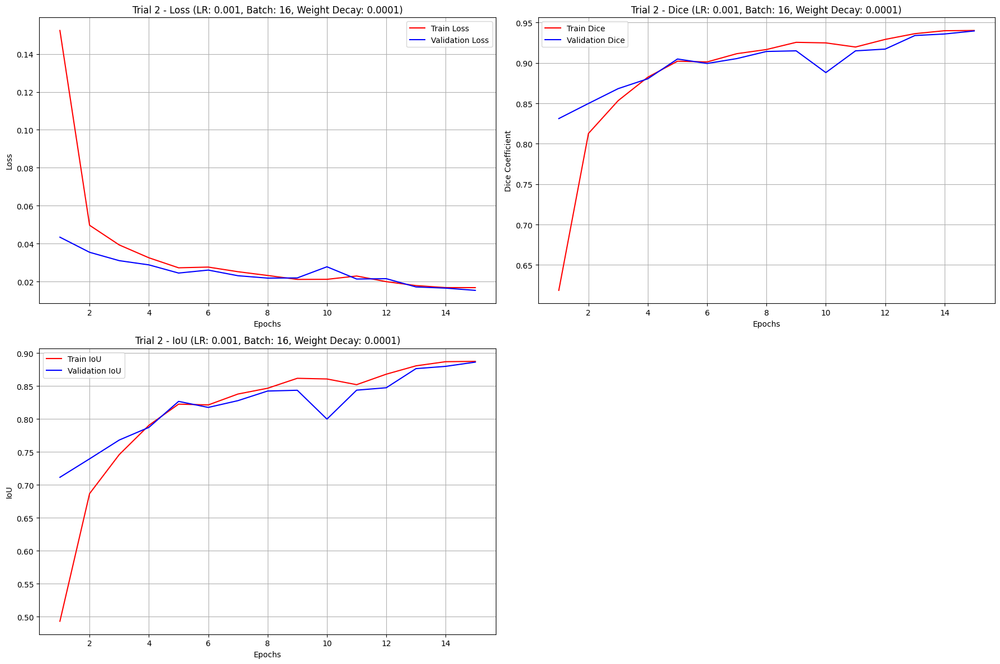



Trial 3/5 --> learning rate = 0.01, batch_size = 16, weight_decay = 0.0001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 1.5278


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 584846464.0000


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 1564.0128


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 4825.7812


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 6829.9404


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 199.2535


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 173.7007


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 3.0838


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.4441


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 9.2093


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 3347.0818


Epoch 1 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 28732.1621


Epoch 1 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 153.8829


Epoch 1 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 41170.0039


Epoch 1 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 277.4450


Epoch 1 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.3481


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.2759


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.2288


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.2233


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.2088


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.10batch/s]

Training Loss: 0.3433


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.1910


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.2096


Epoch 1 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.2153


Epoch 1 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.2162


Epoch 1 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.2048


Epoch 1 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.2222


Epoch 1 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.2183


Epoch 1 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.2109


Epoch 1 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.2225


Epoch 1 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.2261


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.2133




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:06,  1.46batch/s]

Validation Loss: 0.1872


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.1936


Epoch 1 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.1980


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.1873


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.1857


Epoch 1 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.2002


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.2333


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.1748


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.2288
Validation Loss: 0.1155
Epoch 1, Validation Loss: 0.1982, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.2299


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.2265


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.1925


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.2269


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.11batch/s]

Training Loss: 0.1792


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.11batch/s]

Training Loss: 0.1757


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.11batch/s]

Training Loss: 0.2189


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.1848


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.11batch/s]

Training Loss: 0.2149


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.2127


Epoch 2 Training:  34%|███▍      | 11/32 [00:09<00:18,  1.11batch/s]

Training Loss: 0.2239


Epoch 2 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.11batch/s]

Training Loss: 0.2162


Epoch 2 Training:  41%|████      | 13/32 [00:11<00:17,  1.11batch/s]

Training Loss: 0.2130


Epoch 2 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.11batch/s]

Training Loss: 0.2312


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.11batch/s]

Training Loss: 0.2457


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.2155


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.2161


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.9599


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.2037


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.2162


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.2180


Epoch 2 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.2152


Epoch 2 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.09batch/s]

Training Loss: 0.1603


Epoch 2 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.1731


Epoch 2 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.2458


Epoch 2 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.2199


Epoch 2 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.2299


Epoch 2 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.2148


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.2495


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.2013


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.2054


Epoch 2 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.2066




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.1851


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.1903


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.1938


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.1852


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.1840


Epoch 2 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.49batch/s]

Validation Loss: 0.1956


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.2222


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.1751


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.2186
Validation Loss: 0.1274
Epoch 2, Validation Loss: 0.1940, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:27,  1.14batch/s]

Training Loss: 0.1734


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.2605


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.2256


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.2004


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.2233


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.2025


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.2053


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.2163


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.2361


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.11batch/s]

Training Loss: 0.1730


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.2174


Epoch 3 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.2250


Epoch 3 Training:  41%|████      | 13/32 [00:11<00:17,  1.11batch/s]

Training Loss: 0.1751


Epoch 3 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.11batch/s]

Training Loss: 0.2186


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.11batch/s]

Training Loss: 0.2003


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.2085


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.1970


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.3310


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.2099


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 0.2146


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.10batch/s]

Training Loss: 0.2062


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.2175


Epoch 3 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.10batch/s]

Training Loss: 0.1620


Epoch 3 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.10batch/s]

Training Loss: 0.2187


Epoch 3 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 0.2528


Epoch 3 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.2098


Epoch 3 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.2213


Epoch 3 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.11batch/s]

Training Loss: 0.2165


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.4304


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.11batch/s]

Training Loss: 0.1822


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.1923


Epoch 3 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.2231




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.1865


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.1922


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.1952


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.1876


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.1877


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.1954


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.2201


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.1783


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.2160
Validation Loss: 0.1402
Epoch 3, Validation Loss: 0.1951, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.2165


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.1925


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.1929


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.11batch/s]

Training Loss: 0.1515


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.11batch/s]

Training Loss: 0.1620


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.11batch/s]

Training Loss: 0.1414


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.11batch/s]

Training Loss: 0.1440


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.1412


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.11batch/s]

Training Loss: 0.1106


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.1330


Epoch 4 Training:  34%|███▍      | 11/32 [00:09<00:18,  1.11batch/s]

Training Loss: 0.1213


Epoch 4 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.11batch/s]

Training Loss: 0.0832


Epoch 4 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.1018


Epoch 4 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0653


Epoch 4 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0846


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.1345


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0813


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0736


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.1352


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0741


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.1037


Epoch 4 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.1091


Epoch 4 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0641


Epoch 4 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.10batch/s]

Training Loss: 0.0805


Epoch 4 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0838


Epoch 4 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.0897


Epoch 4 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0740


Epoch 4 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0469


Epoch 4 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0785


Epoch 4 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0577


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0570


Epoch 4 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.0676




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0483


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0500


Epoch 4 Validation:  30%|███       | 3/10 [00:01<00:04,  1.54batch/s]

Validation Loss: 0.0544


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:03,  1.54batch/s]

Validation Loss: 0.0452


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0463


Epoch 4 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.53batch/s]

Validation Loss: 0.0578


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0604


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0538


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0611
Validation Loss: 0.0234
Epoch 4, Validation Loss: 0.0528, Validation Dice: 0.7840, Validation IoU: 0.6453




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0490


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.11batch/s]

Training Loss: 0.0552


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0619


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.11batch/s]

Training Loss: 0.0483


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0619


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.11batch/s]

Training Loss: 0.0553


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0641


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0655


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0750


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0605


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0564


Epoch 5 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 0.0676


Epoch 5 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0520


Epoch 5 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0466


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0600


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0562


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.0481


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0493


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0487


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0536


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0565


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0607


Epoch 5 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0566


Epoch 5 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.11batch/s]

Training Loss: 0.0449


Epoch 5 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0454


Epoch 5 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0478


Epoch 5 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0468


Epoch 5 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0621


Epoch 5 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0605


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0495


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0570


Epoch 5 Training: 100%|██████████| 32/32 [00:28<00:00,  1.10batch/s]


Training Loss: 0.0536




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0457


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0458


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0492


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0400


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0412


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0545


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0511


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0510


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0598
Validation Loss: 0.0232
Epoch 5, Validation Loss: 0.0485, Validation Dice: 0.7864, Validation IoU: 0.6491




Epoch 6 Training:   3%|▎         | 1/32 [00:00<00:27,  1.12batch/s]

Training Loss: 0.0492


Epoch 6 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0633


Epoch 6 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0617


Epoch 6 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0493


Epoch 6 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0472


Epoch 6 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.08batch/s]

Training Loss: 0.0508


Epoch 6 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0587


Epoch 6 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 0.0720


Epoch 6 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.0427


Epoch 6 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.0618


Epoch 6 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0435


Epoch 6 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0534


Epoch 6 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0557


Epoch 6 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.11batch/s]

Training Loss: 0.0476


Epoch 6 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0540


Epoch 6 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0488


Epoch 6 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0462


Epoch 6 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0449


Epoch 6 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0440


Epoch 6 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0384


Epoch 6 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.10batch/s]

Training Loss: 0.0585


Epoch 6 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0422


Epoch 6 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0417


Epoch 6 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.10batch/s]

Training Loss: 0.0574


Epoch 6 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0522


Epoch 6 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0540


Epoch 6 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0565


Epoch 6 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0561


Epoch 6 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0521


Epoch 6 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0616


Epoch 6 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0444


Epoch 6 Training: 100%|██████████| 32/32 [00:28<00:00,  1.10batch/s]


Training Loss: 0.0461




Epoch 6 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0439


Epoch 6 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0449


Epoch 6 Validation:  30%|███       | 3/10 [00:01<00:04,  1.50batch/s]

Validation Loss: 0.0489


Epoch 6 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0430


Epoch 6 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0412


Epoch 6 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0520


Epoch 6 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0544


Epoch 6 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0525


Epoch 6 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0571
Validation Loss: 0.0234
Epoch 6, Validation Loss: 0.0485, Validation Dice: 0.8169, Validation IoU: 0.6909




Epoch 7 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0430


Epoch 7 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0574


Epoch 7 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0609


Epoch 7 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0530


Epoch 7 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0451


Epoch 7 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0375


Epoch 7 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0499


Epoch 7 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.11batch/s]

Training Loss: 0.0617


Epoch 7 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.12batch/s]

Training Loss: 0.0478


Epoch 7 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.11batch/s]

Training Loss: 0.0617


Epoch 7 Training:  34%|███▍      | 11/32 [00:09<00:18,  1.11batch/s]

Training Loss: 0.0594


Epoch 7 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0487


Epoch 7 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0559


Epoch 7 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0469


Epoch 7 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0453


Epoch 7 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0753


Epoch 7 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.0530


Epoch 7 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0558


Epoch 7 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0522


Epoch 7 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0543


Epoch 7 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.0642


Epoch 7 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0665


Epoch 7 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.10batch/s]

Training Loss: 0.0613


Epoch 7 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.11batch/s]

Training Loss: 0.0559


Epoch 7 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0601


Epoch 7 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0506


Epoch 7 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0516


Epoch 7 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0473


Epoch 7 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0479


Epoch 7 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0473


Epoch 7 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0464


Epoch 7 Training: 100%|██████████| 32/32 [00:28<00:00,  1.10batch/s]


Training Loss: 0.0470




Epoch 7 Validation:  10%|█         | 1/10 [00:00<00:05,  1.56batch/s]

Validation Loss: 0.0447


Epoch 7 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0448


Epoch 7 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0488


Epoch 7 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0377


Epoch 7 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0404


Epoch 7 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.49batch/s]

Validation Loss: 0.0532


Epoch 7 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0494


Epoch 7 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0508


Epoch 7 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0587
Validation Loss: 0.0233
Epoch 7, Validation Loss: 0.0475, Validation Dice: 0.7841, Validation IoU: 0.6461




Epoch 8 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0610


Epoch 8 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0534


Epoch 8 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.0432


Epoch 8 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0518


Epoch 8 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0406


Epoch 8 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0481


Epoch 8 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0464


Epoch 8 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0539


Epoch 8 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0465


Epoch 8 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.0500


Epoch 8 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0635


Epoch 8 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0392


Epoch 8 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0422


Epoch 8 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0477


Epoch 8 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0484


Epoch 8 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0419


Epoch 8 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0611


Epoch 8 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0393


Epoch 8 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0499


Epoch 8 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0445


Epoch 8 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.0397


Epoch 8 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0620


Epoch 8 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.10batch/s]

Training Loss: 0.0549


Epoch 8 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.0711


Epoch 8 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0531


Epoch 8 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0528


Epoch 8 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0454


Epoch 8 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0533


Epoch 8 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0578


Epoch 8 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0645


Epoch 8 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0483


Epoch 8 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0446




Epoch 8 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0485


Epoch 8 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0493


Epoch 8 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0546


Epoch 8 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0490


Epoch 8 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0475


Epoch 8 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0551


Epoch 8 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0603


Epoch 8 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0579


Epoch 8 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0598
Validation Loss: 0.0260
Epoch 8, Validation Loss: 0.0534, Validation Dice: 0.8079, Validation IoU: 0.6779




Epoch 9 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0499


Epoch 9 Training:   6%|▋         | 2/32 [00:01<00:27,  1.11batch/s]

Training Loss: 0.0491


Epoch 9 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0456


Epoch 9 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0679


Epoch 9 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0538


Epoch 9 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0488


Epoch 9 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0470


Epoch 9 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0521


Epoch 9 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0439


Epoch 9 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0486


Epoch 9 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0541


Epoch 9 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.04batch/s]

Training Loss: 0.8770


Epoch 9 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.2346


Epoch 9 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0444


Epoch 9 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0495


Epoch 9 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0578


Epoch 9 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0546


Epoch 9 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.11batch/s]

Training Loss: 0.0612


Epoch 9 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0664


Epoch 9 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0599


Epoch 9 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0665


Epoch 9 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0487


Epoch 9 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.10batch/s]

Training Loss: 0.0592


Epoch 9 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.10batch/s]

Training Loss: 0.0464


Epoch 9 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0510


Epoch 9 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.11batch/s]

Training Loss: 0.0524


Epoch 9 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.11batch/s]

Training Loss: 0.0674


Epoch 9 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0526


Epoch 9 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0568


Epoch 9 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0397


Epoch 9 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0558


Epoch 9 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0536




Epoch 9 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0568


Epoch 9 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0548


Epoch 9 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0607


Epoch 9 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0442


Epoch 9 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.38batch/s]

Validation Loss: 0.0517


Epoch 9 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.44batch/s]

Validation Loss: 0.0662


Epoch 9 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.46batch/s]

Validation Loss: 0.0561


Epoch 9 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0615


Epoch 9 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.62batch/s]


Validation Loss: 0.0750
Validation Loss: 0.0308
Epoch 9, Validation Loss: 0.0584, Validation Dice: 0.7171, Validation IoU: 0.5615




Epoch 10 Training:   3%|▎         | 1/32 [00:00<00:28,  1.11batch/s]

Training Loss: 0.0583


Epoch 10 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0642


Epoch 10 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.0520


Epoch 10 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0802


Epoch 10 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0549


Epoch 10 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0575


Epoch 10 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0588


Epoch 10 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.09batch/s]

Training Loss: 0.0418


Epoch 10 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0655


Epoch 10 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.0660


Epoch 10 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0426


Epoch 10 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0572


Epoch 10 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0585


Epoch 10 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.11batch/s]

Training Loss: 0.0616


Epoch 10 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.11batch/s]

Training Loss: 0.0615


Epoch 10 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0637


Epoch 10 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.11batch/s]

Training Loss: 0.0706


Epoch 10 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0488


Epoch 10 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0614


Epoch 10 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0661


Epoch 10 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0402


Epoch 10 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0528


Epoch 10 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0548


Epoch 10 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.0614


Epoch 10 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 0.0485


Epoch 10 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0448


Epoch 10 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0648


Epoch 10 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0493


Epoch 10 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0544


Epoch 10 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0508


Epoch 10 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0666


Epoch 10 Training: 100%|██████████| 32/32 [00:29<00:00,  1.10batch/s]


Training Loss: 0.0403




Epoch 10 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0441


Epoch 10 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0444


Epoch 10 Validation:  30%|███       | 3/10 [00:01<00:04,  1.50batch/s]

Validation Loss: 0.0482


Epoch 10 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0381


Epoch 10 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0409


Epoch 10 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0525


Epoch 10 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0497


Epoch 10 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0503


Epoch 10 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0583
Validation Loss: 0.0239
Epoch 10, Validation Loss: 0.0472, Validation Dice: 0.7986, Validation IoU: 0.6656




Epoch 11 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0450


Epoch 11 Training:   6%|▋         | 2/32 [00:01<00:27,  1.11batch/s]

Training Loss: 0.0553


Epoch 11 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0774


Epoch 11 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.11batch/s]

Training Loss: 0.0517


Epoch 11 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.11batch/s]

Training Loss: 0.0554


Epoch 11 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0475


Epoch 11 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0470


Epoch 11 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0493


Epoch 11 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0518


Epoch 11 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0402


Epoch 11 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0368


Epoch 11 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 0.0432


Epoch 11 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0562


Epoch 11 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0415


Epoch 11 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0428


Epoch 11 Training:  50%|█████     | 16/32 [00:14<00:14,  1.11batch/s]

Training Loss: 0.0573


Epoch 11 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.11batch/s]

Training Loss: 0.0479


Epoch 11 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0385


Epoch 11 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0468


Epoch 11 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0541


Epoch 11 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0499


Epoch 11 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.0489


Epoch 11 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.09batch/s]

Training Loss: 0.0531


Epoch 11 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.09batch/s]

Training Loss: 0.0460


Epoch 11 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 0.0484


Epoch 11 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0482


Epoch 11 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0603


Epoch 11 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0531


Epoch 11 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0448


Epoch 11 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0443


Epoch 11 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0615


Epoch 11 Training: 100%|██████████| 32/32 [00:28<00:00,  1.10batch/s]


Training Loss: 0.0429




Epoch 11 Validation:  10%|█         | 1/10 [00:00<00:06,  1.50batch/s]

Validation Loss: 0.0420


Epoch 11 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0421


Epoch 11 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0466


Epoch 11 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0378


Epoch 11 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0388


Epoch 11 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0500


Epoch 11 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0474


Epoch 11 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0495


Epoch 11 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0563
Validation Loss: 0.0241
Epoch 11, Validation Loss: 0.0455, Validation Dice: 0.8108, Validation IoU: 0.6827




Epoch 12 Training:   3%|▎         | 1/32 [00:00<00:27,  1.11batch/s]

Training Loss: 0.0514


Epoch 12 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0507


Epoch 12 Training:   9%|▉         | 3/32 [00:02<00:26,  1.10batch/s]

Training Loss: 0.0705


Epoch 12 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.11batch/s]

Training Loss: 0.0527


Epoch 12 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0396


Epoch 12 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0513


Epoch 12 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0349


Epoch 12 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0375


Epoch 12 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0546


Epoch 12 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0447


Epoch 12 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0453


Epoch 12 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 0.0784


Epoch 12 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0591


Epoch 12 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0409


Epoch 12 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0564


Epoch 12 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0443


Epoch 12 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.0511


Epoch 12 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0456


Epoch 12 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0579


Epoch 12 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.11batch/s]

Training Loss: 0.0489


Epoch 12 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0464


Epoch 12 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0455


Epoch 12 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.09batch/s]

Training Loss: 0.0487


Epoch 12 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.10batch/s]

Training Loss: 0.0435


Epoch 12 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.09batch/s]

Training Loss: 0.0479


Epoch 12 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0403


Epoch 12 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0513


Epoch 12 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.11batch/s]

Training Loss: 0.0597


Epoch 12 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0619


Epoch 12 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0509


Epoch 12 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0420


Epoch 12 Training: 100%|██████████| 32/32 [00:28<00:00,  1.10batch/s]


Training Loss: 0.0542




Epoch 12 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0476


Epoch 12 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0499


Epoch 12 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0552


Epoch 12 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0498


Epoch 12 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0478


Epoch 12 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0568


Epoch 12 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0613


Epoch 12 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0585


Epoch 12 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0615
Validation Loss: 0.0250
Epoch 12, Validation Loss: 0.0541, Validation Dice: 0.8132, Validation IoU: 0.6855




Epoch 13 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0593


Epoch 13 Training:   6%|▋         | 2/32 [00:01<00:27,  1.10batch/s]

Training Loss: 0.0551


Epoch 13 Training:   9%|▉         | 3/32 [00:02<00:26,  1.11batch/s]

Training Loss: 0.0549


Epoch 13 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0612


Epoch 13 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0521


Epoch 13 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0426


Epoch 13 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0550


Epoch 13 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0482


Epoch 13 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.0539


Epoch 13 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0495


Epoch 13 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0549


Epoch 13 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.09batch/s]

Training Loss: 0.0636


Epoch 13 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0619


Epoch 13 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0559


Epoch 13 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0669


Epoch 13 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0517


Epoch 13 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.0535


Epoch 13 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0556


Epoch 13 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0420


Epoch 13 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0487


Epoch 13 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.10batch/s]

Training Loss: 0.0419


Epoch 13 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.10batch/s]

Training Loss: 0.0415


Epoch 13 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0445


Epoch 13 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.11batch/s]

Training Loss: 0.0431


Epoch 13 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.11batch/s]

Training Loss: 0.0500


Epoch 13 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0456


Epoch 13 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.11batch/s]

Training Loss: 0.0570


Epoch 13 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.11batch/s]

Training Loss: 0.0513


Epoch 13 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0593


Epoch 13 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0408


Epoch 13 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.11batch/s]

Training Loss: 0.0601


Epoch 13 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.0472




Epoch 13 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0573


Epoch 13 Validation:  20%|██        | 2/10 [00:01<00:05,  1.56batch/s]

Validation Loss: 0.0551


Epoch 13 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0604


Epoch 13 Validation:  40%|████      | 4/10 [00:02<00:03,  1.54batch/s]

Validation Loss: 0.0434


Epoch 13 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0521


Epoch 13 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.53batch/s]

Validation Loss: 0.0672


Epoch 13 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0551


Epoch 13 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.52batch/s]

Validation Loss: 0.0624


Epoch 13 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0766
Validation Loss: 0.0299
Epoch 13, Validation Loss: 0.0586, Validation Dice: 0.6978, Validation IoU: 0.5388




Epoch 14 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0672


Epoch 14 Training:   6%|▋         | 2/32 [00:01<00:26,  1.11batch/s]

Training Loss: 0.0508


Epoch 14 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0540


Epoch 14 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.10batch/s]

Training Loss: 0.0554


Epoch 14 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0480


Epoch 14 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0626


Epoch 14 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0457


Epoch 14 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0525


Epoch 14 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0562


Epoch 14 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.0371


Epoch 14 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0540


Epoch 14 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0542


Epoch 14 Training:  41%|████      | 13/32 [00:11<00:17,  1.10batch/s]

Training Loss: 0.0519


Epoch 14 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0377


Epoch 14 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0493


Epoch 14 Training:  50%|█████     | 16/32 [00:14<00:14,  1.10batch/s]

Training Loss: 0.0437


Epoch 14 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.11batch/s]

Training Loss: 0.0511


Epoch 14 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.11batch/s]

Training Loss: 0.0394


Epoch 14 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.11batch/s]

Training Loss: 0.0516


Epoch 14 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0510


Epoch 14 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.10batch/s]

Training Loss: 0.0411


Epoch 14 Training:  69%|██████▉   | 22/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0436


Epoch 14 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.10batch/s]

Training Loss: 0.0401


Epoch 14 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.10batch/s]

Training Loss: 0.0626


Epoch 14 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.10batch/s]

Training Loss: 0.0557


Epoch 14 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.10batch/s]

Training Loss: 0.0490


Epoch 14 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0469


Epoch 14 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0565


Epoch 14 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.10batch/s]

Training Loss: 0.0495


Epoch 14 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.10batch/s]

Training Loss: 0.0510


Epoch 14 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.10batch/s]

Training Loss: 0.0496


Epoch 14 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.0418




Epoch 14 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0405


Epoch 14 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0416


Epoch 14 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0454


Epoch 14 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0384


Epoch 14 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.53batch/s]

Validation Loss: 0.0386


Epoch 14 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0492


Epoch 14 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0487


Epoch 14 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0495


Epoch 14 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0551
Validation Loss: 0.0235
Epoch 14, Validation Loss: 0.0451, Validation Dice: 0.8231, Validation IoU: 0.7000




Epoch 15 Training:   3%|▎         | 1/32 [00:00<00:27,  1.11batch/s]

Training Loss: 0.0506


Epoch 15 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0396


Epoch 15 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0562


Epoch 15 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0521


Epoch 15 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.10batch/s]

Training Loss: 0.0579


Epoch 15 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.10batch/s]

Training Loss: 0.0409


Epoch 15 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.10batch/s]

Training Loss: 0.0529


Epoch 15 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.0401


Epoch 15 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.11batch/s]

Training Loss: 0.0539


Epoch 15 Training:  31%|███▏      | 10/32 [00:09<00:19,  1.10batch/s]

Training Loss: 0.0584


Epoch 15 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0507


Epoch 15 Training:  38%|███▊      | 12/32 [00:10<00:18,  1.10batch/s]

Training Loss: 0.0546


Epoch 15 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0543


Epoch 15 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0527


Epoch 15 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0546


Epoch 15 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0379


Epoch 15 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.2472


Epoch 15 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.10batch/s]

Training Loss: 0.0512


Epoch 15 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0602


Epoch 15 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.10batch/s]

Training Loss: 0.0567


Epoch 15 Training:  66%|██████▌   | 21/32 [00:19<00:09,  1.11batch/s]

Training Loss: 0.0607


Epoch 15 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.11batch/s]

Training Loss: 0.0698


Epoch 15 Training:  72%|███████▏  | 23/32 [00:20<00:08,  1.11batch/s]

Training Loss: 0.0496


Epoch 15 Training:  75%|███████▌  | 24/32 [00:21<00:07,  1.11batch/s]

Training Loss: 0.0463


Epoch 15 Training:  78%|███████▊  | 25/32 [00:22<00:06,  1.11batch/s]

Training Loss: 0.0423


Epoch 15 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.11batch/s]

Training Loss: 0.0630


Epoch 15 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.10batch/s]

Training Loss: 0.0428


Epoch 15 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.10batch/s]

Training Loss: 0.0396


Epoch 15 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0551


Epoch 15 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0503


Epoch 15 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0542


Epoch 15 Training: 100%|██████████| 32/32 [00:28<00:00,  1.11batch/s]


Training Loss: 0.0434




Epoch 15 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0420


Epoch 15 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0432


Epoch 15 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0468


Epoch 15 Validation:  40%|████      | 4/10 [00:02<00:03,  1.54batch/s]

Validation Loss: 0.0392


Epoch 15 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0399


Epoch 15 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0498


Epoch 15 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0514


Epoch 15 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0499


Epoch 15 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0545
Validation Loss: 0.0242
Epoch 15, Validation Loss: 0.0462, Validation Dice: 0.8188, Validation IoU: 0.6936




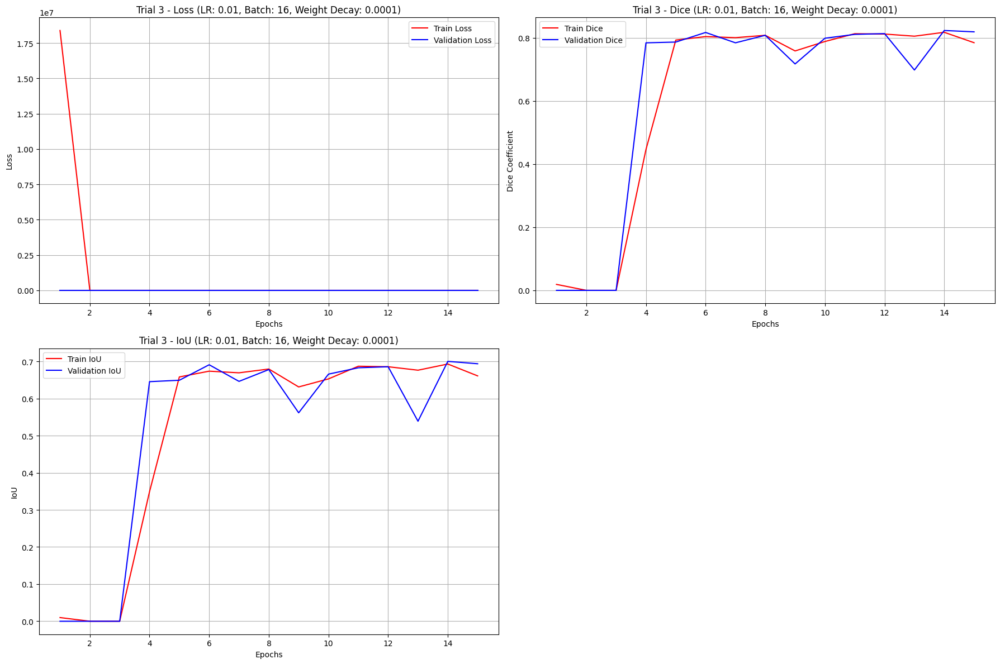



Trial 4/5 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 2.1845


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.2714


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.3418


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.2567


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.2237


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.08batch/s]

Training Loss: 0.1946


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.1442


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:21,  1.10batch/s]

Training Loss: 0.1273


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0996


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.10batch/s]

Training Loss: 0.1340


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0773


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.4055


Epoch 1 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.3815


Epoch 1 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0894


Epoch 1 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.1290


Epoch 1 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.2346


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.1345


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0775


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0544


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0612


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0732


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0630


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0585


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0478


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0580


Epoch 1 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.08batch/s]

Training Loss: 0.0587


Epoch 1 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0514


Epoch 1 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.07batch/s]

Training Loss: 0.0747


Epoch 1 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.06batch/s]

Training Loss: 0.0837


Epoch 1 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0564


Epoch 1 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0559


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.1093




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:05,  1.55batch/s]

Validation Loss: 0.0620


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0609


Epoch 1 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0650


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0453


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0567


Epoch 1 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0693


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0596


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0627


Epoch 1 Validation: 100%|██████████| 10/10 [00:05<00:00,  1.67batch/s]


Validation Loss: 0.0742
Validation Loss: 0.0321
Epoch 1, Validation Loss: 0.0615, Validation Dice: 0.7242, Validation IoU: 0.5698




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0638


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0544


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0639


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0498


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0575


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0630


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0600


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0474


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0684


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0425


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0481


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0461


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0523


Epoch 2 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0637


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0468


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0466


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 0.0519


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0564


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0702


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0413


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0374


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0548


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0318


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0459


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0502


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0473


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0440


Epoch 2 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0764


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0407


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0504


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0432


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0343




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0504


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0539


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0598


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0555


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0508


Epoch 2 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0561


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0671


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0636


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0566
Validation Loss: 0.0272
Epoch 2, Validation Loss: 0.0569, Validation Dice: 0.7907, Validation IoU: 0.6541




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0511


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0524


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0378


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0621


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0547


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0435


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0444


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0405


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0416


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0417


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0368


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0462


Epoch 3 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0412


Epoch 3 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0585


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0485


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0444


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0383


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0404


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.08batch/s]

Training Loss: 0.0481


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.09batch/s]

Training Loss: 0.0416


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0520


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0351


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0451


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0327


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0351


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0371


Epoch 3 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0424


Epoch 3 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0439


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0653


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0549


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0508


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0377




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.55batch/s]

Validation Loss: 0.0408


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0423


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0491


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0446


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0404


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0453


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0545


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0511


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0488
Validation Loss: 0.0223
Epoch 3, Validation Loss: 0.0462, Validation Dice: 0.8372, Validation IoU: 0.7204




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0453


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0426


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0418


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0413


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0302


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0526


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0357


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0433


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0382


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0824


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0678


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0355


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0483


Epoch 4 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0566


Epoch 4 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0355


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0643


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0694


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0465


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0299


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0559


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0488


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0492


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0410


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0415


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0310


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0328


Epoch 4 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0410


Epoch 4 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0392


Epoch 4 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0372


Epoch 4 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0504


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0494


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0419




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0302


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0327


Epoch 4 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0348


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0304


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0302


Epoch 4 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0359


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0372


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0383


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0406
Validation Loss: 0.0221
Epoch 4, Validation Loss: 0.0344, Validation Dice: 0.8660, Validation IoU: 0.7641




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0245


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0422


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0384


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0486


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0454


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0464


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0362


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0249


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0367


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0411


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0334


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0344


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0346


Epoch 5 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0337


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0332


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0417


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0474


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0301


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0441


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0339


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0332


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0413


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0396


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0243


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0330


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0378


Epoch 5 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0346


Epoch 5 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0358


Epoch 5 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0322


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0356


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0266


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0303




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0270


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.47batch/s]

Validation Loss: 0.0285


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0319


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0274


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.45batch/s]

Validation Loss: 0.0267


Epoch 5 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0321


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0335


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0377


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0372
Validation Loss: 0.0209
Epoch 5, Validation Loss: 0.0313, Validation Dice: 0.8763, Validation IoU: 0.7804




Epoch 6 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0269


Epoch 6 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0293


Epoch 6 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0310


Epoch 6 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0293


Epoch 6 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0312


Epoch 6 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0334


Epoch 6 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0307


Epoch 6 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.0369


Epoch 6 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0312


Epoch 6 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0323


Epoch 6 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0213


Epoch 6 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0285


Epoch 6 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0325


Epoch 6 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0350


Epoch 6 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0364


Epoch 6 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0301


Epoch 6 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0355


Epoch 6 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0430


Epoch 6 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.08batch/s]

Training Loss: 0.0338


Epoch 6 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0415


Epoch 6 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.0307


Epoch 6 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 0.0307


Epoch 6 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0318


Epoch 6 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0373


Epoch 6 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0326


Epoch 6 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0323


Epoch 6 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0361


Epoch 6 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0306


Epoch 6 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0480


Epoch 6 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0292


Epoch 6 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0366


Epoch 6 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0203




Epoch 6 Validation:  10%|█         | 1/10 [00:00<00:06,  1.43batch/s]

Validation Loss: 0.0269


Epoch 6 Validation:  20%|██        | 2/10 [00:01<00:05,  1.48batch/s]

Validation Loss: 0.0278


Epoch 6 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0309


Epoch 6 Validation:  40%|████      | 4/10 [00:02<00:04,  1.38batch/s]

Validation Loss: 0.0268


Epoch 6 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.42batch/s]

Validation Loss: 0.0274


Epoch 6 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.45batch/s]

Validation Loss: 0.0309


Epoch 6 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.0330


Epoch 6 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0384


Epoch 6 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.61batch/s]


Validation Loss: 0.0350
Validation Loss: 0.0215
Epoch 6, Validation Loss: 0.0307, Validation Dice: 0.8754, Validation IoU: 0.7790




Epoch 7 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0333


Epoch 7 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0320


Epoch 7 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0602


Epoch 7 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0596


Epoch 7 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0441


Epoch 7 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0277


Epoch 7 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0322


Epoch 7 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0386


Epoch 7 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0340


Epoch 7 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0389


Epoch 7 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0258


Epoch 7 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0292


Epoch 7 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0316


Epoch 7 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0314


Epoch 7 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0409


Epoch 7 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0289


Epoch 7 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.06batch/s]

Training Loss: 0.0261


Epoch 7 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0388


Epoch 7 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0327


Epoch 7 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0400


Epoch 7 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0502


Epoch 7 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0287


Epoch 7 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0351


Epoch 7 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0327


Epoch 7 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0406


Epoch 7 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0312


Epoch 7 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.0319


Epoch 7 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.0289


Epoch 7 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0260


Epoch 7 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0329


Epoch 7 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0335


Epoch 7 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0391




Epoch 7 Validation:  10%|█         | 1/10 [00:00<00:06,  1.48batch/s]

Validation Loss: 0.0249


Epoch 7 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0278


Epoch 7 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0274


Epoch 7 Validation:  40%|████      | 4/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0246


Epoch 7 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0250


Epoch 7 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0305


Epoch 7 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0302


Epoch 7 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0339


Epoch 7 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0359
Validation Loss: 0.0186
Epoch 7, Validation Loss: 0.0288, Validation Dice: 0.8856, Validation IoU: 0.7952




Epoch 8 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0240


Epoch 8 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0318


Epoch 8 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0291


Epoch 8 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0320


Epoch 8 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0337


Epoch 8 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.08batch/s]

Training Loss: 0.0282


Epoch 8 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0308


Epoch 8 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0346


Epoch 8 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0301


Epoch 8 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0463


Epoch 8 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0342


Epoch 8 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0303


Epoch 8 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0295


Epoch 8 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0297


Epoch 8 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0310


Epoch 8 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0268


Epoch 8 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0316


Epoch 8 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0286


Epoch 8 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0257


Epoch 8 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0336


Epoch 8 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0319


Epoch 8 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0423


Epoch 8 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0359


Epoch 8 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0291


Epoch 8 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0271


Epoch 8 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0397


Epoch 8 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0418


Epoch 8 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.07batch/s]

Training Loss: 0.0280


Epoch 8 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0435


Epoch 8 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0362


Epoch 8 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0338


Epoch 8 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0259




Epoch 8 Validation:  10%|█         | 1/10 [00:00<00:05,  1.55batch/s]

Validation Loss: 0.0234


Epoch 8 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0260


Epoch 8 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0269


Epoch 8 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.0217


Epoch 8 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0242


Epoch 8 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0294


Epoch 8 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0265


Epoch 8 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0341


Epoch 8 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0354
Validation Loss: 0.0213
Epoch 8, Validation Loss: 0.0275, Validation Dice: 0.8853, Validation IoU: 0.7948




Epoch 9 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0304


Epoch 9 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0330


Epoch 9 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0329


Epoch 9 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.0359


Epoch 9 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0280


Epoch 9 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0295


Epoch 9 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0368


Epoch 9 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0400


Epoch 9 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0290


Epoch 9 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0336


Epoch 9 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0203


Epoch 9 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0309


Epoch 9 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0224


Epoch 9 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.0275


Epoch 9 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0291


Epoch 9 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0282


Epoch 9 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0291


Epoch 9 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.08batch/s]

Training Loss: 0.0403


Epoch 9 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0298


Epoch 9 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0280


Epoch 9 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0244


Epoch 9 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0256


Epoch 9 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0236


Epoch 9 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0231


Epoch 9 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0280


Epoch 9 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0363


Epoch 9 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0310


Epoch 9 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0290


Epoch 9 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0288


Epoch 9 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0272


Epoch 9 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0268


Epoch 9 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0306




Epoch 9 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0262


Epoch 9 Validation:  20%|██        | 2/10 [00:01<00:05,  1.54batch/s]

Validation Loss: 0.0296


Epoch 9 Validation:  30%|███       | 3/10 [00:01<00:04,  1.49batch/s]

Validation Loss: 0.0297


Epoch 9 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0220


Epoch 9 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0271


Epoch 9 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0343


Epoch 9 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0269


Epoch 9 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0361


Epoch 9 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0404
Validation Loss: 0.0214
Epoch 9, Validation Loss: 0.0302, Validation Dice: 0.8722, Validation IoU: 0.7742




Epoch 10 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0378


Epoch 10 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0237


Epoch 10 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0278


Epoch 10 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0249


Epoch 10 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0247


Epoch 10 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0313


Epoch 10 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0227


Epoch 10 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0312


Epoch 10 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0238


Epoch 10 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0380


Epoch 10 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0363


Epoch 10 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0288


Epoch 10 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0291


Epoch 10 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.07batch/s]

Training Loss: 0.0240


Epoch 10 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0356


Epoch 10 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0313


Epoch 10 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0239


Epoch 10 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0453


Epoch 10 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0265


Epoch 10 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0311


Epoch 10 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0329


Epoch 10 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0228


Epoch 10 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0216


Epoch 10 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0311


Epoch 10 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0281


Epoch 10 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0269


Epoch 10 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0238


Epoch 10 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0274


Epoch 10 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0289


Epoch 10 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0302


Epoch 10 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0257


Epoch 10 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0318




Epoch 10 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0222


Epoch 10 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0240


Epoch 10 Validation:  30%|███       | 3/10 [00:01<00:04,  1.54batch/s]

Validation Loss: 0.0258


Epoch 10 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0224


Epoch 10 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0225


Epoch 10 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0269


Epoch 10 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0274


Epoch 10 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0321


Epoch 10 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0301
Validation Loss: 0.0158
Epoch 10, Validation Loss: 0.0259, Validation Dice: 0.8993, Validation IoU: 0.8174




Epoch 11 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0233


Epoch 11 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0271


Epoch 11 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.0196


Epoch 11 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0265


Epoch 11 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.0205


Epoch 11 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.0266


Epoch 11 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0252


Epoch 11 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0204


Epoch 11 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0320


Epoch 11 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0249


Epoch 11 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0323


Epoch 11 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0300


Epoch 11 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0240


Epoch 11 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.09batch/s]

Training Loss: 0.0202


Epoch 11 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0275


Epoch 11 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0335


Epoch 11 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0255


Epoch 11 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0221


Epoch 11 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0382


Epoch 11 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0291


Epoch 11 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0243


Epoch 11 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0282


Epoch 11 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0267


Epoch 11 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0356


Epoch 11 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0366


Epoch 11 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0255


Epoch 11 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.09batch/s]

Training Loss: 0.0303


Epoch 11 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0323


Epoch 11 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0274


Epoch 11 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0266


Epoch 11 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0284


Epoch 11 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0322




Epoch 11 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0229


Epoch 11 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0285


Epoch 11 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0265


Epoch 11 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0204


Epoch 11 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0255


Epoch 11 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.50batch/s]

Validation Loss: 0.0309


Epoch 11 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0252


Epoch 11 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0327


Epoch 11 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0356
Validation Loss: 0.0171
Epoch 11, Validation Loss: 0.0275, Validation Dice: 0.8893, Validation IoU: 0.8012




Epoch 12 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.0331


Epoch 12 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0344


Epoch 12 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0236


Epoch 12 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0254


Epoch 12 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0256


Epoch 12 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0259


Epoch 12 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0290


Epoch 12 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0239


Epoch 12 Training:  28%|██▊       | 9/32 [00:08<00:20,  1.10batch/s]

Training Loss: 0.0267


Epoch 12 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0293


Epoch 12 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0288


Epoch 12 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0321


Epoch 12 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0314


Epoch 12 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0275


Epoch 12 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0239


Epoch 12 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0335


Epoch 12 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 0.0297


Epoch 12 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0334


Epoch 12 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0232


Epoch 12 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0289


Epoch 12 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0298


Epoch 12 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0240


Epoch 12 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0238


Epoch 12 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0270


Epoch 12 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0256


Epoch 12 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0340


Epoch 12 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.0235


Epoch 12 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 0.0228


Epoch 12 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 0.0261


Epoch 12 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.06batch/s]

Training Loss: 0.0255


Epoch 12 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0326


Epoch 12 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0212




Epoch 12 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0244


Epoch 12 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0285


Epoch 12 Validation:  30%|███       | 3/10 [00:01<00:04,  1.50batch/s]

Validation Loss: 0.0271


Epoch 12 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0205


Epoch 12 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0249


Epoch 12 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0319


Epoch 12 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0264


Epoch 12 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.46batch/s]

Validation Loss: 0.0313


Epoch 12 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0377
Validation Loss: 0.0165
Epoch 12, Validation Loss: 0.0280, Validation Dice: 0.8823, Validation IoU: 0.7901




Epoch 13 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0239


Epoch 13 Training:   6%|▋         | 2/32 [00:01<00:27,  1.07batch/s]

Training Loss: 0.0290


Epoch 13 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0291


Epoch 13 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0234


Epoch 13 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0200


Epoch 13 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0284


Epoch 13 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0204


Epoch 13 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0350


Epoch 13 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0247


Epoch 13 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0235


Epoch 13 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0280


Epoch 13 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0230


Epoch 13 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.0309


Epoch 13 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 0.0268


Epoch 13 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0290


Epoch 13 Training:  50%|█████     | 16/32 [00:14<00:15,  1.06batch/s]

Training Loss: 0.0273


Epoch 13 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0237


Epoch 13 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0222


Epoch 13 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0262


Epoch 13 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.0259


Epoch 13 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0258


Epoch 13 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0316


Epoch 13 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0253


Epoch 13 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0302


Epoch 13 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0297


Epoch 13 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0309


Epoch 13 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0215


Epoch 13 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 0.0337


Epoch 13 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 0.0234


Epoch 13 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.0244


Epoch 13 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 0.0245


Epoch 13 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0283




Epoch 13 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.0205


Epoch 13 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0239


Epoch 13 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0259


Epoch 13 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0199


Epoch 13 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0227


Epoch 13 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.0266


Epoch 13 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0253


Epoch 13 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0318


Epoch 13 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0297
Validation Loss: 0.0156
Epoch 13, Validation Loss: 0.0251, Validation Dice: 0.9012, Validation IoU: 0.8205




Epoch 14 Training:   3%|▎         | 1/32 [00:00<00:29,  1.03batch/s]

Training Loss: 0.0237


Epoch 14 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0276


Epoch 14 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0282


Epoch 14 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0184


Epoch 14 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.0343


Epoch 14 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0333


Epoch 14 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0305


Epoch 14 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.0290


Epoch 14 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0290


Epoch 14 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0242


Epoch 14 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0229


Epoch 14 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0303


Epoch 14 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.0259


Epoch 14 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 0.0324


Epoch 14 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0303


Epoch 14 Training:  50%|█████     | 16/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.0192


Epoch 14 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.0265


Epoch 14 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.06batch/s]

Training Loss: 0.0288


Epoch 14 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.0187


Epoch 14 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.04batch/s]

Training Loss: 0.0318


Epoch 14 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.0339


Epoch 14 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.0235


Epoch 14 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.05batch/s]

Training Loss: 0.0303


Epoch 14 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.06batch/s]

Training Loss: 0.0324


Epoch 14 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0211


Epoch 14 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0335


Epoch 14 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0350


Epoch 14 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0261


Epoch 14 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.08batch/s]

Training Loss: 0.0304


Epoch 14 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.08batch/s]

Training Loss: 0.0377


Epoch 14 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.08batch/s]

Training Loss: 0.0318


Epoch 14 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.0274




Epoch 14 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0215


Epoch 14 Validation:  20%|██        | 2/10 [00:01<00:05,  1.48batch/s]

Validation Loss: 0.0263


Epoch 14 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0255


Epoch 14 Validation:  40%|████      | 4/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0187


Epoch 14 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.47batch/s]

Validation Loss: 0.0238


Epoch 14 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0287


Epoch 14 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0245


Epoch 14 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0301


Epoch 14 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0328
Validation Loss: 0.0164
Epoch 14, Validation Loss: 0.0257, Validation Dice: 0.8963, Validation IoU: 0.8125




Epoch 15 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0365


Epoch 15 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.0319


Epoch 15 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0227


Epoch 15 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0245


Epoch 15 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0222


Epoch 15 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0244


Epoch 15 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0286


Epoch 15 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0240


Epoch 15 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0215


Epoch 15 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0187


Epoch 15 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0317


Epoch 15 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0264


Epoch 15 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0194


Epoch 15 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0205


Epoch 15 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0240


Epoch 15 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0222


Epoch 15 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0249


Epoch 15 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0174


Epoch 15 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0238


Epoch 15 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0246


Epoch 15 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0235


Epoch 15 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0225


Epoch 15 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0260


Epoch 15 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0244


Epoch 15 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0232


Epoch 15 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0235


Epoch 15 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0273


Epoch 15 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.07batch/s]

Training Loss: 0.0221


Epoch 15 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0223


Epoch 15 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0319


Epoch 15 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0235


Epoch 15 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0211




Epoch 15 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0173


Epoch 15 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0212


Epoch 15 Validation:  30%|███       | 3/10 [00:01<00:04,  1.54batch/s]

Validation Loss: 0.0216


Epoch 15 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0174


Epoch 15 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0186


Epoch 15 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0230


Epoch 15 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0219


Epoch 15 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0247


Epoch 15 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0259
Validation Loss: 0.0122
Epoch 15, Validation Loss: 0.0212, Validation Dice: 0.9161, Validation IoU: 0.8455




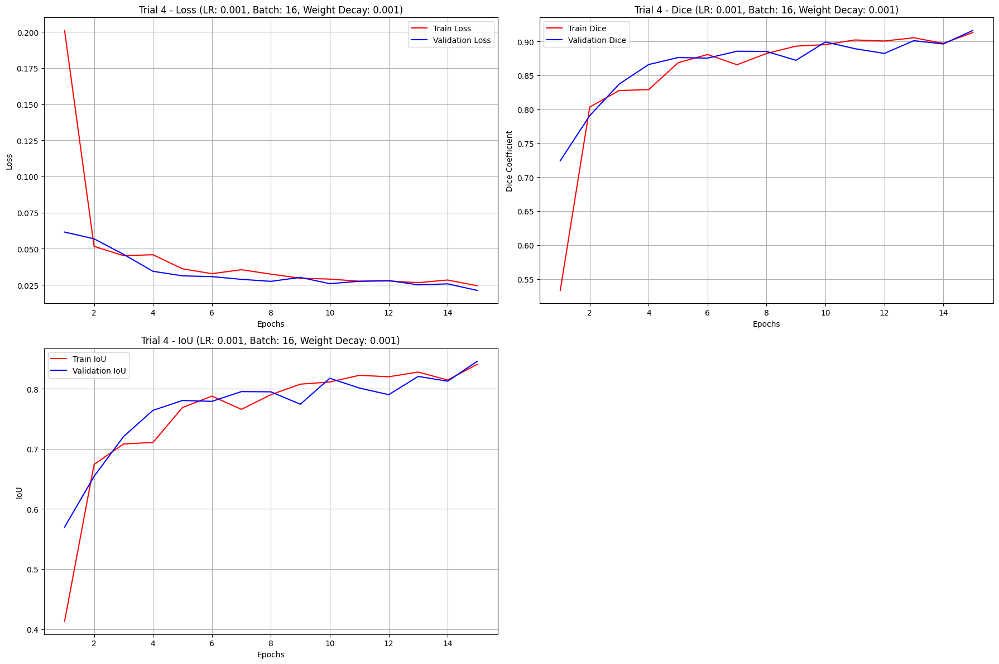



Trial 5/5 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.0001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.6400


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 1.5640


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.2902


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.08batch/s]

Training Loss: 0.2782


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.2384


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.1781


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.1588


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.1389


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.1005


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0892


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.0935


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 0.0613


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0598


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.08batch/s]

Training Loss: 0.1504


Epoch 1 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0902


Epoch 1 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.1114


Epoch 1 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0994


Epoch 1 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0642


Epoch 1 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.1150


Epoch 1 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.1601


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0966


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0654


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0716


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0533


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0632


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0840


Epoch 1 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0565


Epoch 1 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0691


Epoch 1 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0506


Epoch 1 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0416


Epoch 1 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0524


Epoch 1 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0503




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.0601


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0589


Epoch 1 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0610


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0444


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0549


Epoch 1 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0681


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0575


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0583


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0717
Validation Loss: 0.0271
Epoch 1, Validation Loss: 0.0592, Validation Dice: 0.7038, Validation IoU: 0.5456




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0644


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.0580


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0478


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0514


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0551


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0461


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0459


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0480


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0656


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0441


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.10batch/s]

Training Loss: 0.0498


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0473


Epoch 2 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0446


Epoch 2 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0512


Epoch 2 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0660


Epoch 2 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0462


Epoch 2 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0411


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.08batch/s]

Training Loss: 0.0448


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0489


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0413


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0414


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0473


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0418


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0377


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0469


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0625


Epoch 2 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0355


Epoch 2 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0344


Epoch 2 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0365


Epoch 2 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0409


Epoch 2 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0566


Epoch 2 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0468




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0335


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0352


Epoch 2 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0379


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0321


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.47batch/s]

Validation Loss: 0.0327


Epoch 2 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0391


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0398


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0413


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0425
Validation Loss: 0.0223
Epoch 2, Validation Loss: 0.0370, Validation Dice: 0.8516, Validation IoU: 0.7420




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.0347


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.0812


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0536


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0468


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0393


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0380


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0430


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0446


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0455


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0484


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0402


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0283


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0315


Epoch 3 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0408


Epoch 3 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0353


Epoch 3 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0439


Epoch 3 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.07batch/s]

Training Loss: 0.0427


Epoch 3 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0412


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.07batch/s]

Training Loss: 0.0308


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0573


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0708


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0399


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0496


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0688


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0546


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0399


Epoch 3 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.09batch/s]

Training Loss: 0.0501


Epoch 3 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0519


Epoch 3 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0471


Epoch 3 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0387


Epoch 3 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0367


Epoch 3 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0483




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0469


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0480


Epoch 3 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0523


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0363


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0466


Epoch 3 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0574


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0453


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0521


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.66batch/s]


Validation Loss: 0.0646
Validation Loss: 0.0340
Epoch 3, Validation Loss: 0.0498, Validation Dice: 0.7536, Validation IoU: 0.6066




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0524


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.0377


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:26,  1.07batch/s]

Training Loss: 0.0389


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0411


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0408


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0381


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0459


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0307


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0398


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0294


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0264


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0290


Epoch 4 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0312


Epoch 4 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0308


Epoch 4 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0652


Epoch 4 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0314


Epoch 4 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0415


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0482


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0394


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0542


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0416


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0392


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0329


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0552


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0307


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.0489


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.0400


Epoch 4 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.06batch/s]

Training Loss: 0.0415


Epoch 4 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0367


Epoch 4 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0400


Epoch 4 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0331


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0592




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0453


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.42batch/s]

Validation Loss: 0.0467


Epoch 4 Validation:  30%|███       | 3/10 [00:02<00:04,  1.47batch/s]

Validation Loss: 0.0538


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0480


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0452


Epoch 4 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0519


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0599


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0599


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0523
Validation Loss: 0.0210
Epoch 4, Validation Loss: 0.0512, Validation Dice: 0.8081, Validation IoU: 0.6784




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:28,  1.09batch/s]

Training Loss: 0.0399


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0406


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0390


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.0388


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0341


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0349


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0416


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0339


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0334


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0327


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0373


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0392


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0331


Epoch 5 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0366


Epoch 5 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0236


Epoch 5 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0398


Epoch 5 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0308


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0307


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0295


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0450


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0402


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0398


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0501


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0441


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0515


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0492


Epoch 5 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0291


Epoch 5 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0451


Epoch 5 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0429


Epoch 5 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.07batch/s]

Training Loss: 0.0371


Epoch 5 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0427


Epoch 5 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0462




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0266


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0283


Epoch 5 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0327


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:03,  1.52batch/s]

Validation Loss: 0.0264


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0265


Epoch 5 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.52batch/s]

Validation Loss: 0.0314


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0338


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0369


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0353
Validation Loss: 0.0229
Epoch 5, Validation Loss: 0.0308, Validation Dice: 0.8743, Validation IoU: 0.7773




Epoch 6 Training:   3%|▎         | 1/32 [00:00<00:28,  1.10batch/s]

Training Loss: 0.0384


Epoch 6 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0394


Epoch 6 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0378


Epoch 6 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.08batch/s]

Training Loss: 0.0296


Epoch 6 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0391


Epoch 6 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0347


Epoch 6 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0298


Epoch 6 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0484


Epoch 6 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0404


Epoch 6 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0292


Epoch 6 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0357


Epoch 6 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0264


Epoch 6 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0292


Epoch 6 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0324


Epoch 6 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0299


Epoch 6 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0294


Epoch 6 Training:  53%|█████▎    | 17/32 [00:15<00:14,  1.06batch/s]

Training Loss: 0.0312


Epoch 6 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.0265


Epoch 6 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0274


Epoch 6 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.07batch/s]

Training Loss: 0.0341


Epoch 6 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0321


Epoch 6 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.0303


Epoch 6 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0277


Epoch 6 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.0329


Epoch 6 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.0257


Epoch 6 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0368


Epoch 6 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0245


Epoch 6 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.08batch/s]

Training Loss: 0.0352


Epoch 6 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0338


Epoch 6 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0251


Epoch 6 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0263


Epoch 6 Training: 100%|██████████| 32/32 [00:29<00:00,  1.08batch/s]


Training Loss: 0.0296




Epoch 6 Validation:  10%|█         | 1/10 [00:00<00:06,  1.48batch/s]

Validation Loss: 0.0242


Epoch 6 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0251


Epoch 6 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0277


Epoch 6 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0224


Epoch 6 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0241


Epoch 6 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0268


Epoch 6 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0313


Epoch 6 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0331


Epoch 6 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0304
Validation Loss: 0.0209
Epoch 6, Validation Loss: 0.0272, Validation Dice: 0.8938, Validation IoU: 0.8084




Epoch 7 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0251


Epoch 7 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0216


Epoch 7 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0354


Epoch 7 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0294


Epoch 7 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0281


Epoch 7 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0342


Epoch 7 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0271


Epoch 7 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0371


Epoch 7 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0314


Epoch 7 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0289


Epoch 7 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0288


Epoch 7 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0302


Epoch 7 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0386


Epoch 7 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0292


Epoch 7 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0269


Epoch 7 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0413


Epoch 7 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0283


Epoch 7 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0319


Epoch 7 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0293


Epoch 7 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0281


Epoch 7 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.0342


Epoch 7 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0308


Epoch 7 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0416


Epoch 7 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0345


Epoch 7 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0341


Epoch 7 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0410


Epoch 7 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0236


Epoch 7 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0332


Epoch 7 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0328


Epoch 7 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0236


Epoch 7 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.07batch/s]

Training Loss: 0.0217


Epoch 7 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0263




Epoch 7 Validation:  10%|█         | 1/10 [00:00<00:06,  1.48batch/s]

Validation Loss: 0.0222


Epoch 7 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0253


Epoch 7 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0293


Epoch 7 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0234


Epoch 7 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0261


Epoch 7 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0284


Epoch 7 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0322


Epoch 7 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0363


Epoch 7 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0337
Validation Loss: 0.0220
Epoch 7, Validation Loss: 0.0285, Validation Dice: 0.8848, Validation IoU: 0.7941




Epoch 8 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0312


Epoch 8 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0366


Epoch 8 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0278


Epoch 8 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0284


Epoch 8 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0301


Epoch 8 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0209


Epoch 8 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.07batch/s]

Training Loss: 0.0303


Epoch 8 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0266


Epoch 8 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0334


Epoch 8 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0237


Epoch 8 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0321


Epoch 8 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0289


Epoch 8 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0326


Epoch 8 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.10batch/s]

Training Loss: 0.0369


Epoch 8 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.10batch/s]

Training Loss: 0.0297


Epoch 8 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0279


Epoch 8 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0265


Epoch 8 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0251


Epoch 8 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0254


Epoch 8 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0207


Epoch 8 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0239


Epoch 8 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0286


Epoch 8 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0229


Epoch 8 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0223


Epoch 8 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0237


Epoch 8 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.08batch/s]

Training Loss: 0.0259


Epoch 8 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0214


Epoch 8 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0335


Epoch 8 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0231


Epoch 8 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0292


Epoch 8 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0262


Epoch 8 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0270




Epoch 8 Validation:  10%|█         | 1/10 [00:00<00:06,  1.45batch/s]

Validation Loss: 0.0232


Epoch 8 Validation:  20%|██        | 2/10 [00:01<00:05,  1.47batch/s]

Validation Loss: 0.0263


Epoch 8 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0273


Epoch 8 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0215


Epoch 8 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0268


Epoch 8 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0335


Epoch 8 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0257


Epoch 8 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0355


Epoch 8 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0419
Validation Loss: 0.0209
Epoch 8, Validation Loss: 0.0290, Validation Dice: 0.8785, Validation IoU: 0.7843




Epoch 9 Training:   3%|▎         | 1/32 [00:00<00:28,  1.07batch/s]

Training Loss: 0.0346


Epoch 9 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0222


Epoch 9 Training:   9%|▉         | 3/32 [00:02<00:26,  1.09batch/s]

Training Loss: 0.0210


Epoch 9 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0301


Epoch 9 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0244


Epoch 9 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0287


Epoch 9 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0240


Epoch 9 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.07batch/s]

Training Loss: 0.0229


Epoch 9 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.07batch/s]

Training Loss: 0.0242


Epoch 9 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.07batch/s]

Training Loss: 0.0238


Epoch 9 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0232


Epoch 9 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0297


Epoch 9 Training:  41%|████      | 13/32 [00:12<00:17,  1.08batch/s]

Training Loss: 0.0260


Epoch 9 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0470


Epoch 9 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0226


Epoch 9 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0223


Epoch 9 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0266


Epoch 9 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0243


Epoch 9 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0257


Epoch 9 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0251


Epoch 9 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0273


Epoch 9 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0221


Epoch 9 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0175


Epoch 9 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0179


Epoch 9 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.09batch/s]

Training Loss: 0.0182


Epoch 9 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.09batch/s]

Training Loss: 0.0188


Epoch 9 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0230


Epoch 9 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0200


Epoch 9 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0280


Epoch 9 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0293


Epoch 9 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0199


Epoch 9 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0299




Epoch 9 Validation:  10%|█         | 1/10 [00:00<00:06,  1.37batch/s]

Validation Loss: 0.0188


Epoch 9 Validation:  20%|██        | 2/10 [00:01<00:05,  1.45batch/s]

Validation Loss: 0.0224


Epoch 9 Validation:  30%|███       | 3/10 [00:02<00:04,  1.45batch/s]

Validation Loss: 0.0236


Epoch 9 Validation:  40%|████      | 4/10 [00:02<00:04,  1.47batch/s]

Validation Loss: 0.0198


Epoch 9 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.47batch/s]

Validation Loss: 0.0210


Epoch 9 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0258


Epoch 9 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.51batch/s]

Validation Loss: 0.0235


Epoch 9 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0299


Epoch 9 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0332
Validation Loss: 0.0152
Epoch 9, Validation Loss: 0.0242, Validation Dice: 0.9024, Validation IoU: 0.8226




Epoch 10 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0265


Epoch 10 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0284


Epoch 10 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0223


Epoch 10 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0277


Epoch 10 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0156


Epoch 10 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0253


Epoch 10 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0233


Epoch 10 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0198


Epoch 10 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0210


Epoch 10 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0399


Epoch 10 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0207


Epoch 10 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0329


Epoch 10 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0200


Epoch 10 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0255


Epoch 10 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0262


Epoch 10 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0226


Epoch 10 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0262


Epoch 10 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0233


Epoch 10 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0279


Epoch 10 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0247


Epoch 10 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0195


Epoch 10 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.0215


Epoch 10 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0219


Epoch 10 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0244


Epoch 10 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0328


Epoch 10 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.0205


Epoch 10 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0225


Epoch 10 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0260


Epoch 10 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0165


Epoch 10 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0293


Epoch 10 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0204


Epoch 10 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0228




Epoch 10 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0233


Epoch 10 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0247


Epoch 10 Validation:  30%|███       | 3/10 [00:01<00:04,  1.49batch/s]

Validation Loss: 0.0268


Epoch 10 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0245


Epoch 10 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0216


Epoch 10 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0254


Epoch 10 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0322


Epoch 10 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0318


Epoch 10 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0273
Validation Loss: 0.0121
Epoch 10, Validation Loss: 0.0263, Validation Dice: 0.8994, Validation IoU: 0.8174




Epoch 11 Training:   3%|▎         | 1/32 [00:00<00:28,  1.08batch/s]

Training Loss: 0.0270


Epoch 11 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0277


Epoch 11 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0194


Epoch 11 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0190


Epoch 11 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0235


Epoch 11 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0232


Epoch 11 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0305


Epoch 11 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0194


Epoch 11 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0248


Epoch 11 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0181


Epoch 11 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.08batch/s]

Training Loss: 0.0232


Epoch 11 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0159


Epoch 11 Training:  41%|████      | 13/32 [00:11<00:17,  1.09batch/s]

Training Loss: 0.0258


Epoch 11 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0171


Epoch 11 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0229


Epoch 11 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0194


Epoch 11 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.10batch/s]

Training Loss: 0.0182


Epoch 11 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0196


Epoch 11 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.10batch/s]

Training Loss: 0.0237


Epoch 11 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0178


Epoch 11 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0173


Epoch 11 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0215


Epoch 11 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.0141


Epoch 11 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0204


Epoch 11 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0157


Epoch 11 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.09batch/s]

Training Loss: 0.0246


Epoch 11 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0234


Epoch 11 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0364


Epoch 11 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0199


Epoch 11 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0300


Epoch 11 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0281


Epoch 11 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0194




Epoch 11 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0259


Epoch 11 Validation:  20%|██        | 2/10 [00:01<00:05,  1.53batch/s]

Validation Loss: 0.0258


Epoch 11 Validation:  30%|███       | 3/10 [00:01<00:04,  1.51batch/s]

Validation Loss: 0.0277


Epoch 11 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0260


Epoch 11 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0241


Epoch 11 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.46batch/s]

Validation Loss: 0.0270


Epoch 11 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.0324


Epoch 11 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0351


Epoch 11 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0286
Validation Loss: 0.0118
Epoch 11, Validation Loss: 0.0279, Validation Dice: 0.8954, Validation IoU: 0.8109




Epoch 12 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.0311


Epoch 12 Training:   6%|▋         | 2/32 [00:01<00:27,  1.09batch/s]

Training Loss: 0.0188


Epoch 12 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0257


Epoch 12 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0282


Epoch 12 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.08batch/s]

Training Loss: 0.0182


Epoch 12 Training:  19%|█▉        | 6/32 [00:05<00:23,  1.09batch/s]

Training Loss: 0.0297


Epoch 12 Training:  22%|██▏       | 7/32 [00:06<00:22,  1.09batch/s]

Training Loss: 0.0188


Epoch 12 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0199


Epoch 12 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0209


Epoch 12 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0235


Epoch 12 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0197


Epoch 12 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.08batch/s]

Training Loss: 0.0201


Epoch 12 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0249


Epoch 12 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.08batch/s]

Training Loss: 0.0167


Epoch 12 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.09batch/s]

Training Loss: 0.0238


Epoch 12 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0204


Epoch 12 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0226


Epoch 12 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0224


Epoch 12 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0226


Epoch 12 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0213


Epoch 12 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.09batch/s]

Training Loss: 0.0263


Epoch 12 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0241


Epoch 12 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0212


Epoch 12 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0183


Epoch 12 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.0227


Epoch 12 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.0241


Epoch 12 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0254


Epoch 12 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0209


Epoch 12 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.07batch/s]

Training Loss: 0.0260


Epoch 12 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0245


Epoch 12 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0202


Epoch 12 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0195




Epoch 12 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.0174


Epoch 12 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0201


Epoch 12 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0219


Epoch 12 Validation:  40%|████      | 4/10 [00:02<00:04,  1.42batch/s]

Validation Loss: 0.0153


Epoch 12 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.44batch/s]

Validation Loss: 0.0184


Epoch 12 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.45batch/s]

Validation Loss: 0.0200


Epoch 12 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.46batch/s]

Validation Loss: 0.0207


Epoch 12 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.45batch/s]

Validation Loss: 0.0267


Epoch 12 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.61batch/s]


Validation Loss: 0.0217
Validation Loss: 0.0135
Epoch 12, Validation Loss: 0.0202, Validation Dice: 0.9225, Validation IoU: 0.8564




Epoch 13 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0194


Epoch 13 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.0335


Epoch 13 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0198


Epoch 13 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.09batch/s]

Training Loss: 0.0183


Epoch 13 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.09batch/s]

Training Loss: 0.0233


Epoch 13 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.0225


Epoch 13 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0184


Epoch 13 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0255


Epoch 13 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.08batch/s]

Training Loss: 0.0173


Epoch 13 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0157


Epoch 13 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0232


Epoch 13 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0198


Epoch 13 Training:  41%|████      | 13/32 [00:12<00:17,  1.07batch/s]

Training Loss: 0.0178


Epoch 13 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 0.0246


Epoch 13 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0182


Epoch 13 Training:  50%|█████     | 16/32 [00:14<00:14,  1.07batch/s]

Training Loss: 0.0250


Epoch 13 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0203


Epoch 13 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.08batch/s]

Training Loss: 0.0170


Epoch 13 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0254


Epoch 13 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0199


Epoch 13 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0161


Epoch 13 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.09batch/s]

Training Loss: 0.0177


Epoch 13 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.09batch/s]

Training Loss: 0.0156


Epoch 13 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0154


Epoch 13 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0229


Epoch 13 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0228


Epoch 13 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.08batch/s]

Training Loss: 0.0160


Epoch 13 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.09batch/s]

Training Loss: 0.0205


Epoch 13 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0196


Epoch 13 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0184


Epoch 13 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0178


Epoch 13 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0194




Epoch 13 Validation:  10%|█         | 1/10 [00:00<00:05,  1.51batch/s]

Validation Loss: 0.0141


Epoch 13 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0177


Epoch 13 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0187


Epoch 13 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0149


Epoch 13 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0158


Epoch 13 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0175


Epoch 13 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0184


Epoch 13 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0215


Epoch 13 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0204
Validation Loss: 0.0104
Epoch 13, Validation Loss: 0.0176, Validation Dice: 0.9311, Validation IoU: 0.8713




Epoch 14 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.0203


Epoch 14 Training:   6%|▋         | 2/32 [00:01<00:27,  1.07batch/s]

Training Loss: 0.0120


Epoch 14 Training:   9%|▉         | 3/32 [00:02<00:26,  1.08batch/s]

Training Loss: 0.0183


Epoch 14 Training:  12%|█▎        | 4/32 [00:03<00:25,  1.08batch/s]

Training Loss: 0.0165


Epoch 14 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0172


Epoch 14 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0207


Epoch 14 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.08batch/s]

Training Loss: 0.0192


Epoch 14 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.09batch/s]

Training Loss: 0.0196


Epoch 14 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0156


Epoch 14 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.09batch/s]

Training Loss: 0.0211


Epoch 14 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0180


Epoch 14 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0241


Epoch 14 Training:  41%|████      | 13/32 [00:11<00:17,  1.08batch/s]

Training Loss: 0.0147


Epoch 14 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.09batch/s]

Training Loss: 0.0210


Epoch 14 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.08batch/s]

Training Loss: 0.0194


Epoch 14 Training:  50%|█████     | 16/32 [00:14<00:14,  1.09batch/s]

Training Loss: 0.0148


Epoch 14 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.09batch/s]

Training Loss: 0.0255


Epoch 14 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.09batch/s]

Training Loss: 0.0215


Epoch 14 Training:  59%|█████▉    | 19/32 [00:17<00:11,  1.09batch/s]

Training Loss: 0.0158


Epoch 14 Training:  62%|██████▎   | 20/32 [00:18<00:10,  1.09batch/s]

Training Loss: 0.0180


Epoch 14 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0204


Epoch 14 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0184


Epoch 14 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0194


Epoch 14 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.08batch/s]

Training Loss: 0.0178


Epoch 14 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0238


Epoch 14 Training:  81%|████████▏ | 26/32 [00:23<00:05,  1.08batch/s]

Training Loss: 0.0201


Epoch 14 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.07batch/s]

Training Loss: 0.0195


Epoch 14 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.08batch/s]

Training Loss: 0.0194


Epoch 14 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.09batch/s]

Training Loss: 0.0162


Epoch 14 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.09batch/s]

Training Loss: 0.0163


Epoch 14 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.09batch/s]

Training Loss: 0.0201


Epoch 14 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0208




Epoch 14 Validation:  10%|█         | 1/10 [00:00<00:05,  1.54batch/s]

Validation Loss: 0.0140


Epoch 14 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0168


Epoch 14 Validation:  30%|███       | 3/10 [00:01<00:04,  1.52batch/s]

Validation Loss: 0.0179


Epoch 14 Validation:  40%|████      | 4/10 [00:02<00:03,  1.50batch/s]

Validation Loss: 0.0139


Epoch 14 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.51batch/s]

Validation Loss: 0.0145


Epoch 14 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0166


Epoch 14 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.50batch/s]

Validation Loss: 0.0174


Epoch 14 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0204


Epoch 14 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.65batch/s]


Validation Loss: 0.0190
Validation Loss: 0.0113
Epoch 14, Validation Loss: 0.0167, Validation Dice: 0.9359, Validation IoU: 0.8797




Epoch 15 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.0136


Epoch 15 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0174


Epoch 15 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.0180


Epoch 15 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.08batch/s]

Training Loss: 0.0240


Epoch 15 Training:  16%|█▌        | 5/32 [00:04<00:24,  1.08batch/s]

Training Loss: 0.0302


Epoch 15 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.08batch/s]

Training Loss: 0.0212


Epoch 15 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.09batch/s]

Training Loss: 0.0235


Epoch 15 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.08batch/s]

Training Loss: 0.0181


Epoch 15 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.09batch/s]

Training Loss: 0.0204


Epoch 15 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.08batch/s]

Training Loss: 0.0209


Epoch 15 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.09batch/s]

Training Loss: 0.0245


Epoch 15 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.09batch/s]

Training Loss: 0.0223


Epoch 15 Training:  41%|████      | 13/32 [00:12<00:17,  1.09batch/s]

Training Loss: 0.0202


Epoch 15 Training:  44%|████▍     | 14/32 [00:12<00:16,  1.07batch/s]

Training Loss: 0.0156


Epoch 15 Training:  47%|████▋     | 15/32 [00:13<00:15,  1.07batch/s]

Training Loss: 0.0200


Epoch 15 Training:  50%|█████     | 16/32 [00:14<00:14,  1.08batch/s]

Training Loss: 0.0210


Epoch 15 Training:  53%|█████▎    | 17/32 [00:15<00:13,  1.08batch/s]

Training Loss: 0.0212


Epoch 15 Training:  56%|█████▋    | 18/32 [00:16<00:12,  1.08batch/s]

Training Loss: 0.0224


Epoch 15 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.08batch/s]

Training Loss: 0.0185


Epoch 15 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.08batch/s]

Training Loss: 0.0189


Epoch 15 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.08batch/s]

Training Loss: 0.0239


Epoch 15 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.08batch/s]

Training Loss: 0.0178


Epoch 15 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.08batch/s]

Training Loss: 0.0202


Epoch 15 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.09batch/s]

Training Loss: 0.0210


Epoch 15 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.08batch/s]

Training Loss: 0.0186


Epoch 15 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.08batch/s]

Training Loss: 0.0224


Epoch 15 Training:  84%|████████▍ | 27/32 [00:24<00:04,  1.08batch/s]

Training Loss: 0.0263


Epoch 15 Training:  88%|████████▊ | 28/32 [00:25<00:03,  1.07batch/s]

Training Loss: 0.0195


Epoch 15 Training:  91%|█████████ | 29/32 [00:26<00:02,  1.08batch/s]

Training Loss: 0.0280


Epoch 15 Training:  94%|█████████▍| 30/32 [00:27<00:01,  1.08batch/s]

Training Loss: 0.0155


Epoch 15 Training:  97%|█████████▋| 31/32 [00:28<00:00,  1.08batch/s]

Training Loss: 0.0209


Epoch 15 Training: 100%|██████████| 32/32 [00:29<00:00,  1.09batch/s]


Training Loss: 0.0159




Epoch 15 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0158


Epoch 15 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0182


Epoch 15 Validation:  30%|███       | 3/10 [00:01<00:04,  1.53batch/s]

Validation Loss: 0.0195


Epoch 15 Validation:  40%|████      | 4/10 [00:02<00:03,  1.51batch/s]

Validation Loss: 0.0163


Epoch 15 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.52batch/s]

Validation Loss: 0.0155


Epoch 15 Validation:  60%|██████    | 6/10 [00:03<00:02,  1.51batch/s]

Validation Loss: 0.0185


Epoch 15 Validation:  70%|███████   | 7/10 [00:04<00:01,  1.52batch/s]

Validation Loss: 0.0204


Epoch 15 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.51batch/s]

Validation Loss: 0.0240


Epoch 15 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.67batch/s]


Validation Loss: 0.0225
Validation Loss: 0.0140
Epoch 15, Validation Loss: 0.0189, Validation Dice: 0.9274, Validation IoU: 0.8649




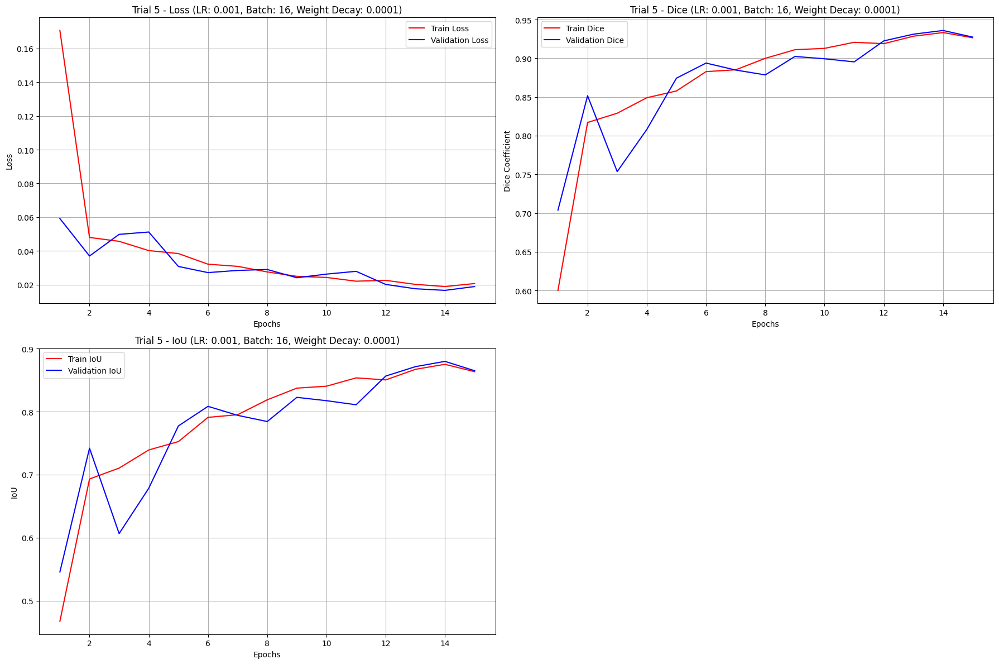



Best validation loss: 0.015402142208968772
Best params: learning rate = 0.001, batch size = 16, weight_decay = 0.0001


In [ ]:
# Tuning degli iperparametri
best_params = hyperparameter_tuning(trainset, validationset, criterion, device)

TESTING...
Final test loss: 0.015562855059633384, Final test Dice: 0.9457, Final test IoU: 0.8971
ALCUNE PREDIZIONI CORRETTE 



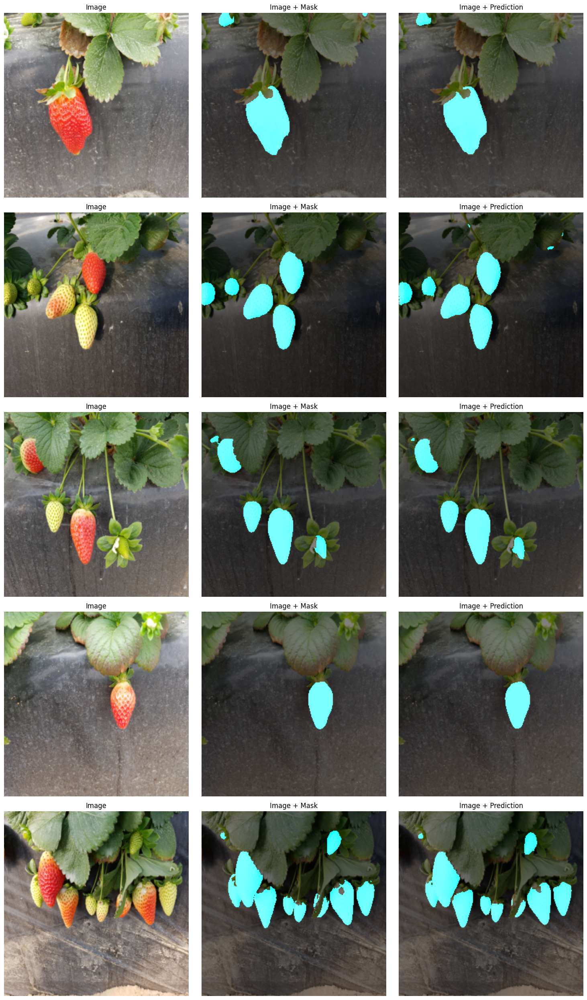

ALCUNE PREDIZIONI ERRATE 



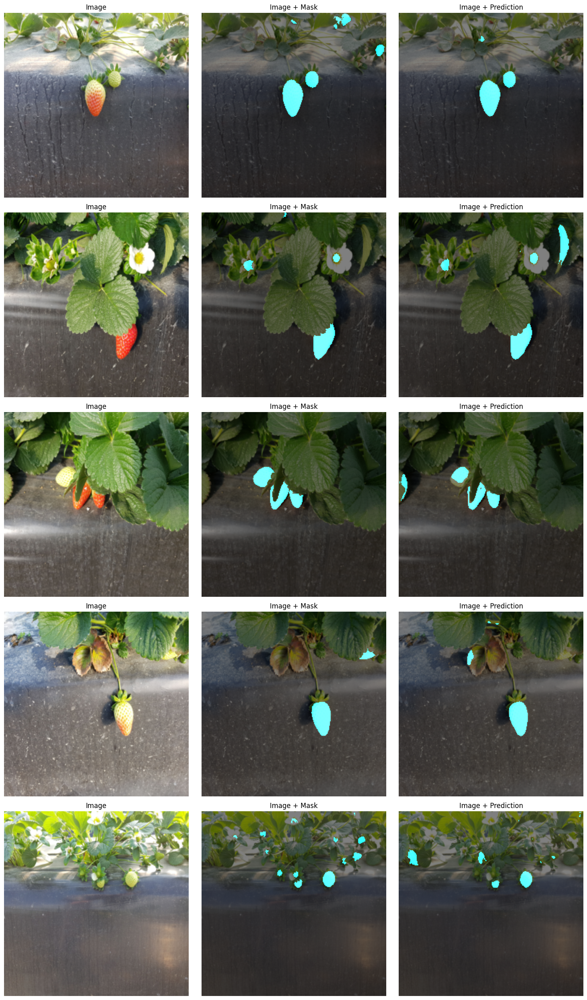

In [ ]:
# Caricamento miglior modello e failure analysis
model = UNet(in_channels=3, out_channels=1).to(device)
model.load_state_dict(torch.load('best_model_strawberry.pth', weights_only=True))

failure_analysis(model, criterion, testset, best_params, device)

# **TRANSFER LEARNING**

**NUOVO DATASET**

In [ ]:
class TomatoDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        image = ImageOps.exif_transpose(image)
        mask = Image.open(self.masks[idx]).convert("L")
        mask = ImageOps.exif_transpose(mask)

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)
            mask = (mask>0).float()

        return image, mask

**NUOVA FUNZIONE PER TUNING IPERPARAMETRI CON MODIFICA MODELLO**

In [ ]:
def hyperparameter_tuning_pretrained(trainset, validationset, criterion, device, num_trials=5, num_epochs=15):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    #File pdf per salvare i grafici
    pdf_filename = 'tomato_hyperparameter_tuning.pdf'
    pdf_pages = PdfPages(pdf_filename)

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=1)
        model.load_state_dict(torch.load('best_model_strawberry.pth', weights_only=True))
        model = model.to(device)

        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_dice, val_dice, train_iou, val_iou = train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(14, 12))

        plt.subplot(2, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 2)
        plt.plot(range(1, num_epochs+1), train_dice, label='Train Dice', color='red')
        plt.plot(range(1, num_epochs+1), val_dice, label='Validation Dice', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.title(f'Trial {trial + 1} - Dice (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 3)
        plt.plot(range(1, num_epochs+1), train_iou, label='Train IoU', color='red')
        plt.plot(range(1, num_epochs+1), val_iou, label='Validation IoU', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('IoU')
        plt.title(f'Trial {trial + 1} - IoU (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()

        pdf_pages.savefig()

        plt.show()

    pdf_pages.close()

    print(f'Best validation loss: {best_loss}')
    print(f'Best params: learning rate = {best_params[0]}, batch size = {best_params[1]}, weight_decay = {best_params[2]}')
    torch.save(best_model_wts, 'best_model_tomato.pth')

    return best_params

**MAIN TRANSFER LEARNING**

In [ ]:
image_dir2 = '/content/drive/MyDrive/TomatoDataset/img'
mask_dir2 = '/content/drive/MyDrive/TomatoDataset/masks'

# Creazione dataset
dataset2 = TomatoDataset(image_dir=image_dir2, mask_dir=mask_dir2, image_transform=image_transform, mask_transform=mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size2 = int(0.7 * len(dataset2))
validation_size2 = int(0.2 * len(dataset2))
test_size2 = len(dataset2) - train_size2 - validation_size2

trainset2, validationset2, testset2 = random_split(dataset2, [train_size2, validation_size2, test_size2])

criterion2 = nn.BCEWithLogitsLoss()

Trial 1/5 --> learning rate = 0.0001, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   7%|▋         | 1/15 [00:53<12:27, 53.42s/batch]

Training Loss: 0.4246


Epoch 1 Training:  13%|█▎        | 2/15 [01:31<09:37, 44.41s/batch]

Training Loss: 0.4128


Epoch 1 Training:  20%|██        | 3/15 [02:09<08:18, 41.55s/batch]

Training Loss: 0.3739


Epoch 1 Training:  27%|██▋       | 4/15 [02:45<07:12, 39.32s/batch]

Training Loss: 0.3125


Epoch 1 Training:  33%|███▎      | 5/15 [03:20<06:19, 37.91s/batch]

Training Loss: 0.3407


Epoch 1 Training:  40%|████      | 6/15 [03:58<05:39, 37.68s/batch]

Training Loss: 0.2620


Epoch 1 Training:  47%|████▋     | 7/15 [04:33<04:56, 37.05s/batch]

Training Loss: 0.2836


Epoch 1 Training:  53%|█████▎    | 8/15 [05:10<04:19, 37.01s/batch]

Training Loss: 0.2582


Epoch 1 Training:  60%|██████    | 9/15 [05:52<03:49, 38.32s/batch]

Training Loss: 0.2666


Epoch 1 Training:  67%|██████▋   | 10/15 [06:30<03:11, 38.21s/batch]

Training Loss: 0.2638


Epoch 1 Training:  73%|███████▎  | 11/15 [07:10<02:36, 39.01s/batch]

Training Loss: 0.2513


Epoch 1 Training:  80%|████████  | 12/15 [07:48<01:55, 38.48s/batch]

Training Loss: 0.2528


Epoch 1 Training:  87%|████████▋ | 13/15 [08:22<01:14, 37.29s/batch]

Training Loss: 0.2663


Epoch 1 Training:  93%|█████████▎| 14/15 [08:59<00:37, 37.08s/batch]

Training Loss: 0.2133


Epoch 1 Training: 100%|██████████| 15/15 [09:01<00:00, 36.10s/batch]


Training Loss: 0.1277




Epoch 1 Validation:  25%|██▌       | 1/4 [00:38<01:55, 38.60s/batch]

Validation Loss: 0.2974


Epoch 1 Validation:  50%|█████     | 2/4 [01:15<01:15, 37.74s/batch]

Validation Loss: 0.2694


Epoch 1 Validation:  75%|███████▌  | 3/4 [01:55<00:38, 38.73s/batch]

Validation Loss: 0.2405


Epoch 1 Validation: 100%|██████████| 4/4 [02:34<00:00, 38.64s/batch]


Validation Loss: 0.2206
Epoch 1, Validation Loss: 0.2570, Validation Dice: 0.4944, Validation IoU: 0.3292




Epoch 2 Training:   7%|▋         | 1/15 [00:06<01:35,  6.80s/batch]

Training Loss: 0.2393


Epoch 2 Training:  13%|█▎        | 2/15 [00:13<01:31,  7.02s/batch]

Training Loss: 0.2143


Epoch 2 Training:  20%|██        | 3/15 [00:20<01:22,  6.89s/batch]

Training Loss: 0.2248


Epoch 2 Training:  27%|██▋       | 4/15 [00:28<01:19,  7.26s/batch]

Training Loss: 0.2380


Epoch 2 Training:  33%|███▎      | 5/15 [00:35<01:12,  7.23s/batch]

Training Loss: 0.2281


Epoch 2 Training:  40%|████      | 6/15 [00:43<01:07,  7.45s/batch]

Training Loss: 0.2552


Epoch 2 Training:  47%|████▋     | 7/15 [00:51<00:59,  7.49s/batch]

Training Loss: 0.2108


Epoch 2 Training:  53%|█████▎    | 8/15 [00:58<00:51,  7.32s/batch]

Training Loss: 0.2397


Epoch 2 Training:  60%|██████    | 9/15 [01:06<00:45,  7.57s/batch]

Training Loss: 0.2354


Epoch 2 Training:  67%|██████▋   | 10/15 [01:13<00:37,  7.56s/batch]

Training Loss: 0.2172


Epoch 2 Training:  73%|███████▎  | 11/15 [01:20<00:29,  7.39s/batch]

Training Loss: 0.2224


Epoch 2 Training:  80%|████████  | 12/15 [01:28<00:22,  7.59s/batch]

Training Loss: 0.2140


Epoch 2 Training:  87%|████████▋ | 13/15 [01:36<00:15,  7.68s/batch]

Training Loss: 0.1985


Epoch 2 Training:  93%|█████████▎| 14/15 [01:43<00:07,  7.51s/batch]

Training Loss: 0.2562


Epoch 2 Training: 100%|██████████| 15/15 [01:44<00:00,  6.96s/batch]


Training Loss: 0.3346




Epoch 2 Validation:  25%|██▌       | 1/4 [00:06<00:20,  7.00s/batch]

Validation Loss: 0.2674


Epoch 2 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.30s/batch]

Validation Loss: 0.2242


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.06s/batch]

Validation Loss: 0.2179


Epoch 2 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.10s/batch]


Validation Loss: 0.1859
Epoch 2, Validation Loss: 0.2239, Validation Dice: 0.6120, Validation IoU: 0.4430




Epoch 3 Training:   7%|▋         | 1/15 [00:07<01:43,  7.38s/batch]

Training Loss: 0.2269


Epoch 3 Training:  13%|█▎        | 2/15 [00:15<01:41,  7.84s/batch]

Training Loss: 0.2218


Epoch 3 Training:  20%|██        | 3/15 [00:22<01:31,  7.62s/batch]

Training Loss: 0.1908


Epoch 3 Training:  27%|██▋       | 4/15 [00:31<01:25,  7.81s/batch]

Training Loss: 0.2265


Epoch 3 Training:  33%|███▎      | 5/15 [00:38<01:16,  7.65s/batch]

Training Loss: 0.2000


Epoch 3 Training:  40%|████      | 6/15 [00:46<01:10,  7.79s/batch]

Training Loss: 0.2354


Epoch 3 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.82s/batch]

Training Loss: 0.1898


Epoch 3 Training:  53%|█████▎    | 8/15 [01:01<00:53,  7.64s/batch]

Training Loss: 0.1967


Epoch 3 Training:  60%|██████    | 9/15 [01:09<00:46,  7.77s/batch]

Training Loss: 0.2111


Epoch 3 Training:  67%|██████▋   | 10/15 [01:16<00:37,  7.52s/batch]

Training Loss: 0.2304


Epoch 3 Training:  73%|███████▎  | 11/15 [01:23<00:29,  7.47s/batch]

Training Loss: 0.1753


Epoch 3 Training:  80%|████████  | 12/15 [01:30<00:21,  7.25s/batch]

Training Loss: 0.2201


Epoch 3 Training:  87%|████████▋ | 13/15 [01:37<00:14,  7.07s/batch]

Training Loss: 0.1714


Epoch 3 Training:  93%|█████████▎| 14/15 [01:44<00:07,  7.18s/batch]

Training Loss: 0.2144


Epoch 3 Training: 100%|██████████| 15/15 [01:45<00:00,  7.02s/batch]


Training Loss: 0.2488




Epoch 3 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.02s/batch]

Validation Loss: 0.2588


Epoch 3 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.37s/batch]

Validation Loss: 0.2102


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.25s/batch]

Validation Loss: 0.1994


Epoch 3 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.12s/batch]


Validation Loss: 0.1764
Epoch 3, Validation Loss: 0.2112, Validation Dice: 0.6201, Validation IoU: 0.4511




Epoch 4 Training:   7%|▋         | 1/15 [00:07<01:40,  7.18s/batch]

Training Loss: 0.2026


Epoch 4 Training:  13%|█▎        | 2/15 [00:15<01:40,  7.72s/batch]

Training Loss: 0.1961


Epoch 4 Training:  20%|██        | 3/15 [00:22<01:32,  7.71s/batch]

Training Loss: 0.1948


Epoch 4 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.86s/batch]

Training Loss: 0.2204


Epoch 4 Training:  33%|███▎      | 5/15 [00:38<01:17,  7.76s/batch]

Training Loss: 0.2295


Epoch 4 Training:  40%|████      | 6/15 [00:46<01:08,  7.64s/batch]

Training Loss: 0.1653


Epoch 4 Training:  47%|████▋     | 7/15 [00:52<00:58,  7.28s/batch]

Training Loss: 0.1972


Epoch 4 Training:  53%|█████▎    | 8/15 [01:00<00:52,  7.54s/batch]

Training Loss: 0.2000


Epoch 4 Training:  60%|██████    | 9/15 [01:08<00:45,  7.50s/batch]

Training Loss: 0.2001


Epoch 4 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.68s/batch]

Training Loss: 0.1759


Epoch 4 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.62s/batch]

Training Loss: 0.1779


Epoch 4 Training:  80%|████████  | 12/15 [01:31<00:23,  7.71s/batch]

Training Loss: 0.1941


Epoch 4 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.74s/batch]

Training Loss: 0.2075


Epoch 4 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.74s/batch]

Training Loss: 0.1912


Epoch 4 Training: 100%|██████████| 15/15 [01:47<00:00,  7.17s/batch]


Training Loss: 0.2272




Epoch 4 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.09s/batch]

Validation Loss: 0.2379


Epoch 4 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.43s/batch]

Validation Loss: 0.1949


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.20s/batch]

Validation Loss: 0.1894


Epoch 4 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.31s/batch]


Validation Loss: 0.1618
Epoch 4, Validation Loss: 0.1960, Validation Dice: 0.6563, Validation IoU: 0.4905




Epoch 5 Training:   7%|▋         | 1/15 [00:07<01:44,  7.49s/batch]

Training Loss: 0.2101


Epoch 5 Training:  13%|█▎        | 2/15 [00:15<01:42,  7.90s/batch]

Training Loss: 0.1855


Epoch 5 Training:  20%|██        | 3/15 [00:22<01:31,  7.59s/batch]

Training Loss: 0.2035


Epoch 5 Training:  27%|██▋       | 4/15 [00:30<01:22,  7.51s/batch]

Training Loss: 0.1987


Epoch 5 Training:  33%|███▎      | 5/15 [00:36<01:11,  7.16s/batch]

Training Loss: 0.1928


Epoch 5 Training:  40%|████      | 6/15 [00:44<01:05,  7.28s/batch]

Training Loss: 0.1712


Epoch 5 Training:  47%|████▋     | 7/15 [00:51<00:57,  7.19s/batch]

Training Loss: 0.1792


Epoch 5 Training:  53%|█████▎    | 8/15 [00:59<00:52,  7.54s/batch]

Training Loss: 0.1940


Epoch 5 Training:  60%|██████    | 9/15 [01:07<00:45,  7.66s/batch]

Training Loss: 0.1573


Epoch 5 Training:  67%|██████▋   | 10/15 [01:14<00:37,  7.59s/batch]

Training Loss: 0.1723


Epoch 5 Training:  73%|███████▎  | 11/15 [01:22<00:30,  7.56s/batch]

Training Loss: 0.2086


Epoch 5 Training:  80%|████████  | 12/15 [01:30<00:22,  7.63s/batch]

Training Loss: 0.2120


Epoch 5 Training:  87%|████████▋ | 13/15 [01:37<00:15,  7.55s/batch]

Training Loss: 0.1520


Epoch 5 Training:  93%|█████████▎| 14/15 [01:45<00:07,  7.58s/batch]

Training Loss: 0.1625


Epoch 5 Training: 100%|██████████| 15/15 [01:45<00:00,  7.05s/batch]


Training Loss: 0.1250




Epoch 5 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.09s/batch]

Validation Loss: 0.2413


Epoch 5 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.44s/batch]

Validation Loss: 0.1972


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.34s/batch]

Validation Loss: 0.2081


Epoch 5 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.35s/batch]


Validation Loss: 0.1655
Epoch 5, Validation Loss: 0.2030, Validation Dice: 0.6888, Validation IoU: 0.5270




Epoch 6 Training:   7%|▋         | 1/15 [00:07<01:44,  7.50s/batch]

Training Loss: 0.1964


Epoch 6 Training:  13%|█▎        | 2/15 [00:15<01:42,  7.88s/batch]

Training Loss: 0.2181


Epoch 6 Training:  20%|██        | 3/15 [00:23<01:32,  7.68s/batch]

Training Loss: 0.1764


Epoch 6 Training:  27%|██▋       | 4/15 [00:30<01:23,  7.60s/batch]

Training Loss: 0.2001


Epoch 6 Training:  33%|███▎      | 5/15 [00:37<01:12,  7.23s/batch]

Training Loss: 0.1746


Epoch 6 Training:  40%|████      | 6/15 [00:44<01:06,  7.44s/batch]

Training Loss: 0.2047


Epoch 6 Training:  47%|████▋     | 7/15 [00:52<01:00,  7.61s/batch]

Training Loss: 0.1913


Epoch 6 Training:  53%|█████▎    | 8/15 [01:00<00:53,  7.68s/batch]

Training Loss: 0.1929


Epoch 6 Training:  60%|██████    | 9/15 [01:08<00:45,  7.63s/batch]

Training Loss: 0.1615


Epoch 6 Training:  67%|██████▋   | 10/15 [01:15<00:37,  7.57s/batch]

Training Loss: 0.1802


Epoch 6 Training:  73%|███████▎  | 11/15 [01:23<00:31,  7.77s/batch]

Training Loss: 0.1748


Epoch 6 Training:  80%|████████  | 12/15 [01:31<00:23,  7.74s/batch]

Training Loss: 0.1685


Epoch 6 Training:  87%|████████▋ | 13/15 [01:38<00:15,  7.62s/batch]

Training Loss: 0.1935


Epoch 6 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.76s/batch]

Training Loss: 0.1671


Epoch 6 Training: 100%|██████████| 15/15 [01:47<00:00,  7.17s/batch]


Training Loss: 0.1852




Epoch 6 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.15s/batch]

Validation Loss: 0.2192


Epoch 6 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.45s/batch]

Validation Loss: 0.1811


Epoch 6 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.19s/batch]

Validation Loss: 0.1734


Epoch 6 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.31s/batch]


Validation Loss: 0.1512
Epoch 6, Validation Loss: 0.1812, Validation Dice: 0.6856, Validation IoU: 0.5231




Epoch 7 Training:   7%|▋         | 1/15 [00:07<01:46,  7.64s/batch]

Training Loss: 0.1848


Epoch 7 Training:  13%|█▎        | 2/15 [00:15<01:43,  7.93s/batch]

Training Loss: 0.1839


Epoch 7 Training:  20%|██        | 3/15 [00:23<01:34,  7.89s/batch]

Training Loss: 0.1907


Epoch 7 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.98s/batch]

Training Loss: 0.1477


Epoch 7 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.82s/batch]

Training Loss: 0.2008


Epoch 7 Training:  40%|████      | 6/15 [00:46<01:08,  7.63s/batch]

Training Loss: 0.1522


Epoch 7 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.79s/batch]

Training Loss: 0.2014


Epoch 7 Training:  53%|█████▎    | 8/15 [01:01<00:53,  7.64s/batch]

Training Loss: 0.1723


Epoch 7 Training:  60%|██████    | 9/15 [01:10<00:46,  7.83s/batch]

Training Loss: 0.1543


Epoch 7 Training:  67%|██████▋   | 10/15 [01:17<00:38,  7.72s/batch]

Training Loss: 0.1564


Epoch 7 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.72s/batch]

Training Loss: 0.1627


Epoch 7 Training:  80%|████████  | 12/15 [01:32<00:22,  7.52s/batch]

Training Loss: 0.1802


Epoch 7 Training:  87%|████████▋ | 13/15 [01:40<00:15,  7.56s/batch]

Training Loss: 0.1644


Epoch 7 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.50s/batch]

Training Loss: 0.1865


Epoch 7 Training: 100%|██████████| 15/15 [01:48<00:00,  7.20s/batch]


Training Loss: 0.1334




Epoch 7 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.11s/batch]

Validation Loss: 0.2187


Epoch 7 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.43s/batch]

Validation Loss: 0.1745


Epoch 7 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.18s/batch]

Validation Loss: 0.1740


Epoch 7 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.10s/batch]


Validation Loss: 0.1504
Epoch 7, Validation Loss: 0.1794, Validation Dice: 0.7107, Validation IoU: 0.5529




Epoch 8 Training:   7%|▋         | 1/15 [00:07<01:42,  7.32s/batch]

Training Loss: 0.1732


Epoch 8 Training:  13%|█▎        | 2/15 [00:15<01:40,  7.71s/batch]

Training Loss: 0.1788


Epoch 8 Training:  20%|██        | 3/15 [00:22<01:31,  7.62s/batch]

Training Loss: 0.1794


Epoch 8 Training:  27%|██▋       | 4/15 [00:29<01:21,  7.42s/batch]

Training Loss: 0.2269


Epoch 8 Training:  33%|███▎      | 5/15 [00:37<01:13,  7.36s/batch]

Training Loss: 0.1583


Epoch 8 Training:  40%|████      | 6/15 [00:44<01:05,  7.27s/batch]

Training Loss: 0.1385


Epoch 8 Training:  47%|████▋     | 7/15 [00:52<00:59,  7.48s/batch]

Training Loss: 0.1573


Epoch 8 Training:  53%|█████▎    | 8/15 [01:00<00:53,  7.62s/batch]

Training Loss: 0.2004


Epoch 8 Training:  60%|██████    | 9/15 [01:07<00:45,  7.52s/batch]

Training Loss: 0.2204


Epoch 8 Training:  67%|██████▋   | 10/15 [01:15<00:38,  7.63s/batch]

Training Loss: 0.1550


Epoch 8 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.70s/batch]

Training Loss: 0.1554


Epoch 8 Training:  80%|████████  | 12/15 [01:30<00:22,  7.58s/batch]

Training Loss: 0.1815


Epoch 8 Training:  87%|████████▋ | 13/15 [01:38<00:15,  7.68s/batch]

Training Loss: 0.1847


Epoch 8 Training:  93%|█████████▎| 14/15 [01:45<00:07,  7.62s/batch]

Training Loss: 0.1668


Epoch 8 Training: 100%|██████████| 15/15 [01:46<00:00,  7.08s/batch]


Training Loss: 0.1010




Epoch 8 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.10s/batch]

Validation Loss: 0.2135


Epoch 8 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.45s/batch]

Validation Loss: 0.1843


Epoch 8 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.22s/batch]

Validation Loss: 0.1932


Epoch 8 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.11s/batch]


Validation Loss: 0.1600
Epoch 8, Validation Loss: 0.1878, Validation Dice: 0.7254, Validation IoU: 0.5705




Epoch 9 Training:   7%|▋         | 1/15 [00:07<01:41,  7.24s/batch]

Training Loss: 0.1749


Epoch 9 Training:  13%|█▎        | 2/15 [00:15<01:40,  7.71s/batch]

Training Loss: 0.1655


Epoch 9 Training:  20%|██        | 3/15 [00:22<01:31,  7.66s/batch]

Training Loss: 0.1754


Epoch 9 Training:  27%|██▋       | 4/15 [00:30<01:23,  7.62s/batch]

Training Loss: 0.1635


Epoch 9 Training:  33%|███▎      | 5/15 [00:38<01:18,  7.86s/batch]

Training Loss: 0.1773


Epoch 9 Training:  40%|████      | 6/15 [00:45<01:08,  7.64s/batch]

Training Loss: 0.1745


Epoch 9 Training:  47%|████▋     | 7/15 [00:53<01:00,  7.62s/batch]

Training Loss: 0.1687


Epoch 9 Training:  53%|█████▎    | 8/15 [01:01<00:53,  7.67s/batch]

Training Loss: 0.1551


Epoch 9 Training:  60%|██████    | 9/15 [01:09<00:46,  7.75s/batch]

Training Loss: 0.1853


Epoch 9 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.64s/batch]

Training Loss: 0.1587


Epoch 9 Training:  73%|███████▎  | 11/15 [01:24<00:30,  7.71s/batch]

Training Loss: 0.1740


Epoch 9 Training:  80%|████████  | 12/15 [01:32<00:22,  7.66s/batch]

Training Loss: 0.1874


Epoch 9 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.70s/batch]

Training Loss: 0.1671


Epoch 9 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.65s/batch]

Training Loss: 0.1732


Epoch 9 Training: 100%|██████████| 15/15 [01:47<00:00,  7.19s/batch]


Training Loss: 0.1298




Epoch 9 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.11s/batch]

Validation Loss: 0.2047


Epoch 9 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.42s/batch]

Validation Loss: 0.1670


Epoch 9 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.36s/batch]

Validation Loss: 0.1632


Epoch 9 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.35s/batch]


Validation Loss: 0.1404
Epoch 9, Validation Loss: 0.1688, Validation Dice: 0.7200, Validation IoU: 0.5641




Epoch 10 Training:   7%|▋         | 1/15 [00:07<01:45,  7.57s/batch]

Training Loss: 0.1579


Epoch 10 Training:  13%|█▎        | 2/15 [00:15<01:42,  7.88s/batch]

Training Loss: 0.1757


Epoch 10 Training:  20%|██        | 3/15 [00:23<01:31,  7.65s/batch]

Training Loss: 0.1608


Epoch 10 Training:  27%|██▋       | 4/15 [00:30<01:22,  7.50s/batch]

Training Loss: 0.1501


Epoch 10 Training:  33%|███▎      | 5/15 [00:38<01:16,  7.60s/batch]

Training Loss: 0.1597


Epoch 10 Training:  40%|████      | 6/15 [00:45<01:08,  7.59s/batch]

Training Loss: 0.1658


Epoch 10 Training:  47%|████▋     | 7/15 [00:53<01:02,  7.76s/batch]

Training Loss: 0.1659


Epoch 10 Training:  53%|█████▎    | 8/15 [01:01<00:55,  7.88s/batch]

Training Loss: 0.1405


Epoch 10 Training:  60%|██████    | 9/15 [01:09<00:47,  7.90s/batch]

Training Loss: 0.1402


Epoch 10 Training:  67%|██████▋   | 10/15 [01:17<00:38,  7.78s/batch]

Training Loss: 0.1764


Epoch 10 Training:  73%|███████▎  | 11/15 [01:25<00:31,  7.91s/batch]

Training Loss: 0.1837


Epoch 10 Training:  80%|████████  | 12/15 [01:33<00:23,  7.88s/batch]

Training Loss: 0.1882


Epoch 10 Training:  87%|████████▋ | 13/15 [01:41<00:16,  8.02s/batch]

Training Loss: 0.1794


Epoch 10 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.89s/batch]

Training Loss: 0.1714


Epoch 10 Training: 100%|██████████| 15/15 [01:49<00:00,  7.32s/batch]


Training Loss: 0.0708




Epoch 10 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.11s/batch]

Validation Loss: 0.2094


Epoch 10 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.10s/batch]

Validation Loss: 0.1787


Epoch 10 Validation:  75%|███████▌  | 3/4 [00:21<00:06,  6.97s/batch]

Validation Loss: 0.1918


Epoch 10 Validation: 100%|██████████| 4/4 [00:27<00:00,  6.81s/batch]


Validation Loss: 0.1520
Epoch 10, Validation Loss: 0.1830, Validation Dice: 0.7300, Validation IoU: 0.5760




Epoch 11 Training:   7%|▋         | 1/15 [00:07<01:45,  7.51s/batch]

Training Loss: 0.1562


Epoch 11 Training:  13%|█▎        | 2/15 [00:15<01:39,  7.68s/batch]

Training Loss: 0.1931


Epoch 11 Training:  20%|██        | 3/15 [00:22<01:30,  7.50s/batch]

Training Loss: 0.1868


Epoch 11 Training:  27%|██▋       | 4/15 [00:30<01:23,  7.58s/batch]

Training Loss: 0.1563


Epoch 11 Training:  33%|███▎      | 5/15 [00:37<01:15,  7.59s/batch]

Training Loss: 0.1602


Epoch 11 Training:  40%|████      | 6/15 [00:46<01:10,  7.80s/batch]

Training Loss: 0.1909


Epoch 11 Training:  47%|████▋     | 7/15 [00:53<01:01,  7.73s/batch]

Training Loss: 0.2231


Epoch 11 Training:  53%|█████▎    | 8/15 [01:01<00:54,  7.76s/batch]

Training Loss: 0.1733


Epoch 11 Training:  60%|██████    | 9/15 [01:09<00:46,  7.70s/batch]

Training Loss: 0.1567


Epoch 11 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.72s/batch]

Training Loss: 0.1398


Epoch 11 Training:  73%|███████▎  | 11/15 [01:24<00:30,  7.64s/batch]

Training Loss: 0.1635


Epoch 11 Training:  80%|████████  | 12/15 [01:32<00:23,  7.81s/batch]

Training Loss: 0.1755


Epoch 11 Training:  87%|████████▋ | 13/15 [01:40<00:15,  7.82s/batch]

Training Loss: 0.1465


Epoch 11 Training:  93%|█████████▎| 14/15 [01:48<00:07,  7.85s/batch]

Training Loss: 0.1478


Epoch 11 Training: 100%|██████████| 15/15 [01:48<00:00,  7.25s/batch]


Training Loss: 0.2136




Epoch 11 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.09s/batch]

Validation Loss: 0.2005


Epoch 11 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.43s/batch]

Validation Loss: 0.1640


Epoch 11 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.21s/batch]

Validation Loss: 0.1566


Epoch 11 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.11s/batch]


Validation Loss: 0.1378
Epoch 11, Validation Loss: 0.1647, Validation Dice: 0.7288, Validation IoU: 0.5747




Epoch 12 Training:   7%|▋         | 1/15 [00:07<01:45,  7.54s/batch]

Training Loss: 0.1469


Epoch 12 Training:  13%|█▎        | 2/15 [00:15<01:43,  7.98s/batch]

Training Loss: 0.2033


Epoch 12 Training:  20%|██        | 3/15 [00:23<01:32,  7.71s/batch]

Training Loss: 0.1586


Epoch 12 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.93s/batch]

Training Loss: 0.1532


Epoch 12 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.83s/batch]

Training Loss: 0.1868


Epoch 12 Training:  40%|████      | 6/15 [00:46<01:08,  7.64s/batch]

Training Loss: 0.1693


Epoch 12 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.80s/batch]

Training Loss: 0.1672


Epoch 12 Training:  53%|█████▎    | 8/15 [01:02<00:54,  7.80s/batch]

Training Loss: 0.1493


Epoch 12 Training:  60%|██████    | 9/15 [01:10<00:47,  7.91s/batch]

Training Loss: 0.1426


Epoch 12 Training:  67%|██████▋   | 10/15 [01:17<00:38,  7.74s/batch]

Training Loss: 0.1288


Epoch 12 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.62s/batch]

Training Loss: 0.1432


Epoch 12 Training:  80%|████████  | 12/15 [01:33<00:23,  7.84s/batch]

Training Loss: 0.1950


Epoch 12 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.87s/batch]

Training Loss: 0.1526


Epoch 12 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.89s/batch]

Training Loss: 0.1903


Epoch 12 Training: 100%|██████████| 15/15 [01:49<00:00,  7.32s/batch]


Training Loss: 0.0632




Epoch 12 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.13s/batch]

Validation Loss: 0.2143


Epoch 12 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.43s/batch]

Validation Loss: 0.1741


Epoch 12 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.22s/batch]

Validation Loss: 0.1592


Epoch 12 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.12s/batch]


Validation Loss: 0.1492
Epoch 12, Validation Loss: 0.1742, Validation Dice: 0.7055, Validation IoU: 0.5463




Epoch 13 Training:   7%|▋         | 1/15 [00:07<01:44,  7.46s/batch]

Training Loss: 0.1640


Epoch 13 Training:  13%|█▎        | 2/15 [00:15<01:42,  7.90s/batch]

Training Loss: 0.1535


Epoch 13 Training:  20%|██        | 3/15 [00:23<01:32,  7.75s/batch]

Training Loss: 0.1697


Epoch 13 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.94s/batch]

Training Loss: 0.1624


Epoch 13 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.90s/batch]

Training Loss: 0.1477


Epoch 13 Training:  40%|████      | 6/15 [00:47<01:10,  7.86s/batch]

Training Loss: 0.1509


Epoch 13 Training:  47%|████▋     | 7/15 [00:54<01:01,  7.73s/batch]

Training Loss: 0.1516


Epoch 13 Training:  53%|█████▎    | 8/15 [01:02<00:55,  7.86s/batch]

Training Loss: 0.1607


Epoch 13 Training:  60%|██████    | 9/15 [01:10<00:46,  7.79s/batch]

Training Loss: 0.1787


Epoch 13 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.93s/batch]

Training Loss: 0.1423


Epoch 13 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.75s/batch]

Training Loss: 0.1292


Epoch 13 Training:  80%|████████  | 12/15 [01:33<00:23,  7.71s/batch]

Training Loss: 0.1948


Epoch 13 Training:  87%|████████▋ | 13/15 [01:40<00:14,  7.40s/batch]

Training Loss: 0.1349


Epoch 13 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.48s/batch]

Training Loss: 0.1568


Epoch 13 Training: 100%|██████████| 15/15 [01:48<00:00,  7.22s/batch]


Training Loss: 0.1049




Epoch 13 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.13s/batch]

Validation Loss: 0.1859


Epoch 13 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.47s/batch]

Validation Loss: 0.1588


Epoch 13 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.23s/batch]

Validation Loss: 0.1624


Epoch 13 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.15s/batch]


Validation Loss: 0.1415
Epoch 13, Validation Loss: 0.1622, Validation Dice: 0.7541, Validation IoU: 0.6064




Epoch 14 Training:   7%|▋         | 1/15 [00:07<01:46,  7.58s/batch]

Training Loss: 0.1478


Epoch 14 Training:  13%|█▎        | 2/15 [00:15<01:43,  7.94s/batch]

Training Loss: 0.1363


Epoch 14 Training:  20%|██        | 3/15 [00:23<01:35,  7.92s/batch]

Training Loss: 0.1470


Epoch 14 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.91s/batch]

Training Loss: 0.1625


Epoch 14 Training:  33%|███▎      | 5/15 [00:38<01:16,  7.68s/batch]

Training Loss: 0.1583


Epoch 14 Training:  40%|████      | 6/15 [00:46<01:10,  7.79s/batch]

Training Loss: 0.1340


Epoch 14 Training:  47%|████▋     | 7/15 [00:54<01:01,  7.64s/batch]

Training Loss: 0.1483


Epoch 14 Training:  53%|█████▎    | 8/15 [01:02<00:54,  7.81s/batch]

Training Loss: 0.1284


Epoch 14 Training:  60%|██████    | 9/15 [01:09<00:45,  7.65s/batch]

Training Loss: 0.1407


Epoch 14 Training:  67%|██████▋   | 10/15 [01:17<00:39,  7.85s/batch]

Training Loss: 0.1590


Epoch 14 Training:  73%|███████▎  | 11/15 [01:25<00:31,  7.81s/batch]

Training Loss: 0.2038


Epoch 14 Training:  80%|████████  | 12/15 [01:33<00:23,  7.93s/batch]

Training Loss: 0.1566


Epoch 14 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.76s/batch]

Training Loss: 0.1545


Epoch 14 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.85s/batch]

Training Loss: 0.1680


Epoch 14 Training: 100%|██████████| 15/15 [01:49<00:00,  7.32s/batch]


Training Loss: 0.1390




Epoch 14 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.11s/batch]

Validation Loss: 0.1868


Epoch 14 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.48s/batch]

Validation Loss: 0.1620


Epoch 14 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.26s/batch]

Validation Loss: 0.1616


Epoch 14 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.15s/batch]


Validation Loss: 0.1424
Epoch 14, Validation Loss: 0.1632, Validation Dice: 0.7611, Validation IoU: 0.6153




Epoch 15 Training:   7%|▋         | 1/15 [00:07<01:46,  7.59s/batch]

Training Loss: 0.1439


Epoch 15 Training:  13%|█▎        | 2/15 [00:15<01:43,  7.92s/batch]

Training Loss: 0.1587


Epoch 15 Training:  20%|██        | 3/15 [00:23<01:31,  7.65s/batch]

Training Loss: 0.1552


Epoch 15 Training:  27%|██▋       | 4/15 [00:30<01:22,  7.54s/batch]

Training Loss: 0.1493


Epoch 15 Training:  33%|███▎      | 5/15 [00:38<01:17,  7.72s/batch]

Training Loss: 0.1595


Epoch 15 Training:  40%|████      | 6/15 [00:45<01:08,  7.65s/batch]

Training Loss: 0.1674


Epoch 15 Training:  47%|████▋     | 7/15 [00:53<01:00,  7.59s/batch]

Training Loss: 0.1647


Epoch 15 Training:  53%|█████▎    | 8/15 [01:01<00:53,  7.63s/batch]

Training Loss: 0.1419


Epoch 15 Training:  60%|██████    | 9/15 [01:08<00:46,  7.68s/batch]

Training Loss: 0.1564


Epoch 15 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.63s/batch]

Training Loss: 0.1605


Epoch 15 Training:  73%|███████▎  | 11/15 [01:24<00:30,  7.64s/batch]

Training Loss: 0.1604


Epoch 15 Training:  80%|████████  | 12/15 [01:31<00:22,  7.59s/batch]

Training Loss: 0.2011


Epoch 15 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.68s/batch]

Training Loss: 0.1771


Epoch 15 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.78s/batch]

Training Loss: 0.1448


Epoch 15 Training: 100%|██████████| 15/15 [01:48<00:00,  7.20s/batch]


Training Loss: 0.1709




Epoch 15 Validation:  25%|██▌       | 1/4 [00:07<00:21,  7.17s/batch]

Validation Loss: 0.1894


Epoch 15 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.18s/batch]

Validation Loss: 0.1560


Epoch 15 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.03s/batch]

Validation Loss: 0.1496


Epoch 15 Validation: 100%|██████████| 4/4 [00:28<00:00,  7.19s/batch]


Validation Loss: 0.1335
Epoch 15, Validation Loss: 0.1572, Validation Dice: 0.7453, Validation IoU: 0.5951




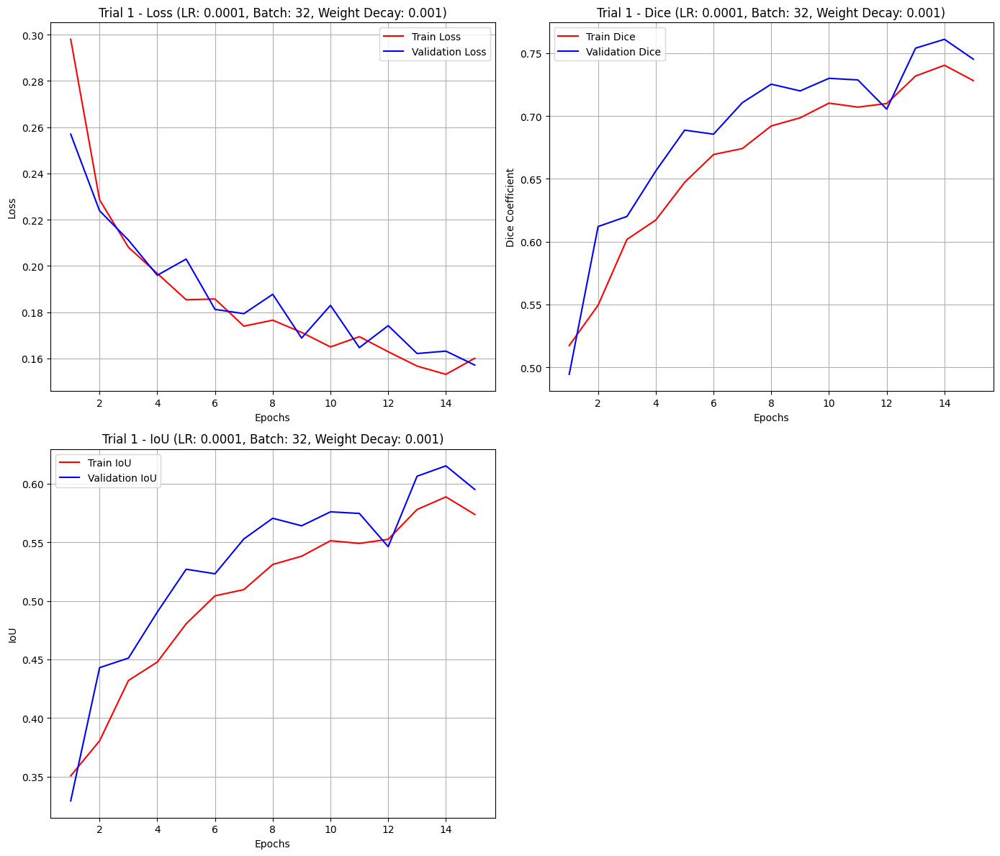

Trial 2/5 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/29 [00:03<01:41,  3.63s/batch]

Training Loss: 0.4191


Epoch 1 Training:   7%|▋         | 2/29 [00:07<01:44,  3.86s/batch]

Training Loss: 0.4128


Epoch 1 Training:  10%|█         | 3/29 [00:11<01:41,  3.90s/batch]

Training Loss: 0.2361


Epoch 1 Training:  14%|█▍        | 4/29 [00:15<01:38,  3.92s/batch]

Training Loss: 0.2854


Epoch 1 Training:  17%|█▋        | 5/29 [00:19<01:35,  3.96s/batch]

Training Loss: 0.2424


Epoch 1 Training:  21%|██        | 6/29 [00:23<01:30,  3.95s/batch]

Training Loss: 0.2639


Epoch 1 Training:  24%|██▍       | 7/29 [00:27<01:26,  3.92s/batch]

Training Loss: 0.2493


Epoch 1 Training:  28%|██▊       | 8/29 [00:31<01:23,  3.98s/batch]

Training Loss: 0.3081


Epoch 1 Training:  31%|███       | 9/29 [00:35<01:19,  3.98s/batch]

Training Loss: 0.3153


Epoch 1 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.98s/batch]

Training Loss: 0.2749


Epoch 1 Training:  38%|███▊      | 11/29 [00:43<01:12,  4.03s/batch]

Training Loss: 0.2542


Epoch 1 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.05s/batch]

Training Loss: 0.3071


Epoch 1 Training:  45%|████▍     | 13/29 [00:51<01:04,  4.02s/batch]

Training Loss: 0.3400


Epoch 1 Training:  48%|████▊     | 14/29 [00:55<01:00,  4.00s/batch]

Training Loss: 0.2444


Epoch 1 Training:  52%|█████▏    | 15/29 [00:59<00:55,  3.97s/batch]

Training Loss: 0.2375


Epoch 1 Training:  55%|█████▌    | 16/29 [01:03<00:52,  4.01s/batch]

Training Loss: 0.2642


Epoch 1 Training:  59%|█████▊    | 17/29 [01:07<00:48,  4.03s/batch]

Training Loss: 0.2066


Epoch 1 Training:  62%|██████▏   | 18/29 [01:11<00:44,  4.08s/batch]

Training Loss: 0.2353


Epoch 1 Training:  66%|██████▌   | 19/29 [01:15<00:40,  4.05s/batch]

Training Loss: 0.2086


Epoch 1 Training:  69%|██████▉   | 20/29 [01:19<00:36,  4.02s/batch]

Training Loss: 0.2256


Epoch 1 Training:  72%|███████▏  | 21/29 [01:23<00:32,  4.06s/batch]

Training Loss: 0.2308


Epoch 1 Training:  76%|███████▌  | 22/29 [01:27<00:28,  4.04s/batch]

Training Loss: 0.2260


Epoch 1 Training:  79%|███████▉  | 23/29 [01:31<00:24,  4.03s/batch]

Training Loss: 0.2085


Epoch 1 Training:  83%|████████▎ | 24/29 [01:35<00:20,  4.01s/batch]

Training Loss: 0.2479


Epoch 1 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.08s/batch]

Training Loss: 0.2908


Epoch 1 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.05s/batch]

Training Loss: 0.2279


Epoch 1 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.05s/batch]

Training Loss: 0.2163


Epoch 1 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.02s/batch]

Training Loss: 0.2610


Epoch 1 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.1793




Epoch 1 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Validation Loss: 0.3001


Epoch 1 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.72s/batch]

Validation Loss: 0.2328


Epoch 1 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.73s/batch]

Validation Loss: 0.2545


Epoch 1 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.69s/batch]

Validation Loss: 0.2339


Epoch 1 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.68s/batch]

Validation Loss: 0.2279


Epoch 1 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Validation Loss: 0.2202


Epoch 1 Validation:  88%|████████▊ | 7/8 [00:25<00:03,  3.68s/batch]

Validation Loss: 0.2027


Epoch 1 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.69s/batch]


Validation Loss: 0.1953
Epoch 1, Validation Loss: 0.2334, Validation Dice: 0.5867, Validation IoU: 0.4167




Epoch 2 Training:   3%|▎         | 1/29 [00:03<01:46,  3.80s/batch]

Training Loss: 0.2354


Epoch 2 Training:   7%|▋         | 2/29 [00:07<01:44,  3.89s/batch]

Training Loss: 0.2413


Epoch 2 Training:  10%|█         | 3/29 [00:11<01:43,  3.97s/batch]

Training Loss: 0.2325


Epoch 2 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.97s/batch]

Training Loss: 0.1924


Epoch 2 Training:  17%|█▋        | 5/29 [00:19<01:36,  4.02s/batch]

Training Loss: 0.2425


Epoch 2 Training:  21%|██        | 6/29 [00:23<01:32,  4.02s/batch]

Training Loss: 0.2522


Epoch 2 Training:  24%|██▍       | 7/29 [00:27<01:28,  4.02s/batch]

Training Loss: 0.2342


Epoch 2 Training:  28%|██▊       | 8/29 [00:31<01:24,  4.02s/batch]

Training Loss: 0.2205


Epoch 2 Training:  31%|███       | 9/29 [00:35<01:20,  4.02s/batch]

Training Loss: 0.2051


Epoch 2 Training:  34%|███▍      | 10/29 [00:39<01:16,  4.01s/batch]

Training Loss: 0.2491


Epoch 2 Training:  38%|███▊      | 11/29 [00:43<01:11,  3.98s/batch]

Training Loss: 0.2024


Epoch 2 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.01s/batch]

Training Loss: 0.3107


Epoch 2 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.03s/batch]

Training Loss: 0.2107


Epoch 2 Training:  48%|████▊     | 14/29 [00:55<00:59,  3.98s/batch]

Training Loss: 0.1938


Epoch 2 Training:  52%|█████▏    | 15/29 [00:59<00:55,  3.97s/batch]

Training Loss: 0.2092


Epoch 2 Training:  55%|█████▌    | 16/29 [01:03<00:51,  3.97s/batch]

Training Loss: 0.2452


Epoch 2 Training:  59%|█████▊    | 17/29 [01:07<00:47,  3.96s/batch]

Training Loss: 0.2558


Epoch 2 Training:  62%|██████▏   | 18/29 [01:11<00:43,  3.98s/batch]

Training Loss: 0.2868


Epoch 2 Training:  66%|██████▌   | 19/29 [01:15<00:39,  3.99s/batch]

Training Loss: 0.2094


Epoch 2 Training:  69%|██████▉   | 20/29 [01:19<00:35,  3.98s/batch]

Training Loss: 0.2126


Epoch 2 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.99s/batch]

Training Loss: 0.2396


Epoch 2 Training:  76%|███████▌  | 22/29 [01:27<00:28,  4.01s/batch]

Training Loss: 0.2345


Epoch 2 Training:  79%|███████▉  | 23/29 [01:31<00:24,  4.02s/batch]

Training Loss: 0.2471


Epoch 2 Training:  83%|████████▎ | 24/29 [01:35<00:20,  4.02s/batch]

Training Loss: 0.2477


Epoch 2 Training:  86%|████████▌ | 25/29 [01:39<00:15,  3.99s/batch]

Training Loss: 0.2083


Epoch 2 Training:  90%|████████▉ | 26/29 [01:43<00:11,  3.99s/batch]

Training Loss: 0.2264


Epoch 2 Training:  93%|█████████▎| 27/29 [01:47<00:08,  4.02s/batch]

Training Loss: 0.1925


Epoch 2 Training:  97%|█████████▋| 28/29 [01:51<00:04,  4.03s/batch]

Training Loss: 0.2099


Epoch 2 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.2195




Epoch 2 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.65s/batch]

Validation Loss: 0.2972


Epoch 2 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.72s/batch]

Validation Loss: 0.2412


Epoch 2 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.75s/batch]

Validation Loss: 0.2618


Epoch 2 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.70s/batch]

Validation Loss: 0.2330


Epoch 2 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.69s/batch]

Validation Loss: 0.2176


Epoch 2 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.72s/batch]

Validation Loss: 0.2098


Epoch 2 Validation:  88%|████████▊ | 7/8 [00:25<00:03,  3.71s/batch]

Validation Loss: 0.2050


Epoch 2 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.70s/batch]


Validation Loss: 0.1960
Epoch 2, Validation Loss: 0.2327, Validation Dice: 0.5579, Validation IoU: 0.3884




Epoch 3 Training:   3%|▎         | 1/29 [00:03<01:42,  3.65s/batch]

Training Loss: 0.2075


Epoch 3 Training:   7%|▋         | 2/29 [00:07<01:42,  3.81s/batch]

Training Loss: 0.2259


Epoch 3 Training:  10%|█         | 3/29 [00:11<01:41,  3.90s/batch]

Training Loss: 0.1870


Epoch 3 Training:  14%|█▍        | 4/29 [00:15<01:37,  3.89s/batch]

Training Loss: 0.2047


Epoch 3 Training:  17%|█▋        | 5/29 [00:19<01:34,  3.96s/batch]

Training Loss: 0.2382


Epoch 3 Training:  21%|██        | 6/29 [00:23<01:31,  3.97s/batch]

Training Loss: 0.1885


Epoch 3 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.97s/batch]

Training Loss: 0.1943


Epoch 3 Training:  28%|██▊       | 8/29 [00:31<01:25,  4.05s/batch]

Training Loss: 0.2988


Epoch 3 Training:  31%|███       | 9/29 [00:35<01:21,  4.05s/batch]

Training Loss: 0.1923


Epoch 3 Training:  34%|███▍      | 10/29 [00:39<01:17,  4.07s/batch]

Training Loss: 0.2412


Epoch 3 Training:  38%|███▊      | 11/29 [00:43<01:12,  4.05s/batch]

Training Loss: 0.1737


Epoch 3 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.04s/batch]

Training Loss: 0.1875


Epoch 3 Training:  45%|████▍     | 13/29 [00:51<01:04,  4.06s/batch]

Training Loss: 0.2290


Epoch 3 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.08s/batch]

Training Loss: 0.2000


Epoch 3 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.2238


Epoch 3 Training:  55%|█████▌    | 16/29 [01:03<00:51,  4.00s/batch]

Training Loss: 0.2309


Epoch 3 Training:  59%|█████▊    | 17/29 [01:07<00:48,  4.01s/batch]

Training Loss: 0.1954


Epoch 3 Training:  62%|██████▏   | 18/29 [01:11<00:43,  3.99s/batch]

Training Loss: 0.2116


Epoch 3 Training:  66%|██████▌   | 19/29 [01:15<00:39,  3.98s/batch]

Training Loss: 0.2178


Epoch 3 Training:  69%|██████▉   | 20/29 [01:19<00:35,  3.92s/batch]

Training Loss: 0.1508


Epoch 3 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.95s/batch]

Training Loss: 0.2264


Epoch 3 Training:  76%|███████▌  | 22/29 [01:27<00:27,  4.00s/batch]

Training Loss: 0.2280


Epoch 3 Training:  79%|███████▉  | 23/29 [01:31<00:24,  4.01s/batch]

Training Loss: 0.1908


Epoch 3 Training:  83%|████████▎ | 24/29 [01:35<00:19,  3.99s/batch]

Training Loss: 0.2043


Epoch 3 Training:  86%|████████▌ | 25/29 [01:39<00:15,  3.96s/batch]

Training Loss: 0.2004


Epoch 3 Training:  90%|████████▉ | 26/29 [01:43<00:11,  3.96s/batch]

Training Loss: 0.1657


Epoch 3 Training:  93%|█████████▎| 27/29 [01:47<00:07,  3.99s/batch]

Training Loss: 0.2544


Epoch 3 Training:  97%|█████████▋| 28/29 [01:51<00:04,  4.02s/batch]

Training Loss: 0.1993


Epoch 3 Training: 100%|██████████| 29/29 [01:52<00:00,  3.87s/batch]


Training Loss: 0.2078




Epoch 3 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.72s/batch]

Validation Loss: 0.2556


Epoch 3 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Validation Loss: 0.2195


Epoch 3 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Validation Loss: 0.2189


Epoch 3 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.75s/batch]

Validation Loss: 0.1923


Epoch 3 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1858


Epoch 3 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.74s/batch]

Validation Loss: 0.1940


Epoch 3 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1685


Epoch 3 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1752
Epoch 3, Validation Loss: 0.2012, Validation Dice: 0.6535, Validation IoU: 0.4869




Epoch 4 Training:   3%|▎         | 1/29 [00:03<01:44,  3.72s/batch]

Training Loss: 0.2146


Epoch 4 Training:   7%|▋         | 2/29 [00:07<01:45,  3.89s/batch]

Training Loss: 0.1484


Epoch 4 Training:  10%|█         | 3/29 [00:11<01:43,  4.00s/batch]

Training Loss: 0.2062


Epoch 4 Training:  14%|█▍        | 4/29 [00:15<01:41,  4.04s/batch]

Training Loss: 0.2051


Epoch 4 Training:  17%|█▋        | 5/29 [00:19<01:36,  4.01s/batch]

Training Loss: 0.2107


Epoch 4 Training:  21%|██        | 6/29 [00:23<01:32,  4.00s/batch]

Training Loss: 0.1871


Epoch 4 Training:  24%|██▍       | 7/29 [00:27<01:28,  4.03s/batch]

Training Loss: 0.2059


Epoch 4 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.03s/batch]

Training Loss: 0.1491


Epoch 4 Training:  31%|███       | 9/29 [00:35<01:20,  4.00s/batch]

Training Loss: 0.2143


Epoch 4 Training:  34%|███▍      | 10/29 [00:39<01:16,  4.00s/batch]

Training Loss: 0.2528


Epoch 4 Training:  38%|███▊      | 11/29 [00:43<01:11,  3.98s/batch]

Training Loss: 0.2036


Epoch 4 Training:  41%|████▏     | 12/29 [00:47<01:07,  3.97s/batch]

Training Loss: 0.1987


Epoch 4 Training:  45%|████▍     | 13/29 [00:51<01:03,  3.97s/batch]

Training Loss: 0.1991


Epoch 4 Training:  48%|████▊     | 14/29 [00:55<00:59,  3.97s/batch]

Training Loss: 0.2064


Epoch 4 Training:  52%|█████▏    | 15/29 [00:59<00:56,  4.02s/batch]

Training Loss: 0.1882


Epoch 4 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.04s/batch]

Training Loss: 0.1944


Epoch 4 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.2145


Epoch 4 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.04s/batch]

Training Loss: 0.2047


Epoch 4 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.04s/batch]

Training Loss: 0.2285


Epoch 4 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.02s/batch]

Training Loss: 0.1578


Epoch 4 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.98s/batch]

Training Loss: 0.2054


Epoch 4 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.00s/batch]

Training Loss: 0.2086


Epoch 4 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.1379


Epoch 4 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.03s/batch]

Training Loss: 0.2081


Epoch 4 Training:  86%|████████▌ | 25/29 [01:40<00:15,  4.00s/batch]

Training Loss: 0.2176


Epoch 4 Training:  90%|████████▉ | 26/29 [01:44<00:11,  3.99s/batch]

Training Loss: 0.1783


Epoch 4 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.01s/batch]

Training Loss: 0.1991


Epoch 4 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.01s/batch]

Training Loss: 0.2102


Epoch 4 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.1335




Epoch 4 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.72s/batch]

Validation Loss: 0.2472


Epoch 4 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Validation Loss: 0.2080


Epoch 4 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.80s/batch]

Validation Loss: 0.2070


Epoch 4 Validation:  50%|█████     | 4/8 [00:15<00:14,  3.75s/batch]

Validation Loss: 0.1881


Epoch 4 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1724


Epoch 4 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.1872


Epoch 4 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1607


Epoch 4 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1614
Epoch 4, Validation Loss: 0.1915, Validation Dice: 0.6881, Validation IoU: 0.5258




Epoch 5 Training:   3%|▎         | 1/29 [00:03<01:48,  3.88s/batch]

Training Loss: 0.1506


Epoch 5 Training:   7%|▋         | 2/29 [00:07<01:47,  3.97s/batch]

Training Loss: 0.1934


Epoch 5 Training:  10%|█         | 3/29 [00:12<01:44,  4.02s/batch]

Training Loss: 0.2005


Epoch 5 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.03s/batch]

Training Loss: 0.1619


Epoch 5 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.1554


Epoch 5 Training:  21%|██        | 6/29 [00:24<01:32,  4.03s/batch]

Training Loss: 0.2032


Epoch 5 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.98s/batch]

Training Loss: 0.1904


Epoch 5 Training:  28%|██▊       | 8/29 [00:31<01:23,  3.98s/batch]

Training Loss: 0.2092


Epoch 5 Training:  31%|███       | 9/29 [00:35<01:19,  3.96s/batch]

Training Loss: 0.2189


Epoch 5 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.97s/batch]

Training Loss: 0.1942


Epoch 5 Training:  38%|███▊      | 11/29 [00:43<01:11,  3.95s/batch]

Training Loss: 0.1783


Epoch 5 Training:  41%|████▏     | 12/29 [00:47<01:07,  4.00s/batch]

Training Loss: 0.1800


Epoch 5 Training:  45%|████▍     | 13/29 [00:51<01:04,  4.03s/batch]

Training Loss: 0.2100


Epoch 5 Training:  48%|████▊     | 14/29 [00:55<01:00,  4.02s/batch]

Training Loss: 0.2150


Epoch 5 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.2348


Epoch 5 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.06s/batch]

Training Loss: 0.1957


Epoch 5 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.05s/batch]

Training Loss: 0.2418


Epoch 5 Training:  62%|██████▏   | 18/29 [01:12<00:45,  4.09s/batch]

Training Loss: 0.1967


Epoch 5 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.06s/batch]

Training Loss: 0.1983


Epoch 5 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.02s/batch]

Training Loss: 0.1941


Epoch 5 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.05s/batch]

Training Loss: 0.1991


Epoch 5 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.05s/batch]

Training Loss: 0.1944


Epoch 5 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.04s/batch]

Training Loss: 0.2030


Epoch 5 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.02s/batch]

Training Loss: 0.2155


Epoch 5 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.03s/batch]

Training Loss: 0.2051


Epoch 5 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.00s/batch]

Training Loss: 0.1852


Epoch 5 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.05s/batch]

Training Loss: 0.1818


Epoch 5 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.04s/batch]

Training Loss: 0.1917


Epoch 5 Training: 100%|██████████| 29/29 [01:53<00:00,  3.90s/batch]


Training Loss: 0.2892




Epoch 5 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.69s/batch]

Validation Loss: 0.2649


Epoch 5 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Validation Loss: 0.2103


Epoch 5 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.2130


Epoch 5 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Validation Loss: 0.1955


Epoch 5 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1894


Epoch 5 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1844


Epoch 5 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1719


Epoch 5 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.75s/batch]


Validation Loss: 0.1798
Epoch 5, Validation Loss: 0.2012, Validation Dice: 0.6129, Validation IoU: 0.4441




Epoch 6 Training:   3%|▎         | 1/29 [00:03<01:47,  3.85s/batch]

Training Loss: 0.1771


Epoch 6 Training:   7%|▋         | 2/29 [00:07<01:47,  3.99s/batch]

Training Loss: 0.1837


Epoch 6 Training:  10%|█         | 3/29 [00:11<01:44,  4.00s/batch]

Training Loss: 0.1393


Epoch 6 Training:  14%|█▍        | 4/29 [00:15<01:39,  4.00s/batch]

Training Loss: 0.1715


Epoch 6 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.06s/batch]

Training Loss: 0.2128


Epoch 6 Training:  21%|██        | 6/29 [00:24<01:33,  4.04s/batch]

Training Loss: 0.1333


Epoch 6 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.1683


Epoch 6 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.04s/batch]

Training Loss: 0.2092


Epoch 6 Training:  31%|███       | 9/29 [00:36<01:20,  4.01s/batch]

Training Loss: 0.1784


Epoch 6 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.2251


Epoch 6 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.02s/batch]

Training Loss: 0.2103


Epoch 6 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.01s/batch]

Training Loss: 0.2414


Epoch 6 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.05s/batch]

Training Loss: 0.1901


Epoch 6 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.07s/batch]

Training Loss: 0.1878


Epoch 6 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.06s/batch]

Training Loss: 0.1620


Epoch 6 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.1643


Epoch 6 Training:  59%|█████▊    | 17/29 [01:08<00:47,  4.00s/batch]

Training Loss: 0.1500


Epoch 6 Training:  62%|██████▏   | 18/29 [01:12<00:43,  3.99s/batch]

Training Loss: 0.2436


Epoch 6 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.2147


Epoch 6 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.03s/batch]

Training Loss: 0.1934


Epoch 6 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.00s/batch]

Training Loss: 0.1875


Epoch 6 Training:  76%|███████▌  | 22/29 [01:28<00:27,  4.00s/batch]

Training Loss: 0.2156


Epoch 6 Training:  79%|███████▉  | 23/29 [01:32<00:23,  4.00s/batch]

Training Loss: 0.2014


Epoch 6 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.04s/batch]

Training Loss: 0.2209


Epoch 6 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.03s/batch]

Training Loss: 0.2446


Epoch 6 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.03s/batch]

Training Loss: 0.2037


Epoch 6 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.01s/batch]

Training Loss: 0.1681


Epoch 6 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.02s/batch]

Training Loss: 0.1843


Epoch 6 Training: 100%|██████████| 29/29 [01:53<00:00,  3.90s/batch]


Training Loss: 0.2672




Epoch 6 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.67s/batch]

Validation Loss: 0.2729


Epoch 6 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Validation Loss: 0.2159


Epoch 6 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2305


Epoch 6 Validation:  50%|█████     | 4/8 [00:15<00:14,  3.75s/batch]

Validation Loss: 0.2135


Epoch 6 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1945


Epoch 6 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.74s/batch]

Validation Loss: 0.1939


Epoch 6 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1991


Epoch 6 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1889
Epoch 6, Validation Loss: 0.2137, Validation Dice: 0.5427, Validation IoU: 0.3740




Epoch 7 Training:   3%|▎         | 1/29 [00:03<01:47,  3.84s/batch]

Training Loss: 0.1733


Epoch 7 Training:   7%|▋         | 2/29 [00:07<01:45,  3.92s/batch]

Training Loss: 0.1841


Epoch 7 Training:  10%|█         | 3/29 [00:12<01:45,  4.05s/batch]

Training Loss: 0.2294


Epoch 7 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.03s/batch]

Training Loss: 0.2348


Epoch 7 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.02s/batch]

Training Loss: 0.2176


Epoch 7 Training:  21%|██        | 6/29 [00:24<01:32,  4.03s/batch]

Training Loss: 0.1564


Epoch 7 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.2410


Epoch 7 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.02s/batch]

Training Loss: 0.2118


Epoch 7 Training:  31%|███       | 9/29 [00:36<01:21,  4.07s/batch]

Training Loss: 0.2343


Epoch 7 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.04s/batch]

Training Loss: 0.1799


Epoch 7 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.08s/batch]

Training Loss: 0.2007


Epoch 7 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.09s/batch]

Training Loss: 0.2015


Epoch 7 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.07s/batch]

Training Loss: 0.1978


Epoch 7 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.06s/batch]

Training Loss: 0.1789


Epoch 7 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.06s/batch]

Training Loss: 0.1826


Epoch 7 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.04s/batch]

Training Loss: 0.2443


Epoch 7 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.2143


Epoch 7 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.02s/batch]

Training Loss: 0.2076


Epoch 7 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.03s/batch]

Training Loss: 0.2162


Epoch 7 Training:  69%|██████▉   | 20/29 [01:20<00:35,  4.00s/batch]

Training Loss: 0.2274


Epoch 7 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.02s/batch]

Training Loss: 0.2234


Epoch 7 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.01s/batch]

Training Loss: 0.2213


Epoch 7 Training:  79%|███████▉  | 23/29 [01:32<00:23,  3.99s/batch]

Training Loss: 0.1842


Epoch 7 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.04s/batch]

Training Loss: 0.2154


Epoch 7 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.04s/batch]

Training Loss: 0.2287


Epoch 7 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.02s/batch]

Training Loss: 0.1519


Epoch 7 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.05s/batch]

Training Loss: 0.1749


Epoch 7 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.06s/batch]

Training Loss: 0.1728


Epoch 7 Training: 100%|██████████| 29/29 [01:53<00:00,  3.91s/batch]


Training Loss: 0.1507




Epoch 7 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.70s/batch]

Validation Loss: 0.2431


Epoch 7 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Validation Loss: 0.2083


Epoch 7 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Validation Loss: 0.2011


Epoch 7 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.73s/batch]

Validation Loss: 0.1837


Epoch 7 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1731


Epoch 7 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.75s/batch]

Validation Loss: 0.1797


Epoch 7 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.72s/batch]

Validation Loss: 0.1551


Epoch 7 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Validation Loss: 0.1608
Epoch 7, Validation Loss: 0.1881, Validation Dice: 0.6979, Validation IoU: 0.5373




Epoch 8 Training:   3%|▎         | 1/29 [00:03<01:50,  3.93s/batch]

Training Loss: 0.1811


Epoch 8 Training:   7%|▋         | 2/29 [00:07<01:47,  3.99s/batch]

Training Loss: 0.1905


Epoch 8 Training:  10%|█         | 3/29 [00:12<01:45,  4.07s/batch]

Training Loss: 0.1906


Epoch 8 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.07s/batch]

Training Loss: 0.1876


Epoch 8 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.2146


Epoch 8 Training:  21%|██        | 6/29 [00:24<01:32,  4.01s/batch]

Training Loss: 0.1785


Epoch 8 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.04s/batch]

Training Loss: 0.1945


Epoch 8 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.05s/batch]

Training Loss: 0.1868


Epoch 8 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.2018


Epoch 8 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.2293


Epoch 8 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1997


Epoch 8 Training:  41%|████▏     | 12/29 [00:48<01:07,  3.98s/batch]

Training Loss: 0.1790


Epoch 8 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.02s/batch]

Training Loss: 0.1808


Epoch 8 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.03s/batch]

Training Loss: 0.1930


Epoch 8 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.1996


Epoch 8 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.2079


Epoch 8 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.2029


Epoch 8 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.03s/batch]

Training Loss: 0.1789


Epoch 8 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.04s/batch]

Training Loss: 0.1487


Epoch 8 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.04s/batch]

Training Loss: 0.2079


Epoch 8 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.03s/batch]

Training Loss: 0.2174


Epoch 8 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.2118


Epoch 8 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.2030


Epoch 8 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.02s/batch]

Training Loss: 0.2285


Epoch 8 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.02s/batch]

Training Loss: 0.2263


Epoch 8 Training:  90%|████████▉ | 26/29 [01:44<00:11,  4.00s/batch]

Training Loss: 0.1904


Epoch 8 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.01s/batch]

Training Loss: 0.1923


Epoch 8 Training:  97%|█████████▋| 28/29 [01:52<00:03,  3.95s/batch]

Training Loss: 0.1536


Epoch 8 Training: 100%|██████████| 29/29 [01:53<00:00,  3.90s/batch]


Training Loss: 0.1163




Epoch 8 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.63s/batch]

Validation Loss: 0.2194


Epoch 8 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.73s/batch]

Validation Loss: 0.1998


Epoch 8 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1977


Epoch 8 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.75s/batch]

Validation Loss: 0.1785


Epoch 8 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1664


Epoch 8 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.1931


Epoch 8 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.1648


Epoch 8 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1597
Epoch 8, Validation Loss: 0.1849, Validation Dice: 0.7232, Validation IoU: 0.5676




Epoch 9 Training:   3%|▎         | 1/29 [00:03<01:43,  3.69s/batch]

Training Loss: 0.1740


Epoch 9 Training:   7%|▋         | 2/29 [00:07<01:44,  3.88s/batch]

Training Loss: 0.1419


Epoch 9 Training:  10%|█         | 3/29 [00:11<01:42,  3.95s/batch]

Training Loss: 0.1388


Epoch 9 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.98s/batch]

Training Loss: 0.2142


Epoch 9 Training:  17%|█▋        | 5/29 [00:19<01:36,  4.01s/batch]

Training Loss: 0.1614


Epoch 9 Training:  21%|██        | 6/29 [00:23<01:32,  4.01s/batch]

Training Loss: 0.1911


Epoch 9 Training:  24%|██▍       | 7/29 [00:27<01:28,  4.04s/batch]

Training Loss: 0.1469


Epoch 9 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2618


Epoch 9 Training:  31%|███       | 9/29 [00:36<01:21,  4.07s/batch]

Training Loss: 0.2305


Epoch 9 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.04s/batch]

Training Loss: 0.2111


Epoch 9 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.2037


Epoch 9 Training:  41%|████▏     | 12/29 [00:48<01:07,  4.00s/batch]

Training Loss: 0.2007


Epoch 9 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.01s/batch]

Training Loss: 0.1554


Epoch 9 Training:  48%|████▊     | 14/29 [00:56<00:59,  4.00s/batch]

Training Loss: 0.1953


Epoch 9 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.01s/batch]

Training Loss: 0.2178


Epoch 9 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.00s/batch]

Training Loss: 0.1844


Epoch 9 Training:  59%|█████▊    | 17/29 [01:08<00:47,  3.98s/batch]

Training Loss: 0.1829


Epoch 9 Training:  62%|██████▏   | 18/29 [01:11<00:43,  3.96s/batch]

Training Loss: 0.1857


Epoch 9 Training:  66%|██████▌   | 19/29 [01:15<00:39,  3.96s/batch]

Training Loss: 0.1790


Epoch 9 Training:  69%|██████▉   | 20/29 [01:19<00:35,  3.96s/batch]

Training Loss: 0.1953


Epoch 9 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.99s/batch]

Training Loss: 0.2411


Epoch 9 Training:  76%|███████▌  | 22/29 [01:27<00:27,  4.00s/batch]

Training Loss: 0.1971


Epoch 9 Training:  79%|███████▉  | 23/29 [01:31<00:24,  4.00s/batch]

Training Loss: 0.1504


Epoch 9 Training:  83%|████████▎ | 24/29 [01:35<00:19,  3.98s/batch]

Training Loss: 0.1203


Epoch 9 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.04s/batch]

Training Loss: 0.1582


Epoch 9 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.03s/batch]

Training Loss: 0.1835


Epoch 9 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.02s/batch]

Training Loss: 0.2120


Epoch 9 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.03s/batch]

Training Loss: 0.2104


Epoch 9 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.1261




Epoch 9 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Validation Loss: 0.2639


Epoch 9 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Validation Loss: 0.2052


Epoch 9 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2092


Epoch 9 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.76s/batch]

Validation Loss: 0.1934


Epoch 9 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1782


Epoch 9 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.1759


Epoch 9 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1775


Epoch 9 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1755
Epoch 9, Validation Loss: 0.1974, Validation Dice: 0.6058, Validation IoU: 0.4360




Epoch 10 Training:   3%|▎         | 1/29 [00:03<01:49,  3.92s/batch]

Training Loss: 0.2082


Epoch 10 Training:   7%|▋         | 2/29 [00:07<01:46,  3.95s/batch]

Training Loss: 0.2217


Epoch 10 Training:  10%|█         | 3/29 [00:11<01:43,  3.98s/batch]

Training Loss: 0.2019


Epoch 10 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.98s/batch]

Training Loss: 0.1694


Epoch 10 Training:  17%|█▋        | 5/29 [00:19<01:35,  3.99s/batch]

Training Loss: 0.2192


Epoch 10 Training:  21%|██        | 6/29 [00:23<01:32,  4.01s/batch]

Training Loss: 0.1836


Epoch 10 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.97s/batch]

Training Loss: 0.2024


Epoch 10 Training:  28%|██▊       | 8/29 [00:31<01:23,  4.00s/batch]

Training Loss: 0.1729


Epoch 10 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.1766


Epoch 10 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.05s/batch]

Training Loss: 0.2107


Epoch 10 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.05s/batch]

Training Loss: 0.2012


Epoch 10 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.05s/batch]

Training Loss: 0.1522


Epoch 10 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.01s/batch]

Training Loss: 0.1965


Epoch 10 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.01s/batch]

Training Loss: 0.1796


Epoch 10 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.2051


Epoch 10 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.1534


Epoch 10 Training:  59%|█████▊    | 17/29 [01:08<00:47,  3.99s/batch]

Training Loss: 0.1419


Epoch 10 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.01s/batch]

Training Loss: 0.1614


Epoch 10 Training:  66%|██████▌   | 19/29 [01:16<00:39,  3.99s/batch]

Training Loss: 0.1637


Epoch 10 Training:  69%|██████▉   | 20/29 [01:20<00:35,  3.98s/batch]

Training Loss: 0.1491


Epoch 10 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.93s/batch]

Training Loss: 0.1709


Epoch 10 Training:  76%|███████▌  | 22/29 [01:27<00:27,  3.95s/batch]

Training Loss: 0.2665


Epoch 10 Training:  79%|███████▉  | 23/29 [01:31<00:23,  3.98s/batch]

Training Loss: 0.2923


Epoch 10 Training:  83%|████████▎ | 24/29 [01:35<00:19,  3.98s/batch]

Training Loss: 0.2131


Epoch 10 Training:  86%|████████▌ | 25/29 [01:39<00:15,  4.00s/batch]

Training Loss: 0.1874


Epoch 10 Training:  90%|████████▉ | 26/29 [01:43<00:11,  3.99s/batch]

Training Loss: 0.1446


Epoch 10 Training:  93%|█████████▎| 27/29 [01:47<00:08,  4.00s/batch]

Training Loss: 0.1680


Epoch 10 Training:  97%|█████████▋| 28/29 [01:51<00:03,  3.97s/batch]

Training Loss: 0.1598


Epoch 10 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.2893




Epoch 10 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.63s/batch]

Validation Loss: 0.2329


Epoch 10 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Validation Loss: 0.2218


Epoch 10 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.76s/batch]

Validation Loss: 0.2178


Epoch 10 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.72s/batch]

Validation Loss: 0.2013


Epoch 10 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.70s/batch]

Validation Loss: 0.1739


Epoch 10 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.70s/batch]

Validation Loss: 0.2303


Epoch 10 Validation:  88%|████████▊ | 7/8 [00:25<00:03,  3.69s/batch]

Validation Loss: 0.1871


Epoch 10 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.71s/batch]


Validation Loss: 0.1783
Epoch 10, Validation Loss: 0.2054, Validation Dice: 0.7136, Validation IoU: 0.5558




Epoch 11 Training:   3%|▎         | 1/29 [00:04<01:52,  4.00s/batch]

Training Loss: 0.2070


Epoch 11 Training:   7%|▋         | 2/29 [00:07<01:47,  3.96s/batch]

Training Loss: 0.1610


Epoch 11 Training:  10%|█         | 3/29 [00:12<01:45,  4.06s/batch]

Training Loss: 0.1762


Epoch 11 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.02s/batch]

Training Loss: 0.1518


Epoch 11 Training:  17%|█▋        | 5/29 [00:19<01:35,  3.96s/batch]

Training Loss: 0.1805


Epoch 11 Training:  21%|██        | 6/29 [00:24<01:32,  4.00s/batch]

Training Loss: 0.1774


Epoch 11 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.2216


Epoch 11 Training:  28%|██▊       | 8/29 [00:32<01:23,  3.99s/batch]

Training Loss: 0.1480


Epoch 11 Training:  31%|███       | 9/29 [00:35<01:19,  3.97s/batch]

Training Loss: 0.1756


Epoch 11 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.97s/batch]

Training Loss: 0.1897


Epoch 11 Training:  38%|███▊      | 11/29 [00:43<01:11,  3.99s/batch]

Training Loss: 0.2183


Epoch 11 Training:  41%|████▏     | 12/29 [00:47<01:07,  4.00s/batch]

Training Loss: 0.2492


Epoch 11 Training:  45%|████▍     | 13/29 [00:51<01:03,  4.00s/batch]

Training Loss: 0.2271


Epoch 11 Training:  48%|████▊     | 14/29 [00:55<00:59,  4.00s/batch]

Training Loss: 0.1604


Epoch 11 Training:  52%|█████▏    | 15/29 [00:59<00:55,  4.00s/batch]

Training Loss: 0.1457


Epoch 11 Training:  55%|█████▌    | 16/29 [01:03<00:51,  3.98s/batch]

Training Loss: 0.2039


Epoch 11 Training:  59%|█████▊    | 17/29 [01:07<00:47,  3.97s/batch]

Training Loss: 0.1517


Epoch 11 Training:  62%|██████▏   | 18/29 [01:11<00:43,  3.99s/batch]

Training Loss: 0.1923


Epoch 11 Training:  66%|██████▌   | 19/29 [01:15<00:40,  4.01s/batch]

Training Loss: 0.1758


Epoch 11 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.03s/batch]

Training Loss: 0.1980


Epoch 11 Training:  72%|███████▏  | 21/29 [01:23<00:32,  4.00s/batch]

Training Loss: 0.1850


Epoch 11 Training:  76%|███████▌  | 22/29 [01:27<00:28,  4.02s/batch]

Training Loss: 0.1812


Epoch 11 Training:  79%|███████▉  | 23/29 [01:31<00:23,  3.98s/batch]

Training Loss: 0.1644


Epoch 11 Training:  83%|████████▎ | 24/29 [01:35<00:19,  3.99s/batch]

Training Loss: 0.2000


Epoch 11 Training:  86%|████████▌ | 25/29 [01:39<00:15,  4.00s/batch]

Training Loss: 0.2423


Epoch 11 Training:  90%|████████▉ | 26/29 [01:43<00:12,  4.02s/batch]

Training Loss: 0.2158


Epoch 11 Training:  93%|█████████▎| 27/29 [01:47<00:07,  3.98s/batch]

Training Loss: 0.1982


Epoch 11 Training:  97%|█████████▋| 28/29 [01:51<00:03,  3.99s/batch]

Training Loss: 0.2640


Epoch 11 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.3880




Epoch 11 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.68s/batch]

Validation Loss: 0.2219


Epoch 11 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.74s/batch]

Validation Loss: 0.1973


Epoch 11 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.1985


Epoch 11 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Validation Loss: 0.1802


Epoch 11 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.71s/batch]

Validation Loss: 0.1654


Epoch 11 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.1908


Epoch 11 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1642


Epoch 11 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Validation Loss: 0.1587
Epoch 11, Validation Loss: 0.1846, Validation Dice: 0.7283, Validation IoU: 0.5739




Epoch 12 Training:   3%|▎         | 1/29 [00:03<01:44,  3.72s/batch]

Training Loss: 0.1713


Epoch 12 Training:   7%|▋         | 2/29 [00:07<01:43,  3.83s/batch]

Training Loss: 0.1792


Epoch 12 Training:  10%|█         | 3/29 [00:11<01:40,  3.85s/batch]

Training Loss: 0.2049


Epoch 12 Training:  14%|█▍        | 4/29 [00:15<01:37,  3.91s/batch]

Training Loss: 0.1946


Epoch 12 Training:  17%|█▋        | 5/29 [00:19<01:35,  4.00s/batch]

Training Loss: 0.1905


Epoch 12 Training:  21%|██        | 6/29 [00:23<01:31,  3.99s/batch]

Training Loss: 0.1769


Epoch 12 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.98s/batch]

Training Loss: 0.1793


Epoch 12 Training:  28%|██▊       | 8/29 [00:31<01:24,  4.00s/batch]

Training Loss: 0.1722


Epoch 12 Training:  31%|███       | 9/29 [00:35<01:19,  3.98s/batch]

Training Loss: 0.1615


Epoch 12 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.98s/batch]

Training Loss: 0.1991


Epoch 12 Training:  38%|███▊      | 11/29 [00:43<01:12,  4.00s/batch]

Training Loss: 0.2207


Epoch 12 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.03s/batch]

Training Loss: 0.1798


Epoch 12 Training:  45%|████▍     | 13/29 [00:51<01:05,  4.07s/batch]

Training Loss: 0.2193


Epoch 12 Training:  48%|████▊     | 14/29 [00:55<01:00,  4.03s/batch]

Training Loss: 0.1760


Epoch 12 Training:  52%|█████▏    | 15/29 [00:59<00:56,  4.05s/batch]

Training Loss: 0.1540


Epoch 12 Training:  55%|█████▌    | 16/29 [01:03<00:52,  4.02s/batch]

Training Loss: 0.1846


Epoch 12 Training:  59%|█████▊    | 17/29 [01:07<00:48,  4.04s/batch]

Training Loss: 0.1972


Epoch 12 Training:  62%|██████▏   | 18/29 [01:11<00:44,  4.03s/batch]

Training Loss: 0.1766


Epoch 12 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.05s/batch]

Training Loss: 0.1703


Epoch 12 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.04s/batch]

Training Loss: 0.1745


Epoch 12 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.02s/batch]

Training Loss: 0.1438


Epoch 12 Training:  76%|███████▌  | 22/29 [01:27<00:27,  3.98s/batch]

Training Loss: 0.1788


Epoch 12 Training:  79%|███████▉  | 23/29 [01:31<00:23,  3.95s/batch]

Training Loss: 0.1677


Epoch 12 Training:  83%|████████▎ | 24/29 [01:35<00:19,  3.97s/batch]

Training Loss: 0.1611


Epoch 12 Training:  86%|████████▌ | 25/29 [01:39<00:16,  4.01s/batch]

Training Loss: 0.2409


Epoch 12 Training:  90%|████████▉ | 26/29 [01:43<00:12,  4.01s/batch]

Training Loss: 0.1858


Epoch 12 Training:  93%|█████████▎| 27/29 [01:47<00:08,  4.01s/batch]

Training Loss: 0.1744


Epoch 12 Training:  97%|█████████▋| 28/29 [01:51<00:04,  4.02s/batch]

Training Loss: 0.1545


Epoch 12 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.0785




Epoch 12 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.60s/batch]

Validation Loss: 0.2791


Epoch 12 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.75s/batch]

Validation Loss: 0.2110


Epoch 12 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.2045


Epoch 12 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Validation Loss: 0.1975


Epoch 12 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.70s/batch]

Validation Loss: 0.1781


Epoch 12 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.71s/batch]

Validation Loss: 0.1717


Epoch 12 Validation:  88%|████████▊ | 7/8 [00:25<00:03,  3.70s/batch]

Validation Loss: 0.1684


Epoch 12 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.70s/batch]


Validation Loss: 0.1776
Epoch 12, Validation Loss: 0.1985, Validation Dice: 0.6553, Validation IoU: 0.4886




Epoch 13 Training:   3%|▎         | 1/29 [00:03<01:40,  3.61s/batch]

Training Loss: 0.1444


Epoch 13 Training:   7%|▋         | 2/29 [00:07<01:43,  3.85s/batch]

Training Loss: 0.1395


Epoch 13 Training:  10%|█         | 3/29 [00:11<01:41,  3.91s/batch]

Training Loss: 0.1407


Epoch 13 Training:  14%|█▍        | 4/29 [00:15<01:40,  4.00s/batch]

Training Loss: 0.1863


Epoch 13 Training:  17%|█▋        | 5/29 [00:19<01:35,  3.99s/batch]

Training Loss: 0.1541


Epoch 13 Training:  21%|██        | 6/29 [00:23<01:32,  4.00s/batch]

Training Loss: 0.1759


Epoch 13 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.99s/batch]

Training Loss: 0.1632


Epoch 13 Training:  28%|██▊       | 8/29 [00:31<01:23,  3.96s/batch]

Training Loss: 0.1579


Epoch 13 Training:  31%|███       | 9/29 [00:35<01:19,  4.00s/batch]

Training Loss: 0.1697


Epoch 13 Training:  34%|███▍      | 10/29 [00:39<01:17,  4.06s/batch]

Training Loss: 0.1536


Epoch 13 Training:  38%|███▊      | 11/29 [00:43<01:13,  4.06s/batch]

Training Loss: 0.1979


Epoch 13 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.04s/batch]

Training Loss: 0.1551


Epoch 13 Training:  45%|████▍     | 13/29 [00:51<01:04,  4.04s/batch]

Training Loss: 0.1653


Epoch 13 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.05s/batch]

Training Loss: 0.1749


Epoch 13 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.1716


Epoch 13 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.03s/batch]

Training Loss: 0.1688


Epoch 13 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.06s/batch]

Training Loss: 0.1529


Epoch 13 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.05s/batch]

Training Loss: 0.1699


Epoch 13 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.1578


Epoch 13 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.00s/batch]

Training Loss: 0.1483


Epoch 13 Training:  72%|███████▏  | 21/29 [01:24<00:31,  3.97s/batch]

Training Loss: 0.1664


Epoch 13 Training:  76%|███████▌  | 22/29 [01:27<00:27,  3.95s/batch]

Training Loss: 0.1601


Epoch 13 Training:  79%|███████▉  | 23/29 [01:32<00:23,  3.98s/batch]

Training Loss: 0.1413


Epoch 13 Training:  83%|████████▎ | 24/29 [01:36<00:19,  3.99s/batch]

Training Loss: 0.1837


Epoch 13 Training:  86%|████████▌ | 25/29 [01:40<00:15,  3.99s/batch]

Training Loss: 0.1013


Epoch 13 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.01s/batch]

Training Loss: 0.2198


Epoch 13 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.02s/batch]

Training Loss: 0.1840


Epoch 13 Training:  97%|█████████▋| 28/29 [01:52<00:03,  3.98s/batch]

Training Loss: 0.1724


Epoch 13 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.2485




Epoch 13 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.70s/batch]

Validation Loss: 0.2063


Epoch 13 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.74s/batch]

Validation Loss: 0.1957


Epoch 13 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.2009


Epoch 13 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Validation Loss: 0.1818


Epoch 13 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Validation Loss: 0.1652


Epoch 13 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.2150


Epoch 13 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.71s/batch]

Validation Loss: 0.1921


Epoch 13 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.72s/batch]


Validation Loss: 0.1770
Epoch 13, Validation Loss: 0.1917, Validation Dice: 0.7584, Validation IoU: 0.6115




Epoch 14 Training:   3%|▎         | 1/29 [00:03<01:47,  3.86s/batch]

Training Loss: 0.1758


Epoch 14 Training:   7%|▋         | 2/29 [00:07<01:47,  3.97s/batch]

Training Loss: 0.1693


Epoch 14 Training:  10%|█         | 3/29 [00:11<01:43,  4.00s/batch]

Training Loss: 0.1443


Epoch 14 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.99s/batch]

Training Loss: 0.1898


Epoch 14 Training:  17%|█▋        | 5/29 [00:19<01:36,  4.00s/batch]

Training Loss: 0.1920


Epoch 14 Training:  21%|██        | 6/29 [00:23<01:32,  4.02s/batch]

Training Loss: 0.1356


Epoch 14 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.98s/batch]

Training Loss: 0.2483


Epoch 14 Training:  28%|██▊       | 8/29 [00:31<01:23,  3.99s/batch]

Training Loss: 0.1979


Epoch 14 Training:  31%|███       | 9/29 [00:35<01:19,  3.98s/batch]

Training Loss: 0.1566


Epoch 14 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.97s/batch]

Training Loss: 0.1782


Epoch 14 Training:  38%|███▊      | 11/29 [00:43<01:11,  3.98s/batch]

Training Loss: 0.1441


Epoch 14 Training:  41%|████▏     | 12/29 [00:47<01:07,  3.98s/batch]

Training Loss: 0.1547


Epoch 14 Training:  45%|████▍     | 13/29 [00:51<01:03,  3.98s/batch]

Training Loss: 0.1565


Epoch 14 Training:  48%|████▊     | 14/29 [00:55<01:00,  4.01s/batch]

Training Loss: 0.1795


Epoch 14 Training:  52%|█████▏    | 15/29 [00:59<00:55,  3.99s/batch]

Training Loss: 0.1708


Epoch 14 Training:  55%|█████▌    | 16/29 [01:03<00:51,  3.98s/batch]

Training Loss: 0.1358


Epoch 14 Training:  59%|█████▊    | 17/29 [01:07<00:47,  3.95s/batch]

Training Loss: 0.1869


Epoch 14 Training:  62%|██████▏   | 18/29 [01:11<00:43,  3.98s/batch]

Training Loss: 0.2102


Epoch 14 Training:  66%|██████▌   | 19/29 [01:15<00:40,  4.02s/batch]

Training Loss: 0.1545


Epoch 14 Training:  69%|██████▉   | 20/29 [01:19<00:36,  4.02s/batch]

Training Loss: 0.1507


Epoch 14 Training:  72%|███████▏  | 21/29 [01:23<00:31,  3.99s/batch]

Training Loss: 0.1656


Epoch 14 Training:  76%|███████▌  | 22/29 [01:27<00:28,  4.01s/batch]

Training Loss: 0.1784


Epoch 14 Training:  79%|███████▉  | 23/29 [01:31<00:23,  4.00s/batch]

Training Loss: 0.1936


Epoch 14 Training:  83%|████████▎ | 24/29 [01:35<00:20,  4.02s/batch]

Training Loss: 0.2230


Epoch 14 Training:  86%|████████▌ | 25/29 [01:39<00:16,  4.05s/batch]

Training Loss: 0.1790


Epoch 14 Training:  90%|████████▉ | 26/29 [01:43<00:12,  4.03s/batch]

Training Loss: 0.1684


Epoch 14 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.05s/batch]

Training Loss: 0.1616


Epoch 14 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.07s/batch]

Training Loss: 0.1338


Epoch 14 Training: 100%|██████████| 29/29 [01:52<00:00,  3.88s/batch]


Training Loss: 0.1395




Epoch 14 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.60s/batch]

Validation Loss: 0.1955


Epoch 14 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.74s/batch]

Validation Loss: 0.1804


Epoch 14 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1712


Epoch 14 Validation:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Validation Loss: 0.1513


Epoch 14 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Validation Loss: 0.1375


Epoch 14 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Validation Loss: 0.1602


Epoch 14 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.71s/batch]

Validation Loss: 0.1352


Epoch 14 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Validation Loss: 0.1456
Epoch 14, Validation Loss: 0.1596, Validation Dice: 0.7553, Validation IoU: 0.6077




Epoch 15 Training:   3%|▎         | 1/29 [00:03<01:42,  3.67s/batch]

Training Loss: 0.1928


Epoch 15 Training:   7%|▋         | 2/29 [00:07<01:42,  3.79s/batch]

Training Loss: 0.1498


Epoch 15 Training:  10%|█         | 3/29 [00:11<01:41,  3.91s/batch]

Training Loss: 0.2052


Epoch 15 Training:  14%|█▍        | 4/29 [00:15<01:38,  3.95s/batch]

Training Loss: 0.2042


Epoch 15 Training:  17%|█▋        | 5/29 [00:19<01:36,  4.01s/batch]

Training Loss: 0.1340


Epoch 15 Training:  21%|██        | 6/29 [00:23<01:31,  3.98s/batch]

Training Loss: 0.1664


Epoch 15 Training:  24%|██▍       | 7/29 [00:27<01:27,  3.96s/batch]

Training Loss: 0.1903


Epoch 15 Training:  28%|██▊       | 8/29 [00:31<01:23,  3.98s/batch]

Training Loss: 0.1977


Epoch 15 Training:  31%|███       | 9/29 [00:35<01:19,  4.00s/batch]

Training Loss: 0.1724


Epoch 15 Training:  34%|███▍      | 10/29 [00:39<01:15,  3.99s/batch]

Training Loss: 0.1445


Epoch 15 Training:  38%|███▊      | 11/29 [00:43<01:12,  4.00s/batch]

Training Loss: 0.2003


Epoch 15 Training:  41%|████▏     | 12/29 [00:47<01:08,  4.02s/batch]

Training Loss: 0.1487


Epoch 15 Training:  45%|████▍     | 13/29 [00:51<01:04,  4.03s/batch]

Training Loss: 0.1439


Epoch 15 Training:  48%|████▊     | 14/29 [00:55<01:00,  4.01s/batch]

Training Loss: 0.1637


Epoch 15 Training:  52%|█████▏    | 15/29 [00:59<00:55,  4.00s/batch]

Training Loss: 0.1582


Epoch 15 Training:  55%|█████▌    | 16/29 [01:03<00:52,  4.02s/batch]

Training Loss: 0.1599


Epoch 15 Training:  59%|█████▊    | 17/29 [01:07<00:48,  4.03s/batch]

Training Loss: 0.1967


Epoch 15 Training:  62%|██████▏   | 18/29 [01:11<00:44,  4.07s/batch]

Training Loss: 0.2033


Epoch 15 Training:  66%|██████▌   | 19/29 [01:15<00:40,  4.04s/batch]

Training Loss: 0.1348


Epoch 15 Training:  69%|██████▉   | 20/29 [01:19<00:36,  4.04s/batch]

Training Loss: 0.1601


Epoch 15 Training:  72%|███████▏  | 21/29 [01:23<00:32,  4.03s/batch]

Training Loss: 0.1554


Epoch 15 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.1381


Epoch 15 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.05s/batch]

Training Loss: 0.1615


Epoch 15 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.04s/batch]

Training Loss: 0.1756


Epoch 15 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.02s/batch]

Training Loss: 0.1505


Epoch 15 Training:  90%|████████▉ | 26/29 [01:44<00:11,  4.00s/batch]

Training Loss: 0.1499


Epoch 15 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.03s/batch]

Training Loss: 0.1758


Epoch 15 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.02s/batch]

Training Loss: 0.1620


Epoch 15 Training: 100%|██████████| 29/29 [01:52<00:00,  3.89s/batch]


Training Loss: 0.1673




Epoch 15 Validation:  12%|█▎        | 1/8 [00:03<00:25,  3.71s/batch]

Validation Loss: 0.2229


Epoch 15 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Validation Loss: 0.1827


Epoch 15 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.84s/batch]

Validation Loss: 0.1692


Epoch 15 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1578


Epoch 15 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.76s/batch]

Validation Loss: 0.1483


Epoch 15 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1462


Epoch 15 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.1348


Epoch 15 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1534
Epoch 15, Validation Loss: 0.1644, Validation Dice: 0.7166, Validation IoU: 0.5598




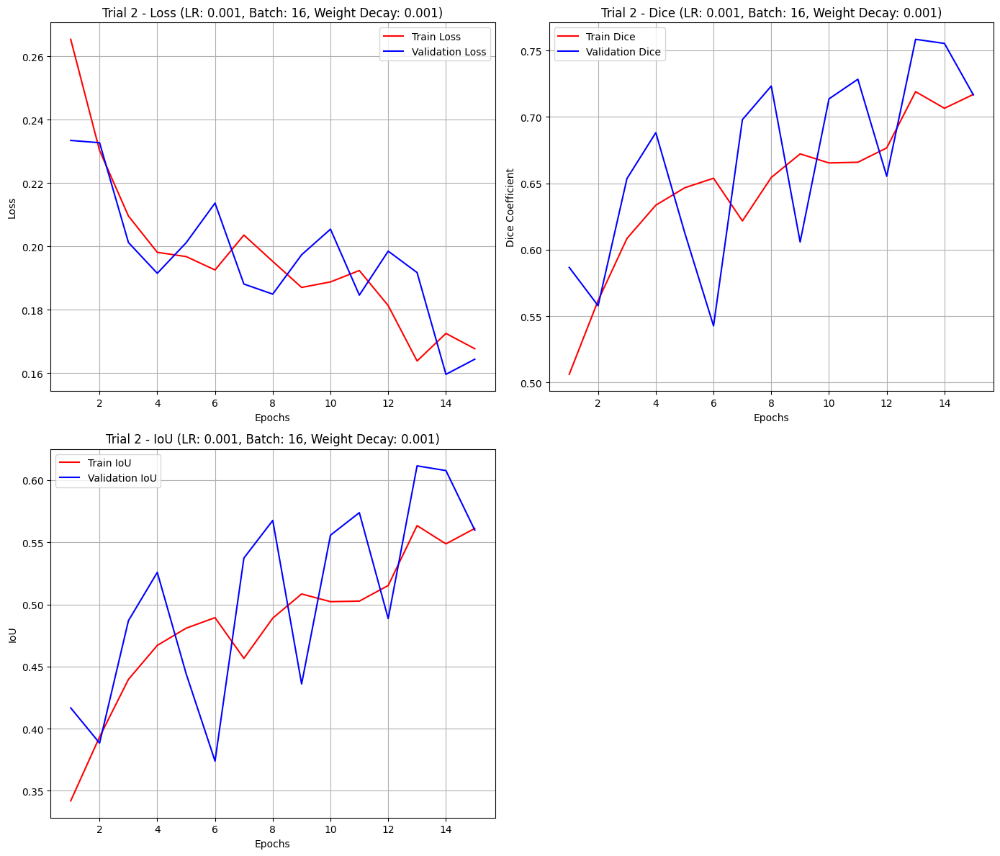

Trial 3/5 --> learning rate = 0.0001, batch_size = 16, weight_decay = 0.0001


Epoch 1 Training:   3%|▎         | 1/29 [00:04<01:52,  4.00s/batch]

Training Loss: 0.4337


Epoch 1 Training:   7%|▋         | 2/29 [00:08<01:48,  4.00s/batch]

Training Loss: 0.4221


Epoch 1 Training:  10%|█         | 3/29 [00:11<01:42,  3.95s/batch]

Training Loss: 0.3653


Epoch 1 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.98s/batch]

Training Loss: 0.2795


Epoch 1 Training:  17%|█▋        | 5/29 [00:19<01:35,  3.99s/batch]

Training Loss: 0.3168


Epoch 1 Training:  21%|██        | 6/29 [00:23<01:31,  3.99s/batch]

Training Loss: 0.2912


Epoch 1 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.3124


Epoch 1 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.05s/batch]

Training Loss: 0.2639


Epoch 1 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.2349


Epoch 1 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.11s/batch]

Training Loss: 0.2678


Epoch 1 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.10s/batch]

Training Loss: 0.2262


Epoch 1 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.06s/batch]

Training Loss: 0.2805


Epoch 1 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.08s/batch]

Training Loss: 0.2592


Epoch 1 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.09s/batch]

Training Loss: 0.2852


Epoch 1 Training:  52%|█████▏    | 15/29 [01:00<00:57,  4.08s/batch]

Training Loss: 0.2637


Epoch 1 Training:  55%|█████▌    | 16/29 [01:04<00:53,  4.09s/batch]

Training Loss: 0.2075


Epoch 1 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.06s/batch]

Training Loss: 0.2686


Epoch 1 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.06s/batch]

Training Loss: 0.2311


Epoch 1 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.07s/batch]

Training Loss: 0.2410


Epoch 1 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.07s/batch]

Training Loss: 0.1888


Epoch 1 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.05s/batch]

Training Loss: 0.2806


Epoch 1 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.03s/batch]

Training Loss: 0.2543


Epoch 1 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.00s/batch]

Training Loss: 0.2131


Epoch 1 Training:  83%|████████▎ | 24/29 [01:36<00:19,  3.99s/batch]

Training Loss: 0.1929


Epoch 1 Training:  86%|████████▌ | 25/29 [01:40<00:15,  3.96s/batch]

Training Loss: 0.2051


Epoch 1 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.02s/batch]

Training Loss: 0.2359


Epoch 1 Training:  93%|█████████▎| 27/29 [01:48<00:07,  4.00s/batch]

Training Loss: 0.2090


Epoch 1 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.03s/batch]

Training Loss: 0.1935


Epoch 1 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.1070




Epoch 1 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.73s/batch]

Validation Loss: 0.2926


Epoch 1 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Validation Loss: 0.2414


Epoch 1 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Validation Loss: 0.2377


Epoch 1 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.76s/batch]

Validation Loss: 0.2139


Epoch 1 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.71s/batch]

Validation Loss: 0.2107


Epoch 1 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Validation Loss: 0.2218


Epoch 1 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.72s/batch]

Validation Loss: 0.1897


Epoch 1 Validation: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Validation Loss: 0.1843
Epoch 1, Validation Loss: 0.2240, Validation Dice: 0.6055, Validation IoU: 0.4362




Epoch 2 Training:   3%|▎         | 1/29 [00:03<01:49,  3.92s/batch]

Training Loss: 0.1915


Epoch 2 Training:   7%|▋         | 2/29 [00:08<01:49,  4.06s/batch]

Training Loss: 0.1904


Epoch 2 Training:  10%|█         | 3/29 [00:12<01:43,  4.00s/batch]

Training Loss: 0.2026


Epoch 2 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.08s/batch]

Training Loss: 0.2267


Epoch 2 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.2110


Epoch 2 Training:  21%|██        | 6/29 [00:24<01:32,  4.04s/batch]

Training Loss: 0.2628


Epoch 2 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.2264


Epoch 2 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.01s/batch]

Training Loss: 0.2003


Epoch 2 Training:  31%|███       | 9/29 [00:36<01:19,  3.99s/batch]

Training Loss: 0.2119


Epoch 2 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.06s/batch]

Training Loss: 0.1827


Epoch 2 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.2552


Epoch 2 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.06s/batch]

Training Loss: 0.2131


Epoch 2 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.04s/batch]

Training Loss: 0.2019


Epoch 2 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.2124


Epoch 2 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.1996


Epoch 2 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.04s/batch]

Training Loss: 0.2153


Epoch 2 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.2227


Epoch 2 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.03s/batch]

Training Loss: 0.2275


Epoch 2 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.03s/batch]

Training Loss: 0.2067


Epoch 2 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.08s/batch]

Training Loss: 0.2347


Epoch 2 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.05s/batch]

Training Loss: 0.1707


Epoch 2 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.07s/batch]

Training Loss: 0.2025


Epoch 2 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.07s/batch]

Training Loss: 0.1500


Epoch 2 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.1867


Epoch 2 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.1784


Epoch 2 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.03s/batch]

Training Loss: 0.1836


Epoch 2 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.02s/batch]

Training Loss: 0.1993


Epoch 2 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.04s/batch]

Training Loss: 0.1830


Epoch 2 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.3586




Epoch 2 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.2781


Epoch 2 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.79s/batch]

Validation Loss: 0.2253


Epoch 2 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.2096


Epoch 2 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.1879


Epoch 2 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Validation Loss: 0.1888


Epoch 2 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Validation Loss: 0.1992


Epoch 2 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1600


Epoch 2 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.75s/batch]


Validation Loss: 0.1658
Epoch 2, Validation Loss: 0.2018, Validation Dice: 0.6489, Validation IoU: 0.4828




Epoch 3 Training:   3%|▎         | 1/29 [00:03<01:51,  3.99s/batch]

Training Loss: 0.1848


Epoch 3 Training:   7%|▋         | 2/29 [00:08<01:49,  4.05s/batch]

Training Loss: 0.1500


Epoch 3 Training:  10%|█         | 3/29 [00:12<01:43,  4.00s/batch]

Training Loss: 0.1956


Epoch 3 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.02s/batch]

Training Loss: 0.1636


Epoch 3 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.04s/batch]

Training Loss: 0.1886


Epoch 3 Training:  21%|██        | 6/29 [00:24<01:33,  4.06s/batch]

Training Loss: 0.1941


Epoch 3 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.1749


Epoch 3 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.04s/batch]

Training Loss: 0.1942


Epoch 3 Training:  31%|███       | 9/29 [00:36<01:21,  4.05s/batch]

Training Loss: 0.1945


Epoch 3 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.08s/batch]

Training Loss: 0.2032


Epoch 3 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1805


Epoch 3 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.04s/batch]

Training Loss: 0.1723


Epoch 3 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.01s/batch]

Training Loss: 0.2308


Epoch 3 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.2078


Epoch 3 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.01s/batch]

Training Loss: 0.1495


Epoch 3 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.03s/batch]

Training Loss: 0.1650


Epoch 3 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.04s/batch]

Training Loss: 0.2175


Epoch 3 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.04s/batch]

Training Loss: 0.2069


Epoch 3 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.01s/batch]

Training Loss: 0.1829


Epoch 3 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.05s/batch]

Training Loss: 0.2351


Epoch 3 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.04s/batch]

Training Loss: 0.2215


Epoch 3 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.06s/batch]

Training Loss: 0.1549


Epoch 3 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.1681


Epoch 3 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.05s/batch]

Training Loss: 0.2218


Epoch 3 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.03s/batch]

Training Loss: 0.1682


Epoch 3 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.03s/batch]

Training Loss: 0.1768


Epoch 3 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.01s/batch]

Training Loss: 0.1738


Epoch 3 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.03s/batch]

Training Loss: 0.1749


Epoch 3 Training: 100%|██████████| 29/29 [01:53<00:00,  3.91s/batch]


Training Loss: 0.1630




Epoch 3 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.72s/batch]

Validation Loss: 0.2350


Epoch 3 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.2129


Epoch 3 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.1922


Epoch 3 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1707


Epoch 3 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1725


Epoch 3 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Validation Loss: 0.2029


Epoch 3 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1512


Epoch 3 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1560
Epoch 3, Validation Loss: 0.1867, Validation Dice: 0.7011, Validation IoU: 0.5420




Epoch 4 Training:   3%|▎         | 1/29 [00:03<01:49,  3.92s/batch]

Training Loss: 0.1608


Epoch 4 Training:   7%|▋         | 2/29 [00:08<01:49,  4.06s/batch]

Training Loss: 0.1709


Epoch 4 Training:  10%|█         | 3/29 [00:12<01:44,  4.03s/batch]

Training Loss: 0.2075


Epoch 4 Training:  14%|█▍        | 4/29 [00:15<01:39,  3.99s/batch]

Training Loss: 0.1612


Epoch 4 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1864


Epoch 4 Training:  21%|██        | 6/29 [00:24<01:33,  4.04s/batch]

Training Loss: 0.1810


Epoch 4 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.00s/batch]

Training Loss: 0.2226


Epoch 4 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.02s/batch]

Training Loss: 0.1402


Epoch 4 Training:  31%|███       | 9/29 [00:36<01:19,  4.00s/batch]

Training Loss: 0.1810


Epoch 4 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.05s/batch]

Training Loss: 0.1766


Epoch 4 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1810


Epoch 4 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.05s/batch]

Training Loss: 0.1628


Epoch 4 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.03s/batch]

Training Loss: 0.1647


Epoch 4 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.1529


Epoch 4 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.00s/batch]

Training Loss: 0.1805


Epoch 4 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.1735


Epoch 4 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.1552


Epoch 4 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.03s/batch]

Training Loss: 0.1839


Epoch 4 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.1507


Epoch 4 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.06s/batch]

Training Loss: 0.2009


Epoch 4 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.03s/batch]

Training Loss: 0.1620


Epoch 4 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.1506


Epoch 4 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.06s/batch]

Training Loss: 0.1486


Epoch 4 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.03s/batch]

Training Loss: 0.1600


Epoch 4 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.03s/batch]

Training Loss: 0.1562


Epoch 4 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.03s/batch]

Training Loss: 0.1610


Epoch 4 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.03s/batch]

Training Loss: 0.1858


Epoch 4 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.02s/batch]

Training Loss: 0.1825


Epoch 4 Training: 100%|██████████| 29/29 [01:53<00:00,  3.91s/batch]


Training Loss: 0.2856




Epoch 4 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.78s/batch]

Validation Loss: 0.2175


Epoch 4 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Validation Loss: 0.2018


Epoch 4 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1812


Epoch 4 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.1642


Epoch 4 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.1605


Epoch 4 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.2028


Epoch 4 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1497


Epoch 4 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1505
Epoch 4, Validation Loss: 0.1785, Validation Dice: 0.7275, Validation IoU: 0.5734




Epoch 5 Training:   3%|▎         | 1/29 [00:03<01:49,  3.89s/batch]

Training Loss: 0.1487


Epoch 5 Training:   7%|▋         | 2/29 [00:07<01:48,  4.01s/batch]

Training Loss: 0.2186


Epoch 5 Training:  10%|█         | 3/29 [00:12<01:44,  4.01s/batch]

Training Loss: 0.1610


Epoch 5 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.04s/batch]

Training Loss: 0.1431


Epoch 5 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.04s/batch]

Training Loss: 0.1436


Epoch 5 Training:  21%|██        | 6/29 [00:24<01:33,  4.05s/batch]

Training Loss: 0.1598


Epoch 5 Training:  24%|██▍       | 7/29 [00:28<01:27,  3.98s/batch]

Training Loss: 0.1878


Epoch 5 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.01s/batch]

Training Loss: 0.1896


Epoch 5 Training:  31%|███       | 9/29 [00:36<01:19,  3.98s/batch]

Training Loss: 0.1999


Epoch 5 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.1745


Epoch 5 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.00s/batch]

Training Loss: 0.1494


Epoch 5 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.03s/batch]

Training Loss: 0.1208


Epoch 5 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.02s/batch]

Training Loss: 0.1724


Epoch 5 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.1852


Epoch 5 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.2141


Epoch 5 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.06s/batch]

Training Loss: 0.1958


Epoch 5 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.06s/batch]

Training Loss: 0.1606


Epoch 5 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.06s/batch]

Training Loss: 0.1645


Epoch 5 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.05s/batch]

Training Loss: 0.1528


Epoch 5 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.09s/batch]

Training Loss: 0.1311


Epoch 5 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.06s/batch]

Training Loss: 0.1809


Epoch 5 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.09s/batch]

Training Loss: 0.2192


Epoch 5 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.06s/batch]

Training Loss: 0.1586


Epoch 5 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.09s/batch]

Training Loss: 0.1666


Epoch 5 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.05s/batch]

Training Loss: 0.1784


Epoch 5 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.1276


Epoch 5 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.01s/batch]

Training Loss: 0.1628


Epoch 5 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.04s/batch]

Training Loss: 0.1663


Epoch 5 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.1421




Epoch 5 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.2183


Epoch 5 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Validation Loss: 0.1837


Epoch 5 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1704


Epoch 5 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.1610


Epoch 5 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Validation Loss: 0.1460


Epoch 5 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Validation Loss: 0.1757


Epoch 5 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1404


Epoch 5 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1466
Epoch 5, Validation Loss: 0.1678, Validation Dice: 0.7298, Validation IoU: 0.5762




Epoch 6 Training:   3%|▎         | 1/29 [00:04<01:52,  4.03s/batch]

Training Loss: 0.1604


Epoch 6 Training:   7%|▋         | 2/29 [00:08<01:50,  4.08s/batch]

Training Loss: 0.1753


Epoch 6 Training:  10%|█         | 3/29 [00:12<01:44,  4.03s/batch]

Training Loss: 0.1515


Epoch 6 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.07s/batch]

Training Loss: 0.1710


Epoch 6 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1678


Epoch 6 Training:  21%|██        | 6/29 [00:24<01:33,  4.06s/batch]

Training Loss: 0.1580


Epoch 6 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.1506


Epoch 6 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.03s/batch]

Training Loss: 0.1364


Epoch 6 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.1878


Epoch 6 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.06s/batch]

Training Loss: 0.1346


Epoch 6 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.1872


Epoch 6 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.07s/batch]

Training Loss: 0.1945


Epoch 6 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.06s/batch]

Training Loss: 0.1395


Epoch 6 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.03s/batch]

Training Loss: 0.1622


Epoch 6 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.04s/batch]

Training Loss: 0.1235


Epoch 6 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.04s/batch]

Training Loss: 0.1364


Epoch 6 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.1199


Epoch 6 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.05s/batch]

Training Loss: 0.1525


Epoch 6 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.05s/batch]

Training Loss: 0.1414


Epoch 6 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.05s/batch]

Training Loss: 0.1498


Epoch 6 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.00s/batch]

Training Loss: 0.1693


Epoch 6 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.04s/batch]

Training Loss: 0.2017


Epoch 6 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.06s/batch]

Training Loss: 0.1629


Epoch 6 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.04s/batch]

Training Loss: 0.1606


Epoch 6 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.01s/batch]

Training Loss: 0.1493


Epoch 6 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.02s/batch]

Training Loss: 0.1769


Epoch 6 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.02s/batch]

Training Loss: 0.1646


Epoch 6 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.06s/batch]

Training Loss: 0.1551


Epoch 6 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.1651




Epoch 6 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.2117


Epoch 6 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.1777


Epoch 6 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.80s/batch]

Validation Loss: 0.1648


Epoch 6 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.1543


Epoch 6 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.1434


Epoch 6 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1711


Epoch 6 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Validation Loss: 0.1439


Epoch 6 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.75s/batch]


Validation Loss: 0.1517
Epoch 6, Validation Loss: 0.1648, Validation Dice: 0.7335, Validation IoU: 0.5808




Epoch 7 Training:   3%|▎         | 1/29 [00:04<01:52,  4.01s/batch]

Training Loss: 0.1420


Epoch 7 Training:   7%|▋         | 2/29 [00:08<01:48,  4.00s/batch]

Training Loss: 0.1335


Epoch 7 Training:  10%|█         | 3/29 [00:12<01:44,  4.01s/batch]

Training Loss: 0.1793


Epoch 7 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.04s/batch]

Training Loss: 0.1812


Epoch 7 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1588


Epoch 7 Training:  21%|██        | 6/29 [00:24<01:33,  4.05s/batch]

Training Loss: 0.1631


Epoch 7 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.1571


Epoch 7 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.1722


Epoch 7 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.1524


Epoch 7 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.07s/batch]

Training Loss: 0.1612


Epoch 7 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1273


Epoch 7 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.05s/batch]

Training Loss: 0.1157


Epoch 7 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.05s/batch]

Training Loss: 0.1743


Epoch 7 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.01s/batch]

Training Loss: 0.1566


Epoch 7 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.01s/batch]

Training Loss: 0.1447


Epoch 7 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.1308


Epoch 7 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.2333


Epoch 7 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.04s/batch]

Training Loss: 0.1388


Epoch 7 Training:  66%|██████▌   | 19/29 [01:16<00:39,  4.00s/batch]

Training Loss: 0.1247


Epoch 7 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.06s/batch]

Training Loss: 0.1497


Epoch 7 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.04s/batch]

Training Loss: 0.1237


Epoch 7 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.1635


Epoch 7 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.1590


Epoch 7 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.03s/batch]

Training Loss: 0.1656


Epoch 7 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.05s/batch]

Training Loss: 0.1338


Epoch 7 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.08s/batch]

Training Loss: 0.1670


Epoch 7 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.04s/batch]

Training Loss: 0.1962


Epoch 7 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.10s/batch]

Training Loss: 0.1629


Epoch 7 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.0832




Epoch 7 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.2259


Epoch 7 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.1828


Epoch 7 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.1674


Epoch 7 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1504


Epoch 7 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.1405


Epoch 7 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Validation Loss: 0.1608


Epoch 7 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1335


Epoch 7 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1490
Epoch 7, Validation Loss: 0.1638, Validation Dice: 0.7271, Validation IoU: 0.5729




Epoch 8 Training:   3%|▎         | 1/29 [00:04<01:52,  4.02s/batch]

Training Loss: 0.1367


Epoch 8 Training:   7%|▋         | 2/29 [00:08<01:49,  4.04s/batch]

Training Loss: 0.1221


Epoch 8 Training:  10%|█         | 3/29 [00:12<01:44,  4.03s/batch]

Training Loss: 0.1379


Epoch 8 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.06s/batch]

Training Loss: 0.1897


Epoch 8 Training:  17%|█▋        | 5/29 [00:20<01:38,  4.09s/batch]

Training Loss: 0.1529


Epoch 8 Training:  21%|██        | 6/29 [00:24<01:34,  4.11s/batch]

Training Loss: 0.2125


Epoch 8 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.07s/batch]

Training Loss: 0.1837


Epoch 8 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.10s/batch]

Training Loss: 0.2196


Epoch 8 Training:  31%|███       | 9/29 [00:36<01:21,  4.05s/batch]

Training Loss: 0.1576


Epoch 8 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.1324


Epoch 8 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.00s/batch]

Training Loss: 0.1436


Epoch 8 Training:  41%|████▏     | 12/29 [00:48<01:07,  3.99s/batch]

Training Loss: 0.2048


Epoch 8 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.01s/batch]

Training Loss: 0.2188


Epoch 8 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.05s/batch]

Training Loss: 0.1711


Epoch 8 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.1463


Epoch 8 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.1280


Epoch 8 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.1068


Epoch 8 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.07s/batch]

Training Loss: 0.1689


Epoch 8 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.06s/batch]

Training Loss: 0.1617


Epoch 8 Training:  69%|██████▉   | 20/29 [01:21<00:37,  4.12s/batch]

Training Loss: 0.1176


Epoch 8 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.05s/batch]

Training Loss: 0.1565


Epoch 8 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.04s/batch]

Training Loss: 0.1495


Epoch 8 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.00s/batch]

Training Loss: 0.1210


Epoch 8 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.03s/batch]

Training Loss: 0.1559


Epoch 8 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.05s/batch]

Training Loss: 0.1068


Epoch 8 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.03s/batch]

Training Loss: 0.1397


Epoch 8 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.02s/batch]

Training Loss: 0.1516


Epoch 8 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.03s/batch]

Training Loss: 0.1524


Epoch 8 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.0882




Epoch 8 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.1814


Epoch 8 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Validation Loss: 0.1740


Epoch 8 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Validation Loss: 0.1641


Epoch 8 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.1431


Epoch 8 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Validation Loss: 0.1377


Epoch 8 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Validation Loss: 0.1771


Epoch 8 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Validation Loss: 0.1270


Epoch 8 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Validation Loss: 0.1406
Epoch 8, Validation Loss: 0.1556, Validation Dice: 0.7606, Validation IoU: 0.6148




Epoch 9 Training:   3%|▎         | 1/29 [00:03<01:49,  3.91s/batch]

Training Loss: 0.1606


Epoch 9 Training:   7%|▋         | 2/29 [00:08<01:50,  4.08s/batch]

Training Loss: 0.1618


Epoch 9 Training:  10%|█         | 3/29 [00:12<01:44,  4.02s/batch]

Training Loss: 0.1292


Epoch 9 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.05s/batch]

Training Loss: 0.1210


Epoch 9 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.02s/batch]

Training Loss: 0.1225


Epoch 9 Training:  21%|██        | 6/29 [00:24<01:33,  4.06s/batch]

Training Loss: 0.1423


Epoch 9 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.1356


Epoch 9 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.09s/batch]

Training Loss: 0.1760


Epoch 9 Training:  31%|███       | 9/29 [00:36<01:20,  4.05s/batch]

Training Loss: 0.1508


Epoch 9 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.05s/batch]

Training Loss: 0.1887


Epoch 9 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1544


Epoch 9 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.05s/batch]

Training Loss: 0.1574


Epoch 9 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.04s/batch]

Training Loss: 0.1879


Epoch 9 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.1720


Epoch 9 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.03s/batch]

Training Loss: 0.1635


Epoch 9 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.06s/batch]

Training Loss: 0.1707


Epoch 9 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.06s/batch]

Training Loss: 0.1394


Epoch 9 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.05s/batch]

Training Loss: 0.1299


Epoch 9 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.01s/batch]

Training Loss: 0.1307


Epoch 9 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.03s/batch]

Training Loss: 0.1429


Epoch 9 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.02s/batch]

Training Loss: 0.1161


Epoch 9 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.05s/batch]

Training Loss: 0.1287


Epoch 9 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.06s/batch]

Training Loss: 0.1361


Epoch 9 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.1303


Epoch 9 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.05s/batch]

Training Loss: 0.1543


Epoch 9 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.04s/batch]

Training Loss: 0.1435


Epoch 9 Training:  93%|█████████▎| 27/29 [01:48<00:07,  3.98s/batch]

Training Loss: 0.1309


Epoch 9 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.05s/batch]

Training Loss: 0.1624


Epoch 9 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.1139




Epoch 9 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.1910


Epoch 9 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.86s/batch]

Validation Loss: 0.1629


Epoch 9 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.83s/batch]

Validation Loss: 0.1503


Epoch 9 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Validation Loss: 0.1360


Epoch 9 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Validation Loss: 0.1237


Epoch 9 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Validation Loss: 0.1466


Epoch 9 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.1172


Epoch 9 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Validation Loss: 0.1347
Epoch 9, Validation Loss: 0.1453, Validation Dice: 0.7676, Validation IoU: 0.6242




Epoch 10 Training:   3%|▎         | 1/29 [00:03<01:51,  3.99s/batch]

Training Loss: 0.1981


Epoch 10 Training:   7%|▋         | 2/29 [00:08<01:50,  4.10s/batch]

Training Loss: 0.1544


Epoch 10 Training:  10%|█         | 3/29 [00:12<01:46,  4.09s/batch]

Training Loss: 0.1248


Epoch 10 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.09s/batch]

Training Loss: 0.1641


Epoch 10 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1425


Epoch 10 Training:  21%|██        | 6/29 [00:24<01:32,  4.02s/batch]

Training Loss: 0.1065


Epoch 10 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.1534


Epoch 10 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.05s/batch]

Training Loss: 0.1158


Epoch 10 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.1164


Epoch 10 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.1371


Epoch 10 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1711


Epoch 10 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.04s/batch]

Training Loss: 0.1055


Epoch 10 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.03s/batch]

Training Loss: 0.1335


Epoch 10 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.01s/batch]

Training Loss: 0.1442


Epoch 10 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.2037


Epoch 10 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.1403


Epoch 10 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.05s/batch]

Training Loss: 0.1588


Epoch 10 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.07s/batch]

Training Loss: 0.1109


Epoch 10 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.1270


Epoch 10 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.04s/batch]

Training Loss: 0.1479


Epoch 10 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.03s/batch]

Training Loss: 0.1370


Epoch 10 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.08s/batch]

Training Loss: 0.1345


Epoch 10 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.05s/batch]

Training Loss: 0.1474


Epoch 10 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.1564


Epoch 10 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.1430


Epoch 10 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.05s/batch]

Training Loss: 0.1176


Epoch 10 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.06s/batch]

Training Loss: 0.1161


Epoch 10 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.05s/batch]

Training Loss: 0.0960


Epoch 10 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.0548




Epoch 10 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.1810


Epoch 10 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.79s/batch]

Validation Loss: 0.1746


Epoch 10 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Validation Loss: 0.1631


Epoch 10 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.1402


Epoch 10 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1285


Epoch 10 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1663


Epoch 10 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1102


Epoch 10 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1369
Epoch 10, Validation Loss: 0.1501, Validation Dice: 0.7718, Validation IoU: 0.6298




Epoch 11 Training:   3%|▎         | 1/29 [00:04<01:52,  4.01s/batch]

Training Loss: 0.1436


Epoch 11 Training:   7%|▋         | 2/29 [00:08<01:49,  4.06s/batch]

Training Loss: 0.1331


Epoch 11 Training:  10%|█         | 3/29 [00:12<01:44,  4.01s/batch]

Training Loss: 0.1398


Epoch 11 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.08s/batch]

Training Loss: 0.1467


Epoch 11 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.1061


Epoch 11 Training:  21%|██        | 6/29 [00:24<01:33,  4.04s/batch]

Training Loss: 0.1313


Epoch 11 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.04s/batch]

Training Loss: 0.1291


Epoch 11 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.1611


Epoch 11 Training:  31%|███       | 9/29 [00:36<01:20,  4.01s/batch]

Training Loss: 0.1497


Epoch 11 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.07s/batch]

Training Loss: 0.1696


Epoch 11 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.1816


Epoch 11 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.04s/batch]

Training Loss: 0.1397


Epoch 11 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.04s/batch]

Training Loss: 0.1348


Epoch 11 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.07s/batch]

Training Loss: 0.1470


Epoch 11 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.04s/batch]

Training Loss: 0.1121


Epoch 11 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.06s/batch]

Training Loss: 0.1510


Epoch 11 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.05s/batch]

Training Loss: 0.1728


Epoch 11 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.01s/batch]

Training Loss: 0.1144


Epoch 11 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.01s/batch]

Training Loss: 0.1590


Epoch 11 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.04s/batch]

Training Loss: 0.1253


Epoch 11 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.01s/batch]

Training Loss: 0.1243


Epoch 11 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.05s/batch]

Training Loss: 0.1122


Epoch 11 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.04s/batch]

Training Loss: 0.1633


Epoch 11 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.04s/batch]

Training Loss: 0.1175


Epoch 11 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.1459


Epoch 11 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.04s/batch]

Training Loss: 0.1520


Epoch 11 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.03s/batch]

Training Loss: 0.1604


Epoch 11 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.03s/batch]

Training Loss: 0.1233


Epoch 11 Training: 100%|██████████| 29/29 [01:53<00:00,  3.92s/batch]


Training Loss: 0.1412




Epoch 11 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.1951


Epoch 11 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.79s/batch]

Validation Loss: 0.1604


Epoch 11 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Validation Loss: 0.1552


Epoch 11 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1434


Epoch 11 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1208


Epoch 11 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1500


Epoch 11 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.1380


Epoch 11 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1357
Epoch 11, Validation Loss: 0.1498, Validation Dice: 0.7453, Validation IoU: 0.5951




Epoch 12 Training:   3%|▎         | 1/29 [00:04<01:53,  4.04s/batch]

Training Loss: 0.1227


Epoch 12 Training:   7%|▋         | 2/29 [00:08<01:49,  4.05s/batch]

Training Loss: 0.1238


Epoch 12 Training:  10%|█         | 3/29 [00:11<01:43,  3.98s/batch]

Training Loss: 0.1416


Epoch 12 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.01s/batch]

Training Loss: 0.1145


Epoch 12 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1362


Epoch 12 Training:  21%|██        | 6/29 [00:24<01:32,  4.03s/batch]

Training Loss: 0.1125


Epoch 12 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.1415


Epoch 12 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.05s/batch]

Training Loss: 0.1656


Epoch 12 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.0882


Epoch 12 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.02s/batch]

Training Loss: 0.1624


Epoch 12 Training:  38%|███▊      | 11/29 [00:44<01:11,  3.99s/batch]

Training Loss: 0.1234


Epoch 12 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.02s/batch]

Training Loss: 0.1530


Epoch 12 Training:  45%|████▍     | 13/29 [00:52<01:03,  3.99s/batch]

Training Loss: 0.1455


Epoch 12 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.02s/batch]

Training Loss: 0.1331


Epoch 12 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.04s/batch]

Training Loss: 0.1310


Epoch 12 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.1342


Epoch 12 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.07s/batch]

Training Loss: 0.1260


Epoch 12 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.05s/batch]

Training Loss: 0.1371


Epoch 12 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.01s/batch]

Training Loss: 0.1186


Epoch 12 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.05s/batch]

Training Loss: 0.1285


Epoch 12 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.02s/batch]

Training Loss: 0.1684


Epoch 12 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.07s/batch]

Training Loss: 0.1753


Epoch 12 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.05s/batch]

Training Loss: 0.1319


Epoch 12 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.05s/batch]

Training Loss: 0.1439


Epoch 12 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.05s/batch]

Training Loss: 0.1184


Epoch 12 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.07s/batch]

Training Loss: 0.1089


Epoch 12 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.04s/batch]

Training Loss: 0.1389


Epoch 12 Training:  97%|█████████▋| 28/29 [01:52<00:04,  4.05s/batch]

Training Loss: 0.1442


Epoch 12 Training: 100%|██████████| 29/29 [01:53<00:00,  3.91s/batch]


Training Loss: 0.1825




Epoch 12 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.1582


Epoch 12 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.1569


Epoch 12 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.1479


Epoch 12 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.1308


Epoch 12 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1208


Epoch 12 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Validation Loss: 0.1577


Epoch 12 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1150


Epoch 12 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1300
Epoch 12, Validation Loss: 0.1396, Validation Dice: 0.7940, Validation IoU: 0.6594




Epoch 13 Training:   3%|▎         | 1/29 [00:03<01:51,  3.97s/batch]

Training Loss: 0.1538


Epoch 13 Training:   7%|▋         | 2/29 [00:08<01:50,  4.08s/batch]

Training Loss: 0.1193


Epoch 13 Training:  10%|█         | 3/29 [00:12<01:44,  4.01s/batch]

Training Loss: 0.1559


Epoch 13 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.03s/batch]

Training Loss: 0.1747


Epoch 13 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.04s/batch]

Training Loss: 0.1167


Epoch 13 Training:  21%|██        | 6/29 [00:24<01:33,  4.07s/batch]

Training Loss: 0.1110


Epoch 13 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.1464


Epoch 13 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.04s/batch]

Training Loss: 0.1158


Epoch 13 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.1113


Epoch 13 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.10s/batch]

Training Loss: 0.1160


Epoch 13 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.08s/batch]

Training Loss: 0.0832


Epoch 13 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.11s/batch]

Training Loss: 0.1892


Epoch 13 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.07s/batch]

Training Loss: 0.1646


Epoch 13 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.09s/batch]

Training Loss: 0.1526


Epoch 13 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.03s/batch]

Training Loss: 0.1167


Epoch 13 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.04s/batch]

Training Loss: 0.1099


Epoch 13 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.1418


Epoch 13 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.03s/batch]

Training Loss: 0.1336


Epoch 13 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.1750


Epoch 13 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.03s/batch]

Training Loss: 0.1298


Epoch 13 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.00s/batch]

Training Loss: 0.0920


Epoch 13 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.04s/batch]

Training Loss: 0.1179


Epoch 13 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.05s/batch]

Training Loss: 0.1230


Epoch 13 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.09s/batch]

Training Loss: 0.2219


Epoch 13 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.07s/batch]

Training Loss: 0.1567


Epoch 13 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.1197


Epoch 13 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.08s/batch]

Training Loss: 0.1518


Epoch 13 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.06s/batch]

Training Loss: 0.1250


Epoch 13 Training: 100%|██████████| 29/29 [01:53<00:00,  3.93s/batch]


Training Loss: 0.1671




Epoch 13 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Validation Loss: 0.1541


Epoch 13 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Validation Loss: 0.1518


Epoch 13 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1441


Epoch 13 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1168


Epoch 13 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.1144


Epoch 13 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1465


Epoch 13 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.1088


Epoch 13 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1249
Epoch 13, Validation Loss: 0.1327, Validation Dice: 0.7992, Validation IoU: 0.6666




Epoch 14 Training:   3%|▎         | 1/29 [00:03<01:50,  3.95s/batch]

Training Loss: 0.1279


Epoch 14 Training:   7%|▋         | 2/29 [00:08<01:50,  4.08s/batch]

Training Loss: 0.1413


Epoch 14 Training:  10%|█         | 3/29 [00:11<01:43,  3.98s/batch]

Training Loss: 0.0858


Epoch 14 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.05s/batch]

Training Loss: 0.1593


Epoch 14 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.03s/batch]

Training Loss: 0.1196


Epoch 14 Training:  21%|██        | 6/29 [00:24<01:32,  4.03s/batch]

Training Loss: 0.1182


Epoch 14 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.1185


Epoch 14 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.03s/batch]

Training Loss: 0.1223


Epoch 14 Training:  31%|███       | 9/29 [00:36<01:20,  4.00s/batch]

Training Loss: 0.1044


Epoch 14 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.02s/batch]

Training Loss: 0.1145


Epoch 14 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.00s/batch]

Training Loss: 0.1605


Epoch 14 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.04s/batch]

Training Loss: 0.1340


Epoch 14 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.03s/batch]

Training Loss: 0.1247


Epoch 14 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.05s/batch]

Training Loss: 0.1462


Epoch 14 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.01s/batch]

Training Loss: 0.1259


Epoch 14 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.00s/batch]

Training Loss: 0.1187


Epoch 14 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.01s/batch]

Training Loss: 0.1132


Epoch 14 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.06s/batch]

Training Loss: 0.1777


Epoch 14 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.06s/batch]

Training Loss: 0.1164


Epoch 14 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.07s/batch]

Training Loss: 0.1240


Epoch 14 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.06s/batch]

Training Loss: 0.1345


Epoch 14 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.1045


Epoch 14 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.1311


Epoch 14 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.04s/batch]

Training Loss: 0.1078


Epoch 14 Training:  86%|████████▌ | 25/29 [01:40<00:16,  4.01s/batch]

Training Loss: 0.1111


Epoch 14 Training:  90%|████████▉ | 26/29 [01:44<00:12,  4.03s/batch]

Training Loss: 0.1653


Epoch 14 Training:  93%|█████████▎| 27/29 [01:48<00:08,  4.05s/batch]

Training Loss: 0.1306


Epoch 14 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.07s/batch]

Training Loss: 0.1308


Epoch 14 Training: 100%|██████████| 29/29 [01:53<00:00,  3.91s/batch]


Training Loss: 0.1250




Epoch 14 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.1547


Epoch 14 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Validation Loss: 0.1409


Epoch 14 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Validation Loss: 0.1379


Epoch 14 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Validation Loss: 0.1162


Epoch 14 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.1062


Epoch 14 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Validation Loss: 0.1355


Epoch 14 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.1139


Epoch 14 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Validation Loss: 0.1223
Epoch 14, Validation Loss: 0.1285, Validation Dice: 0.8070, Validation IoU: 0.6772




Epoch 15 Training:   3%|▎         | 1/29 [00:03<01:51,  3.97s/batch]

Training Loss: 0.1097


Epoch 15 Training:   7%|▋         | 2/29 [00:08<01:49,  4.06s/batch]

Training Loss: 0.1534


Epoch 15 Training:  10%|█         | 3/29 [00:12<01:45,  4.04s/batch]

Training Loss: 0.1462


Epoch 15 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.10s/batch]

Training Loss: 0.1163


Epoch 15 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.07s/batch]

Training Loss: 0.1323


Epoch 15 Training:  21%|██        | 6/29 [00:24<01:33,  4.07s/batch]

Training Loss: 0.1571


Epoch 15 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.06s/batch]

Training Loss: 0.1006


Epoch 15 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.08s/batch]

Training Loss: 0.1134


Epoch 15 Training:  31%|███       | 9/29 [00:36<01:20,  4.05s/batch]

Training Loss: 0.1097


Epoch 15 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.08s/batch]

Training Loss: 0.1404


Epoch 15 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.1100


Epoch 15 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.09s/batch]

Training Loss: 0.1195


Epoch 15 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.04s/batch]

Training Loss: 0.1077


Epoch 15 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.07s/batch]

Training Loss: 0.1239


Epoch 15 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.1103


Epoch 15 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.03s/batch]

Training Loss: 0.1087


Epoch 15 Training:  59%|█████▊    | 17/29 [01:08<00:47,  3.99s/batch]

Training Loss: 0.0978


Epoch 15 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.02s/batch]

Training Loss: 0.1549


Epoch 15 Training:  66%|██████▌   | 19/29 [01:16<00:39,  3.99s/batch]

Training Loss: 0.1182


Epoch 15 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.01s/batch]

Training Loss: 0.1522


Epoch 15 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.02s/batch]

Training Loss: 0.1229


Epoch 15 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.03s/batch]

Training Loss: 0.1056


Epoch 15 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.00s/batch]

Training Loss: 0.0987


Epoch 15 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.05s/batch]

Training Loss: 0.1349


Epoch 15 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.07s/batch]

Training Loss: 0.1093


Epoch 15 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.06s/batch]

Training Loss: 0.1500


Epoch 15 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.04s/batch]

Training Loss: 0.1207


Epoch 15 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.09s/batch]

Training Loss: 0.1364


Epoch 15 Training: 100%|██████████| 29/29 [01:53<00:00,  3.93s/batch]


Training Loss: 0.0957




Epoch 15 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.83s/batch]

Validation Loss: 0.1667


Epoch 15 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.86s/batch]

Validation Loss: 0.1506


Epoch 15 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Validation Loss: 0.1396


Epoch 15 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.1100


Epoch 15 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.1080


Epoch 15 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Validation Loss: 0.1270


Epoch 15 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1113


Epoch 15 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Validation Loss: 0.1369
Epoch 15, Validation Loss: 0.1312, Validation Dice: 0.7979, Validation IoU: 0.6646




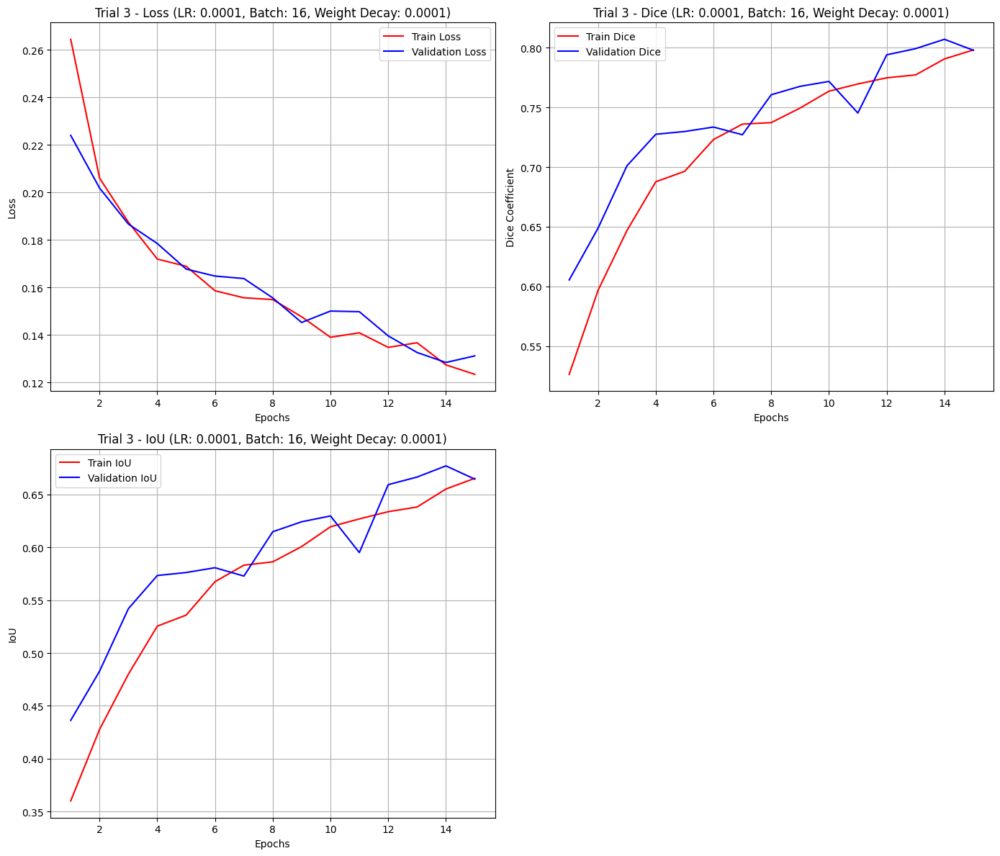

Trial 4/5 --> learning rate = 0.001, batch_size = 32, weight_decay = 0.0001


Epoch 1 Training:   7%|▋         | 1/15 [00:07<01:49,  7.83s/batch]

Training Loss: 0.4254


Epoch 1 Training:  13%|█▎        | 2/15 [00:15<01:44,  8.02s/batch]

Training Loss: 0.7576


Epoch 1 Training:  20%|██        | 3/15 [00:23<01:35,  7.94s/batch]

Training Loss: 0.3351


Epoch 1 Training:  27%|██▋       | 4/15 [00:31<01:24,  7.67s/batch]

Training Loss: 0.3122


Epoch 1 Training:  33%|███▎      | 5/15 [00:39<01:17,  7.79s/batch]

Training Loss: 0.2691


Epoch 1 Training:  40%|████      | 6/15 [00:47<01:11,  7.94s/batch]

Training Loss: 0.2668


Epoch 1 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.75s/batch]

Training Loss: 0.2443


Epoch 1 Training:  53%|█████▎    | 8/15 [01:03<00:55,  7.93s/batch]

Training Loss: 0.2618


Epoch 1 Training:  60%|██████    | 9/15 [01:10<00:47,  7.93s/batch]

Training Loss: 0.2380


Epoch 1 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.81s/batch]

Training Loss: 0.2229


Epoch 1 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.70s/batch]

Training Loss: 0.2223


Epoch 1 Training:  80%|████████  | 12/15 [01:33<00:23,  7.80s/batch]

Training Loss: 0.2887


Epoch 1 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.76s/batch]

Training Loss: 0.2278


Epoch 1 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.92s/batch]

Training Loss: 0.2467


Epoch 1 Training: 100%|██████████| 15/15 [01:50<00:00,  7.36s/batch]


Training Loss: 0.2117




Epoch 1 Validation:  25%|██▌       | 1/4 [00:06<00:18,  6.29s/batch]

Validation Loss: 0.2730


Epoch 1 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.85s/batch]

Validation Loss: 0.2540


Epoch 1 Validation:  75%|███████▌  | 3/4 [00:20<00:06,  6.78s/batch]

Validation Loss: 0.2328


Epoch 1 Validation: 100%|██████████| 4/4 [00:26<00:00,  6.75s/batch]


Validation Loss: 0.2105
Epoch 1, Validation Loss: 0.2426, Validation Dice: 0.5341, Validation IoU: 0.3655




Epoch 2 Training:   7%|▋         | 1/15 [00:08<01:53,  8.10s/batch]

Training Loss: 0.2204


Epoch 2 Training:  13%|█▎        | 2/15 [00:16<01:46,  8.18s/batch]

Training Loss: 0.2350


Epoch 2 Training:  20%|██        | 3/15 [00:23<01:34,  7.84s/batch]

Training Loss: 0.2475


Epoch 2 Training:  27%|██▋       | 4/15 [00:31<01:25,  7.81s/batch]

Training Loss: 0.2204


Epoch 2 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.86s/batch]

Training Loss: 0.2403


Epoch 2 Training:  40%|████      | 6/15 [00:46<01:09,  7.71s/batch]

Training Loss: 0.2159


Epoch 2 Training:  47%|████▋     | 7/15 [00:54<01:01,  7.74s/batch]

Training Loss: 0.2555


Epoch 2 Training:  53%|█████▎    | 8/15 [01:02<00:53,  7.62s/batch]

Training Loss: 0.2460


Epoch 2 Training:  60%|██████    | 9/15 [01:10<00:46,  7.74s/batch]

Training Loss: 0.2173


Epoch 2 Training:  67%|██████▋   | 10/15 [01:17<00:37,  7.60s/batch]

Training Loss: 0.2706


Epoch 2 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.69s/batch]

Training Loss: 0.2098


Epoch 2 Training:  80%|████████  | 12/15 [01:32<00:22,  7.59s/batch]

Training Loss: 0.2417


Epoch 2 Training:  87%|████████▋ | 13/15 [01:40<00:15,  7.71s/batch]

Training Loss: 0.2294


Epoch 2 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.59s/batch]

Training Loss: 0.2288


Epoch 2 Training: 100%|██████████| 15/15 [01:48<00:00,  7.23s/batch]


Training Loss: 0.2980




Epoch 2 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.55s/batch]

Validation Loss: 0.2702


Epoch 2 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.51s/batch]

Validation Loss: 0.2485


Epoch 2 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.45s/batch]

Validation Loss: 0.2200


Epoch 2 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.29s/batch]


Validation Loss: 0.2081
Epoch 2, Validation Loss: 0.2367, Validation Dice: 0.5224, Validation IoU: 0.3543




Epoch 3 Training:   7%|▋         | 1/15 [00:06<01:33,  6.66s/batch]

Training Loss: 0.2419


Epoch 3 Training:  13%|█▎        | 2/15 [00:13<01:29,  6.87s/batch]

Training Loss: 0.2589


Epoch 3 Training:  20%|██        | 3/15 [00:21<01:28,  7.41s/batch]

Training Loss: 0.2457


Epoch 3 Training:  27%|██▋       | 4/15 [00:29<01:20,  7.36s/batch]

Training Loss: 0.1963


Epoch 3 Training:  33%|███▎      | 5/15 [00:36<01:15,  7.56s/batch]

Training Loss: 0.2110


Epoch 3 Training:  40%|████      | 6/15 [00:45<01:09,  7.76s/batch]

Training Loss: 0.2107


Epoch 3 Training:  47%|████▋     | 7/15 [00:52<01:01,  7.72s/batch]

Training Loss: 0.2180


Epoch 3 Training:  53%|█████▎    | 8/15 [01:00<00:54,  7.86s/batch]

Training Loss: 0.2327


Epoch 3 Training:  60%|██████    | 9/15 [01:08<00:47,  7.94s/batch]

Training Loss: 0.1832


Epoch 3 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.70s/batch]

Training Loss: 0.2351


Epoch 3 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.54s/batch]

Training Loss: 0.2084


Epoch 3 Training:  80%|████████  | 12/15 [01:31<00:23,  7.77s/batch]

Training Loss: 0.2356


Epoch 3 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.66s/batch]

Training Loss: 0.2221


Epoch 3 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.80s/batch]

Training Loss: 0.2357


Epoch 3 Training: 100%|██████████| 15/15 [01:47<00:00,  7.18s/batch]


Training Loss: 0.1731




Epoch 3 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.52s/batch]

Validation Loss: 0.2593


Epoch 3 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.49s/batch]

Validation Loss: 0.2416


Epoch 3 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.47s/batch]

Validation Loss: 0.2233


Epoch 3 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.28s/batch]


Validation Loss: 0.2044
Epoch 3, Validation Loss: 0.2322, Validation Dice: 0.5924, Validation IoU: 0.4221




Epoch 4 Training:   7%|▋         | 1/15 [00:07<01:50,  7.87s/batch]

Training Loss: 0.2210


Epoch 4 Training:  13%|█▎        | 2/15 [00:16<01:45,  8.14s/batch]

Training Loss: 0.2319


Epoch 4 Training:  20%|██        | 3/15 [00:23<01:32,  7.75s/batch]

Training Loss: 0.2281


Epoch 4 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.91s/batch]

Training Loss: 0.2229


Epoch 4 Training:  33%|███▎      | 5/15 [00:39<01:19,  7.95s/batch]

Training Loss: 0.2331


Epoch 4 Training:  40%|████      | 6/15 [00:47<01:09,  7.75s/batch]

Training Loss: 0.2509


Epoch 4 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.81s/batch]

Training Loss: 0.1958


Epoch 4 Training:  53%|█████▎    | 8/15 [01:03<00:55,  7.95s/batch]

Training Loss: 0.2130


Epoch 4 Training:  60%|██████    | 9/15 [01:10<00:46,  7.73s/batch]

Training Loss: 0.2267


Epoch 4 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.89s/batch]

Training Loss: 0.2258


Epoch 4 Training:  73%|███████▎  | 11/15 [01:26<00:31,  7.87s/batch]

Training Loss: 0.1773


Epoch 4 Training:  80%|████████  | 12/15 [01:33<00:23,  7.70s/batch]

Training Loss: 0.2005


Epoch 4 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.76s/batch]

Training Loss: 0.2499


Epoch 4 Training:  93%|█████████▎| 14/15 [01:50<00:07,  7.94s/batch]

Training Loss: 0.1843


Epoch 4 Training: 100%|██████████| 15/15 [01:50<00:00,  7.37s/batch]


Training Loss: 0.2155




Epoch 4 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.60s/batch]

Validation Loss: 0.2537


Epoch 4 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.63s/batch]

Validation Loss: 0.2299


Epoch 4 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.53s/batch]

Validation Loss: 0.2057


Epoch 4 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.35s/batch]


Validation Loss: 0.1887
Epoch 4, Validation Loss: 0.2195, Validation Dice: 0.5938, Validation IoU: 0.4235




Epoch 5 Training:   7%|▋         | 1/15 [00:08<01:52,  8.05s/batch]

Training Loss: 0.2345


Epoch 5 Training:  13%|█▎        | 2/15 [00:16<01:45,  8.09s/batch]

Training Loss: 0.1955


Epoch 5 Training:  20%|██        | 3/15 [00:23<01:32,  7.75s/batch]

Training Loss: 0.1993


Epoch 5 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.95s/batch]

Training Loss: 0.1845


Epoch 5 Training:  33%|███▎      | 5/15 [00:39<01:19,  7.95s/batch]

Training Loss: 0.2238


Epoch 5 Training:  40%|████      | 6/15 [00:47<01:09,  7.76s/batch]

Training Loss: 0.2275


Epoch 5 Training:  47%|████▋     | 7/15 [00:55<01:02,  7.83s/batch]

Training Loss: 0.1904


Epoch 5 Training:  53%|█████▎    | 8/15 [01:03<00:55,  7.91s/batch]

Training Loss: 0.2016


Epoch 5 Training:  60%|██████    | 9/15 [01:10<00:46,  7.82s/batch]

Training Loss: 0.2192


Epoch 5 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.94s/batch]

Training Loss: 0.1807


Epoch 5 Training:  73%|███████▎  | 11/15 [01:26<00:31,  7.76s/batch]

Training Loss: 0.2223


Epoch 5 Training:  80%|████████  | 12/15 [01:34<00:23,  7.89s/batch]

Training Loss: 0.1940


Epoch 5 Training:  87%|████████▋ | 13/15 [01:42<00:15,  7.88s/batch]

Training Loss: 0.2487


Epoch 5 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.62s/batch]

Training Loss: 0.1989


Epoch 5 Training: 100%|██████████| 15/15 [01:49<00:00,  7.33s/batch]


Training Loss: 0.2245




Epoch 5 Validation:  25%|██▌       | 1/4 [00:06<00:20,  6.91s/batch]

Validation Loss: 0.2490


Epoch 5 Validation:  50%|█████     | 2/4 [00:14<00:14,  7.28s/batch]

Validation Loss: 0.2171


Epoch 5 Validation:  75%|███████▌  | 3/4 [00:21<00:07,  7.05s/batch]

Validation Loss: 0.1934


Epoch 5 Validation: 100%|██████████| 4/4 [00:27<00:00,  6.98s/batch]


Validation Loss: 0.1835
Epoch 5, Validation Loss: 0.2107, Validation Dice: 0.5989, Validation IoU: 0.4289




Epoch 6 Training:   7%|▋         | 1/15 [00:06<01:30,  6.47s/batch]

Training Loss: 0.2144


Epoch 6 Training:  13%|█▎        | 2/15 [00:13<01:25,  6.60s/batch]

Training Loss: 0.2278


Epoch 6 Training:  20%|██        | 3/15 [00:21<01:27,  7.26s/batch]

Training Loss: 0.2307


Epoch 6 Training:  27%|██▋       | 4/15 [00:28<01:20,  7.32s/batch]

Training Loss: 0.2087


Epoch 6 Training:  33%|███▎      | 5/15 [00:36<01:15,  7.53s/batch]

Training Loss: 0.2158


Epoch 6 Training:  40%|████      | 6/15 [00:44<01:10,  7.80s/batch]

Training Loss: 0.1842


Epoch 6 Training:  47%|████▋     | 7/15 [00:52<01:01,  7.64s/batch]

Training Loss: 0.1903


Epoch 6 Training:  53%|█████▎    | 8/15 [00:59<00:53,  7.69s/batch]

Training Loss: 0.1923


Epoch 6 Training:  60%|██████    | 9/15 [01:07<00:46,  7.74s/batch]

Training Loss: 0.1742


Epoch 6 Training:  67%|██████▋   | 10/15 [01:15<00:37,  7.58s/batch]

Training Loss: 0.1801


Epoch 6 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.73s/batch]

Training Loss: 0.2104


Epoch 6 Training:  80%|████████  | 12/15 [01:31<00:23,  7.81s/batch]

Training Loss: 0.2042


Epoch 6 Training:  87%|████████▋ | 13/15 [01:38<00:15,  7.69s/batch]

Training Loss: 0.1670


Epoch 6 Training:  93%|█████████▎| 14/15 [01:46<00:07,  7.86s/batch]

Training Loss: 0.1969


Epoch 6 Training: 100%|██████████| 15/15 [01:47<00:00,  7.15s/batch]


Training Loss: 0.3282




Epoch 6 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.53s/batch]

Validation Loss: 0.2305


Epoch 6 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.62s/batch]

Validation Loss: 0.2001


Epoch 6 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.51s/batch]

Validation Loss: 0.1792


Epoch 6 Validation: 100%|██████████| 4/4 [00:30<00:00,  7.54s/batch]


Validation Loss: 0.1658
Epoch 6, Validation Loss: 0.1939, Validation Dice: 0.6645, Validation IoU: 0.4987




Epoch 7 Training:   7%|▋         | 1/15 [00:07<01:51,  8.00s/batch]

Training Loss: 0.1951


Epoch 7 Training:  13%|█▎        | 2/15 [00:16<01:44,  8.06s/batch]

Training Loss: 0.1797


Epoch 7 Training:  20%|██        | 3/15 [00:23<01:33,  7.81s/batch]

Training Loss: 0.2384


Epoch 7 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.89s/batch]

Training Loss: 0.2166


Epoch 7 Training:  33%|███▎      | 5/15 [00:39<01:19,  7.93s/batch]

Training Loss: 0.2071


Epoch 7 Training:  40%|████      | 6/15 [00:46<01:09,  7.72s/batch]

Training Loss: 0.2346


Epoch 7 Training:  47%|████▋     | 7/15 [00:54<01:01,  7.70s/batch]

Training Loss: 0.2142


Epoch 7 Training:  53%|█████▎    | 8/15 [01:02<00:54,  7.84s/batch]

Training Loss: 0.2184


Epoch 7 Training:  60%|██████    | 9/15 [01:10<00:46,  7.69s/batch]

Training Loss: 0.1803


Epoch 7 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.85s/batch]

Training Loss: 0.2046


Epoch 7 Training:  73%|███████▎  | 11/15 [01:26<00:31,  7.85s/batch]

Training Loss: 0.2070


Epoch 7 Training:  80%|████████  | 12/15 [01:34<00:23,  7.90s/batch]

Training Loss: 0.1600


Epoch 7 Training:  87%|████████▋ | 13/15 [01:42<00:15,  7.97s/batch]

Training Loss: 0.1688


Epoch 7 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.74s/batch]

Training Loss: 0.1793


Epoch 7 Training: 100%|██████████| 15/15 [01:49<00:00,  7.33s/batch]


Training Loss: 0.2999




Epoch 7 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.50s/batch]

Validation Loss: 0.3192


Epoch 7 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.57s/batch]

Validation Loss: 0.2561


Epoch 7 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.50s/batch]

Validation Loss: 0.2234


Epoch 7 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.31s/batch]


Validation Loss: 0.2141
Epoch 7, Validation Loss: 0.2532, Validation Dice: 0.5673, Validation IoU: 0.3974




Epoch 8 Training:   7%|▋         | 1/15 [00:06<01:32,  6.61s/batch]

Training Loss: 0.2173


Epoch 8 Training:  13%|█▎        | 2/15 [00:13<01:31,  7.00s/batch]

Training Loss: 0.2574


Epoch 8 Training:  20%|██        | 3/15 [00:21<01:29,  7.42s/batch]

Training Loss: 0.2345


Epoch 8 Training:  27%|██▋       | 4/15 [00:29<01:23,  7.62s/batch]

Training Loss: 0.1978


Epoch 8 Training:  33%|███▎      | 5/15 [00:37<01:17,  7.72s/batch]

Training Loss: 0.1993


Epoch 8 Training:  40%|████      | 6/15 [00:45<01:08,  7.63s/batch]

Training Loss: 0.1997


Epoch 8 Training:  47%|████▋     | 7/15 [00:52<01:01,  7.72s/batch]

Training Loss: 0.1810


Epoch 8 Training:  53%|█████▎    | 8/15 [01:01<00:55,  7.87s/batch]

Training Loss: 0.2063


Epoch 8 Training:  60%|██████    | 9/15 [01:08<00:46,  7.70s/batch]

Training Loss: 0.1916


Epoch 8 Training:  67%|██████▋   | 10/15 [01:16<00:39,  7.80s/batch]

Training Loss: 0.1783


Epoch 8 Training:  73%|███████▎  | 11/15 [01:24<00:31,  7.88s/batch]

Training Loss: 0.1537


Epoch 8 Training:  80%|████████  | 12/15 [01:31<00:23,  7.71s/batch]

Training Loss: 0.1556


Epoch 8 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.80s/batch]

Training Loss: 0.1641


Epoch 8 Training:  93%|█████████▎| 14/15 [01:48<00:07,  7.96s/batch]

Training Loss: 0.2353


Epoch 8 Training: 100%|██████████| 15/15 [01:48<00:00,  7.25s/batch]


Training Loss: 0.1621




Epoch 8 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.54s/batch]

Validation Loss: 0.2784


Epoch 8 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.62s/batch]

Validation Loss: 0.2211


Epoch 8 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.52s/batch]

Validation Loss: 0.1976


Epoch 8 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.32s/batch]


Validation Loss: 0.1932
Epoch 8, Validation Loss: 0.2226, Validation Dice: 0.5845, Validation IoU: 0.4144




Epoch 9 Training:   7%|▋         | 1/15 [00:07<01:50,  7.92s/batch]

Training Loss: 0.2040


Epoch 9 Training:  13%|█▎        | 2/15 [00:16<01:44,  8.02s/batch]

Training Loss: 0.2204


Epoch 9 Training:  20%|██        | 3/15 [00:23<01:32,  7.70s/batch]

Training Loss: 0.1774


Epoch 9 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.85s/batch]

Training Loss: 0.1702


Epoch 9 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.87s/batch]

Training Loss: 0.1804


Epoch 9 Training:  40%|████      | 6/15 [00:46<01:08,  7.63s/batch]

Training Loss: 0.2129


Epoch 9 Training:  47%|████▋     | 7/15 [00:53<01:00,  7.52s/batch]

Training Loss: 0.1849


Epoch 9 Training:  53%|█████▎    | 8/15 [01:01<00:53,  7.67s/batch]

Training Loss: 0.2135


Epoch 9 Training:  60%|██████    | 9/15 [01:09<00:45,  7.54s/batch]

Training Loss: 0.1736


Epoch 9 Training:  67%|██████▋   | 10/15 [01:15<00:36,  7.29s/batch]

Training Loss: 0.2298


Epoch 9 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.56s/batch]

Training Loss: 0.3068


Epoch 9 Training:  80%|████████  | 12/15 [01:31<00:22,  7.53s/batch]

Training Loss: 0.1731


Epoch 9 Training:  87%|████████▋ | 13/15 [01:39<00:15,  7.73s/batch]

Training Loss: 0.1431


Epoch 9 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.82s/batch]

Training Loss: 0.4222


Epoch 9 Training: 100%|██████████| 15/15 [01:48<00:00,  7.20s/batch]


Training Loss: 0.3683




Epoch 9 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.53s/batch]

Validation Loss: 0.3012


Epoch 9 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.60s/batch]

Validation Loss: 0.2854


Epoch 9 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.51s/batch]

Validation Loss: 0.2906


Epoch 9 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.33s/batch]


Validation Loss: 0.2392
Epoch 9, Validation Loss: 0.2791, Validation Dice: 0.6418, Validation IoU: 0.4731




Epoch 10 Training:   7%|▋         | 1/15 [00:06<01:35,  6.84s/batch]

Training Loss: 0.2566


Epoch 10 Training:  13%|█▎        | 2/15 [00:14<01:35,  7.35s/batch]

Training Loss: 0.1692


Epoch 10 Training:  20%|██        | 3/15 [00:21<01:27,  7.27s/batch]

Training Loss: 0.1852


Epoch 10 Training:  27%|██▋       | 4/15 [00:29<01:22,  7.52s/batch]

Training Loss: 0.2170


Epoch 10 Training:  33%|███▎      | 5/15 [00:36<01:14,  7.46s/batch]

Training Loss: 0.2114


Epoch 10 Training:  40%|████      | 6/15 [00:45<01:08,  7.65s/batch]

Training Loss: 0.2113


Epoch 10 Training:  47%|████▋     | 7/15 [00:52<01:00,  7.60s/batch]

Training Loss: 0.1781


Epoch 10 Training:  53%|█████▎    | 8/15 [01:00<00:53,  7.67s/batch]

Training Loss: 0.1700


Epoch 10 Training:  60%|██████    | 9/15 [01:07<00:45,  7.59s/batch]

Training Loss: 0.1844


Epoch 10 Training:  67%|██████▋   | 10/15 [01:15<00:38,  7.67s/batch]

Training Loss: 0.1488


Epoch 10 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.61s/batch]

Training Loss: 0.2086


Epoch 10 Training:  80%|████████  | 12/15 [01:31<00:23,  7.73s/batch]

Training Loss: 0.1634


Epoch 10 Training:  87%|████████▋ | 13/15 [01:38<00:15,  7.51s/batch]

Training Loss: 0.1667


Epoch 10 Training:  93%|█████████▎| 14/15 [01:46<00:07,  7.73s/batch]

Training Loss: 0.1623


Epoch 10 Training: 100%|██████████| 15/15 [01:46<00:00,  7.12s/batch]


Training Loss: 0.0995




Epoch 10 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.52s/batch]

Validation Loss: 0.1974


Epoch 10 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.55s/batch]

Validation Loss: 0.1732


Epoch 10 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.47s/batch]

Validation Loss: 0.1555


Epoch 10 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.29s/batch]


Validation Loss: 0.1472
Epoch 10, Validation Loss: 0.1683, Validation Dice: 0.7250, Validation IoU: 0.5692




Epoch 11 Training:   7%|▋         | 1/15 [00:08<01:53,  8.09s/batch]

Training Loss: 0.1637


Epoch 11 Training:  13%|█▎        | 2/15 [00:16<01:47,  8.25s/batch]

Training Loss: 0.2226


Epoch 11 Training:  20%|██        | 3/15 [00:23<01:33,  7.82s/batch]

Training Loss: 0.1695


Epoch 11 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.90s/batch]

Training Loss: 0.1437


Epoch 11 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.86s/batch]

Training Loss: 0.2023


Epoch 11 Training:  40%|████      | 6/15 [00:46<01:09,  7.71s/batch]

Training Loss: 0.2260


Epoch 11 Training:  47%|████▋     | 7/15 [00:54<01:02,  7.80s/batch]

Training Loss: 0.1541


Epoch 11 Training:  53%|█████▎    | 8/15 [01:02<00:53,  7.67s/batch]

Training Loss: 0.1782


Epoch 11 Training:  60%|██████    | 9/15 [01:10<00:46,  7.79s/batch]

Training Loss: 0.1628


Epoch 11 Training:  67%|██████▋   | 10/15 [01:17<00:37,  7.60s/batch]

Training Loss: 0.1820


Epoch 11 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.63s/batch]

Training Loss: 0.1481


Epoch 11 Training:  80%|████████  | 12/15 [01:32<00:22,  7.49s/batch]

Training Loss: 0.1676


Epoch 11 Training:  87%|████████▋ | 13/15 [01:40<00:15,  7.64s/batch]

Training Loss: 0.1805


Epoch 11 Training:  93%|█████████▎| 14/15 [01:47<00:07,  7.56s/batch]

Training Loss: 0.1875


Epoch 11 Training: 100%|██████████| 15/15 [01:48<00:00,  7.22s/batch]


Training Loss: 0.0961




Epoch 11 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.45s/batch]

Validation Loss: 0.2021


Epoch 11 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.55s/batch]

Validation Loss: 0.1683


Epoch 11 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.50s/batch]

Validation Loss: 0.1520


Epoch 11 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.31s/batch]


Validation Loss: 0.1516
Epoch 11, Validation Loss: 0.1685, Validation Dice: 0.7059, Validation IoU: 0.5459




Epoch 12 Training:   7%|▋         | 1/15 [00:07<01:51,  7.97s/batch]

Training Loss: 0.1766


Epoch 12 Training:  13%|█▎        | 2/15 [00:16<01:45,  8.10s/batch]

Training Loss: 0.1630


Epoch 12 Training:  20%|██        | 3/15 [00:23<01:32,  7.74s/batch]

Training Loss: 0.1718


Epoch 12 Training:  27%|██▋       | 4/15 [00:31<01:26,  7.89s/batch]

Training Loss: 0.2137


Epoch 12 Training:  33%|███▎      | 5/15 [00:39<01:18,  7.88s/batch]

Training Loss: 0.1497


Epoch 12 Training:  40%|████      | 6/15 [00:47<01:09,  7.77s/batch]

Training Loss: 0.2320


Epoch 12 Training:  47%|████▋     | 7/15 [00:54<01:01,  7.74s/batch]

Training Loss: 0.1878


Epoch 12 Training:  53%|█████▎    | 8/15 [01:02<00:54,  7.85s/batch]

Training Loss: 0.1971


Epoch 12 Training:  60%|██████    | 9/15 [01:10<00:46,  7.71s/batch]

Training Loss: 0.1794


Epoch 12 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.87s/batch]

Training Loss: 0.1691


Epoch 12 Training:  73%|███████▎  | 11/15 [01:26<00:31,  7.90s/batch]

Training Loss: 0.1752


Epoch 12 Training:  80%|████████  | 12/15 [01:33<00:23,  7.70s/batch]

Training Loss: 0.1449


Epoch 12 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.74s/batch]

Training Loss: 0.1547


Epoch 12 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.91s/batch]

Training Loss: 0.1609


Epoch 12 Training: 100%|██████████| 15/15 [01:50<00:00,  7.35s/batch]


Training Loss: 0.1224




Epoch 12 Validation:  25%|██▌       | 1/4 [00:06<00:19,  6.37s/batch]

Validation Loss: 0.2103


Epoch 12 Validation:  50%|█████     | 2/4 [00:13<00:13,  6.68s/batch]

Validation Loss: 0.1945


Epoch 12 Validation:  75%|███████▌  | 3/4 [00:19<00:06,  6.70s/batch]

Validation Loss: 0.2006


Epoch 12 Validation: 100%|██████████| 4/4 [00:27<00:00,  6.78s/batch]


Validation Loss: 0.1657
Epoch 12, Validation Loss: 0.1928, Validation Dice: 0.7299, Validation IoU: 0.5752




Epoch 13 Training:   7%|▋         | 1/15 [00:06<01:37,  6.99s/batch]

Training Loss: 0.1867


Epoch 13 Training:  13%|█▎        | 2/15 [00:14<01:37,  7.50s/batch]

Training Loss: 0.1402


Epoch 13 Training:  20%|██        | 3/15 [00:21<01:28,  7.33s/batch]

Training Loss: 0.1351


Epoch 13 Training:  27%|██▋       | 4/15 [00:30<01:23,  7.61s/batch]

Training Loss: 0.1470


Epoch 13 Training:  33%|███▎      | 5/15 [00:37<01:15,  7.51s/batch]

Training Loss: 0.1360


Epoch 13 Training:  40%|████      | 6/15 [00:45<01:09,  7.69s/batch]

Training Loss: 0.1617


Epoch 13 Training:  47%|████▋     | 7/15 [00:52<01:00,  7.54s/batch]

Training Loss: 0.1635


Epoch 13 Training:  53%|█████▎    | 8/15 [01:00<00:53,  7.69s/batch]

Training Loss: 0.1477


Epoch 13 Training:  60%|██████    | 9/15 [01:08<00:45,  7.65s/batch]

Training Loss: 0.1313


Epoch 13 Training:  67%|██████▋   | 10/15 [01:16<00:38,  7.74s/batch]

Training Loss: 0.1392


Epoch 13 Training:  73%|███████▎  | 11/15 [01:23<00:30,  7.59s/batch]

Training Loss: 0.1732


Epoch 13 Training:  80%|████████  | 12/15 [01:31<00:23,  7.72s/batch]

Training Loss: 0.1498


Epoch 13 Training:  87%|████████▋ | 13/15 [01:38<00:15,  7.57s/batch]

Training Loss: 0.1289


Epoch 13 Training:  93%|█████████▎| 14/15 [01:46<00:07,  7.73s/batch]

Training Loss: 0.1832


Epoch 13 Training: 100%|██████████| 15/15 [01:47<00:00,  7.14s/batch]


Training Loss: 0.1207




Epoch 13 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.53s/batch]

Validation Loss: 0.1979


Epoch 13 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.59s/batch]

Validation Loss: 0.1602


Epoch 13 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.50s/batch]

Validation Loss: 0.1505


Epoch 13 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.32s/batch]


Validation Loss: 0.1497
Epoch 13, Validation Loss: 0.1646, Validation Dice: 0.7238, Validation IoU: 0.5676




Epoch 14 Training:   7%|▋         | 1/15 [00:07<01:50,  7.87s/batch]

Training Loss: 0.1633


Epoch 14 Training:  13%|█▎        | 2/15 [00:16<01:45,  8.13s/batch]

Training Loss: 0.1791


Epoch 14 Training:  20%|██        | 3/15 [00:23<01:35,  7.93s/batch]

Training Loss: 0.1721


Epoch 14 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.98s/batch]

Training Loss: 0.1603


Epoch 14 Training:  33%|███▎      | 5/15 [00:39<01:19,  7.95s/batch]

Training Loss: 0.1513


Epoch 14 Training:  40%|████      | 6/15 [00:47<01:09,  7.76s/batch]

Training Loss: 0.1477


Epoch 14 Training:  47%|████▋     | 7/15 [00:55<01:02,  7.83s/batch]

Training Loss: 0.1438


Epoch 14 Training:  53%|█████▎    | 8/15 [01:02<00:53,  7.69s/batch]

Training Loss: 0.1232


Epoch 14 Training:  60%|██████    | 9/15 [01:10<00:45,  7.65s/batch]

Training Loss: 0.1113


Epoch 14 Training:  67%|██████▋   | 10/15 [01:17<00:37,  7.49s/batch]

Training Loss: 0.1607


Epoch 14 Training:  73%|███████▎  | 11/15 [01:25<00:30,  7.69s/batch]

Training Loss: 0.1421


Epoch 14 Training:  80%|████████  | 12/15 [01:32<00:22,  7.58s/batch]

Training Loss: 0.1604


Epoch 14 Training:  87%|████████▋ | 13/15 [01:40<00:15,  7.77s/batch]

Training Loss: 0.1356


Epoch 14 Training:  93%|█████████▎| 14/15 [01:48<00:07,  7.83s/batch]

Training Loss: 0.1224


Epoch 14 Training: 100%|██████████| 15/15 [01:49<00:00,  7.30s/batch]


Training Loss: 0.1232




Epoch 14 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.51s/batch]

Validation Loss: 0.1646


Epoch 14 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.61s/batch]

Validation Loss: 0.1296


Epoch 14 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.52s/batch]

Validation Loss: 0.1370


Epoch 14 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.34s/batch]


Validation Loss: 0.1304
Epoch 14, Validation Loss: 0.1404, Validation Dice: 0.7913, Validation IoU: 0.6552




Epoch 15 Training:   7%|▋         | 1/15 [00:08<01:52,  8.01s/batch]

Training Loss: 0.1309


Epoch 15 Training:  13%|█▎        | 2/15 [00:16<01:46,  8.20s/batch]

Training Loss: 0.1286


Epoch 15 Training:  20%|██        | 3/15 [00:23<01:34,  7.89s/batch]

Training Loss: 0.1538


Epoch 15 Training:  27%|██▋       | 4/15 [00:31<01:27,  7.97s/batch]

Training Loss: 0.1585


Epoch 15 Training:  33%|███▎      | 5/15 [00:39<01:19,  7.97s/batch]

Training Loss: 0.1580


Epoch 15 Training:  40%|████      | 6/15 [00:47<01:10,  7.86s/batch]

Training Loss: 0.1644


Epoch 15 Training:  47%|████▋     | 7/15 [00:55<01:02,  7.77s/batch]

Training Loss: 0.1887


Epoch 15 Training:  53%|█████▎    | 8/15 [01:03<00:55,  7.89s/batch]

Training Loss: 0.1453


Epoch 15 Training:  60%|██████    | 9/15 [01:10<00:46,  7.74s/batch]

Training Loss: 0.1419


Epoch 15 Training:  67%|██████▋   | 10/15 [01:18<00:39,  7.86s/batch]

Training Loss: 0.1620


Epoch 15 Training:  73%|███████▎  | 11/15 [01:26<00:31,  7.86s/batch]

Training Loss: 0.1569


Epoch 15 Training:  80%|████████  | 12/15 [01:34<00:23,  7.73s/batch]

Training Loss: 0.1703


Epoch 15 Training:  87%|████████▋ | 13/15 [01:41<00:15,  7.75s/batch]

Training Loss: 0.1614


Epoch 15 Training:  93%|█████████▎| 14/15 [01:49<00:07,  7.83s/batch]

Training Loss: 0.1101


Epoch 15 Training: 100%|██████████| 15/15 [01:50<00:00,  7.36s/batch]


Training Loss: 0.0867




Epoch 15 Validation:  25%|██▌       | 1/4 [00:07<00:22,  7.53s/batch]

Validation Loss: 0.2310


Epoch 15 Validation:  50%|█████     | 2/4 [00:15<00:15,  7.61s/batch]

Validation Loss: 0.1803


Epoch 15 Validation:  75%|███████▌  | 3/4 [00:22<00:07,  7.54s/batch]

Validation Loss: 0.1682


Epoch 15 Validation: 100%|██████████| 4/4 [00:29<00:00,  7.34s/batch]


Validation Loss: 0.1797
Epoch 15, Validation Loss: 0.1898, Validation Dice: 0.6939, Validation IoU: 0.5317




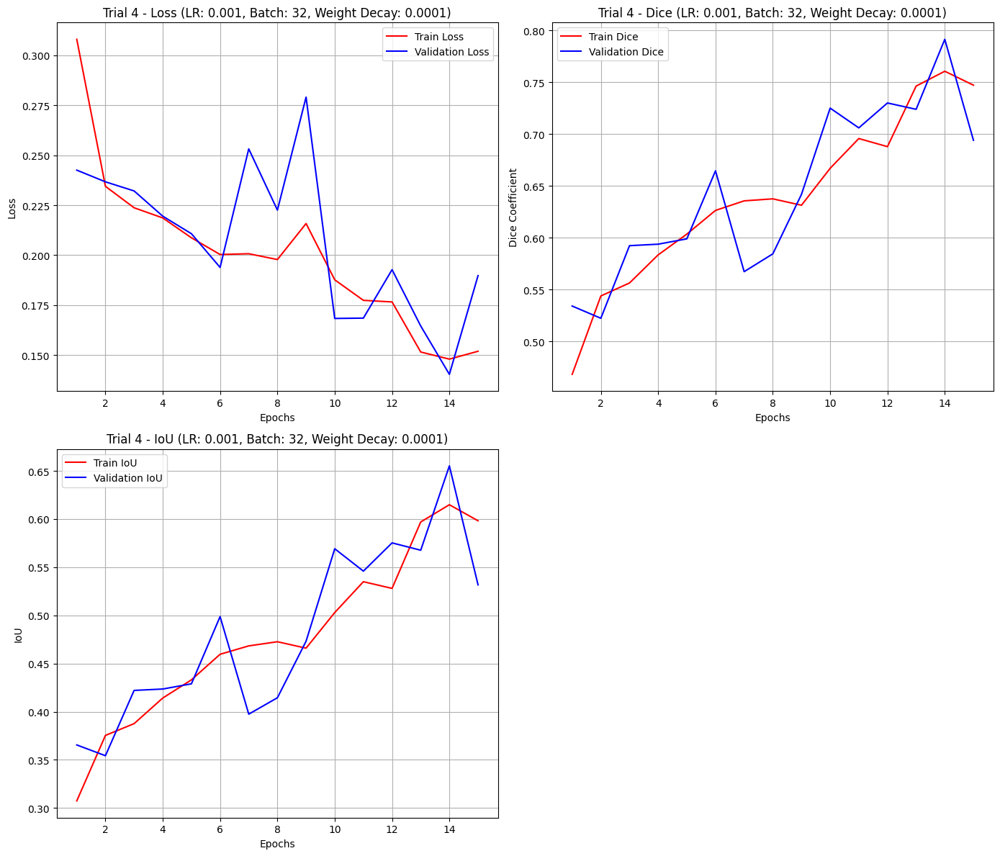

Trial 5/5 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/29 [00:04<01:53,  4.04s/batch]

Training Loss: 0.4710


Epoch 1 Training:   7%|▋         | 2/29 [00:08<01:51,  4.12s/batch]

Training Loss: 0.8362


Epoch 1 Training:  10%|█         | 3/29 [00:12<01:47,  4.12s/batch]

Training Loss: 0.4210


Epoch 1 Training:  14%|█▍        | 4/29 [00:16<01:43,  4.13s/batch]

Training Loss: 0.2430


Epoch 1 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.06s/batch]

Training Loss: 0.3684


Epoch 1 Training:  21%|██        | 6/29 [00:24<01:33,  4.08s/batch]

Training Loss: 0.3151


Epoch 1 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.06s/batch]

Training Loss: 0.2646


Epoch 1 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2636


Epoch 1 Training:  31%|███       | 9/29 [00:36<01:21,  4.05s/batch]

Training Loss: 0.2342


Epoch 1 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.10s/batch]

Training Loss: 0.2631


Epoch 1 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.2292


Epoch 1 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.08s/batch]

Training Loss: 0.2764


Epoch 1 Training:  45%|████▍     | 13/29 [00:53<01:05,  4.07s/batch]

Training Loss: 0.2131


Epoch 1 Training:  48%|████▊     | 14/29 [00:57<01:00,  4.06s/batch]

Training Loss: 0.2656


Epoch 1 Training:  52%|█████▏    | 15/29 [01:01<00:56,  4.07s/batch]

Training Loss: 0.2315


Epoch 1 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.11s/batch]

Training Loss: 0.2678


Epoch 1 Training:  59%|█████▊    | 17/29 [01:09<00:49,  4.09s/batch]

Training Loss: 0.2463


Epoch 1 Training:  62%|██████▏   | 18/29 [01:13<00:45,  4.13s/batch]

Training Loss: 0.1938


Epoch 1 Training:  66%|██████▌   | 19/29 [01:17<00:41,  4.10s/batch]

Training Loss: 0.2533


Epoch 1 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.09s/batch]

Training Loss: 0.2323


Epoch 1 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.05s/batch]

Training Loss: 0.2574


Epoch 1 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.04s/batch]

Training Loss: 0.2125


Epoch 1 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.08s/batch]

Training Loss: 0.2298


Epoch 1 Training:  83%|████████▎ | 24/29 [01:38<00:20,  4.10s/batch]

Training Loss: 0.2941


Epoch 1 Training:  86%|████████▌ | 25/29 [01:42<00:16,  4.07s/batch]

Training Loss: 0.2425


Epoch 1 Training:  90%|████████▉ | 26/29 [01:46<00:12,  4.09s/batch]

Training Loss: 0.1970


Epoch 1 Training:  93%|█████████▎| 27/29 [01:50<00:08,  4.07s/batch]

Training Loss: 0.1993


Epoch 1 Training:  97%|█████████▋| 28/29 [01:54<00:04,  4.09s/batch]

Training Loss: 0.2508


Epoch 1 Training: 100%|██████████| 29/29 [01:54<00:00,  3.96s/batch]


Training Loss: 0.1936




Epoch 1 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Validation Loss: 0.2934


Epoch 1 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.84s/batch]

Validation Loss: 0.2302


Epoch 1 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.82s/batch]

Validation Loss: 0.2597


Epoch 1 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Validation Loss: 0.2410


Epoch 1 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Validation Loss: 0.2294


Epoch 1 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Validation Loss: 0.2299


Epoch 1 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Validation Loss: 0.2140


Epoch 1 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Validation Loss: 0.2013
Epoch 1, Validation Loss: 0.2374, Validation Dice: 0.5658, Validation IoU: 0.3959




Epoch 2 Training:   3%|▎         | 1/29 [00:04<01:54,  4.08s/batch]

Training Loss: 0.2113


Epoch 2 Training:   7%|▋         | 2/29 [00:08<01:49,  4.07s/batch]

Training Loss: 0.2087


Epoch 2 Training:  10%|█         | 3/29 [00:12<01:45,  4.07s/batch]

Training Loss: 0.2336


Epoch 2 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.05s/batch]

Training Loss: 0.2581


Epoch 2 Training:  17%|█▋        | 5/29 [00:20<01:35,  4.00s/batch]

Training Loss: 0.2380


Epoch 2 Training:  21%|██        | 6/29 [00:24<01:32,  4.01s/batch]

Training Loss: 0.2105


Epoch 2 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.2368


Epoch 2 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.1856


Epoch 2 Training:  31%|███       | 9/29 [00:36<01:21,  4.08s/batch]

Training Loss: 0.2390


Epoch 2 Training:  34%|███▍      | 10/29 [00:40<01:18,  4.11s/batch]

Training Loss: 0.2081


Epoch 2 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.08s/batch]

Training Loss: 0.2306


Epoch 2 Training:  41%|████▏     | 12/29 [00:48<01:10,  4.12s/batch]

Training Loss: 0.2426


Epoch 2 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.07s/batch]

Training Loss: 0.2247


Epoch 2 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.08s/batch]

Training Loss: 0.2317


Epoch 2 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.06s/batch]

Training Loss: 0.2361


Epoch 2 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.1894


Epoch 2 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.05s/batch]

Training Loss: 0.2170


Epoch 2 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.08s/batch]

Training Loss: 0.2289


Epoch 2 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.08s/batch]

Training Loss: 0.2720


Epoch 2 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.11s/batch]

Training Loss: 0.2149


Epoch 2 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.07s/batch]

Training Loss: 0.2808


Epoch 2 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.09s/batch]

Training Loss: 0.1818


Epoch 2 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.09s/batch]

Training Loss: 0.2562


Epoch 2 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.11s/batch]

Training Loss: 0.2617


Epoch 2 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.08s/batch]

Training Loss: 0.2272


Epoch 2 Training:  90%|████████▉ | 26/29 [01:46<00:12,  4.12s/batch]

Training Loss: 0.1979


Epoch 2 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.07s/batch]

Training Loss: 0.2323


Epoch 2 Training:  97%|█████████▋| 28/29 [01:54<00:04,  4.06s/batch]

Training Loss: 0.2674


Epoch 2 Training: 100%|██████████| 29/29 [01:54<00:00,  3.95s/batch]


Training Loss: 0.2961




Epoch 2 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Validation Loss: 0.3097


Epoch 2 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.2354


Epoch 2 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2550


Epoch 2 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Validation Loss: 0.2360


Epoch 2 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Validation Loss: 0.2261


Epoch 2 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Validation Loss: 0.2096


Epoch 2 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.2003


Epoch 2 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Validation Loss: 0.1983
Epoch 2, Validation Loss: 0.2338, Validation Dice: 0.5811, Validation IoU: 0.4110




Epoch 3 Training:   3%|▎         | 1/29 [00:03<01:50,  3.95s/batch]

Training Loss: 0.2000


Epoch 3 Training:   7%|▋         | 2/29 [00:08<01:49,  4.07s/batch]

Training Loss: 0.2223


Epoch 3 Training:  10%|█         | 3/29 [00:12<01:45,  4.05s/batch]

Training Loss: 0.2227


Epoch 3 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.10s/batch]

Training Loss: 0.2162


Epoch 3 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.2331


Epoch 3 Training:  21%|██        | 6/29 [00:24<01:33,  4.08s/batch]

Training Loss: 0.2285


Epoch 3 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.2235


Epoch 3 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.06s/batch]

Training Loss: 0.2326


Epoch 3 Training:  31%|███       | 9/29 [00:36<01:21,  4.08s/batch]

Training Loss: 0.2576


Epoch 3 Training:  34%|███▍      | 10/29 [00:40<01:18,  4.13s/batch]

Training Loss: 0.2613


Epoch 3 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.10s/batch]

Training Loss: 0.1803


Epoch 3 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.10s/batch]

Training Loss: 0.2323


Epoch 3 Training:  45%|████▍     | 13/29 [00:53<01:05,  4.08s/batch]

Training Loss: 0.2155


Epoch 3 Training:  48%|████▊     | 14/29 [00:57<01:01,  4.10s/batch]

Training Loss: 0.2127


Epoch 3 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.09s/batch]

Training Loss: 0.2458


Epoch 3 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.10s/batch]

Training Loss: 0.2003


Epoch 3 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.04s/batch]

Training Loss: 0.1931


Epoch 3 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.08s/batch]

Training Loss: 0.2385


Epoch 3 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.07s/batch]

Training Loss: 0.2558


Epoch 3 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.09s/batch]

Training Loss: 0.2488


Epoch 3 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.07s/batch]

Training Loss: 0.2965


Epoch 3 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.07s/batch]

Training Loss: 0.2680


Epoch 3 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.05s/batch]

Training Loss: 0.2582


Epoch 3 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.08s/batch]

Training Loss: 0.2376


Epoch 3 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.06s/batch]

Training Loss: 0.2449


Epoch 3 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.2428


Epoch 3 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.06s/batch]

Training Loss: 0.1976


Epoch 3 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.04s/batch]

Training Loss: 0.1929


Epoch 3 Training: 100%|██████████| 29/29 [01:54<00:00,  3.95s/batch]


Training Loss: 0.2817




Epoch 3 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.78s/batch]

Validation Loss: 0.2846


Epoch 3 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.84s/batch]

Validation Loss: 0.2262


Epoch 3 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2508


Epoch 3 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Validation Loss: 0.2302


Epoch 3 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.79s/batch]

Validation Loss: 0.2146


Epoch 3 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.2128


Epoch 3 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.78s/batch]

Validation Loss: 0.2075


Epoch 3 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Validation Loss: 0.1945
Epoch 3, Validation Loss: 0.2276, Validation Dice: 0.5510, Validation IoU: 0.3817




Epoch 4 Training:   3%|▎         | 1/29 [00:04<01:53,  4.05s/batch]

Training Loss: 0.2182


Epoch 4 Training:   7%|▋         | 2/29 [00:08<01:49,  4.05s/batch]

Training Loss: 0.2521


Epoch 4 Training:  10%|█         | 3/29 [00:12<01:45,  4.04s/batch]

Training Loss: 0.2128


Epoch 4 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.08s/batch]

Training Loss: 0.2656


Epoch 4 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.08s/batch]

Training Loss: 0.2295


Epoch 4 Training:  21%|██        | 6/29 [00:24<01:34,  4.10s/batch]

Training Loss: 0.1707


Epoch 4 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.07s/batch]

Training Loss: 0.2429


Epoch 4 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2968


Epoch 4 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.2227


Epoch 4 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.10s/batch]

Training Loss: 0.2549


Epoch 4 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.10s/batch]

Training Loss: 0.2287


Epoch 4 Training:  41%|████▏     | 12/29 [00:49<01:09,  4.12s/batch]

Training Loss: 0.1880


Epoch 4 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.08s/batch]

Training Loss: 0.2004


Epoch 4 Training:  48%|████▊     | 14/29 [00:57<01:01,  4.09s/batch]

Training Loss: 0.2054


Epoch 4 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.09s/batch]

Training Loss: 0.2286


Epoch 4 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.10s/batch]

Training Loss: 0.1960


Epoch 4 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.07s/batch]

Training Loss: 0.2061


Epoch 4 Training:  62%|██████▏   | 18/29 [01:13<00:45,  4.10s/batch]

Training Loss: 0.2120


Epoch 4 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.05s/batch]

Training Loss: 0.2291


Epoch 4 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.08s/batch]

Training Loss: 0.2202


Epoch 4 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.08s/batch]

Training Loss: 0.1977


Epoch 4 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.09s/batch]

Training Loss: 0.1810


Epoch 4 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.04s/batch]

Training Loss: 0.1917


Epoch 4 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.2255


Epoch 4 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.2279


Epoch 4 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.2284


Epoch 4 Training:  93%|█████████▎| 27/29 [01:50<00:08,  4.08s/batch]

Training Loss: 0.2387


Epoch 4 Training:  97%|█████████▋| 28/29 [01:54<00:04,  4.10s/batch]

Training Loss: 0.2408


Epoch 4 Training: 100%|██████████| 29/29 [01:54<00:00,  3.96s/batch]


Training Loss: 0.2389




Epoch 4 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Validation Loss: 0.2814


Epoch 4 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.2301


Epoch 4 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2435


Epoch 4 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Validation Loss: 0.2223


Epoch 4 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Validation Loss: 0.2084


Epoch 4 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Validation Loss: 0.2118


Epoch 4 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.1990


Epoch 4 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Validation Loss: 0.1928
Epoch 4, Validation Loss: 0.2237, Validation Dice: 0.5878, Validation IoU: 0.4178




Epoch 5 Training:   3%|▎         | 1/29 [00:04<01:53,  4.04s/batch]

Training Loss: 0.2560


Epoch 5 Training:   7%|▋         | 2/29 [00:08<01:50,  4.09s/batch]

Training Loss: 0.2444


Epoch 5 Training:  10%|█         | 3/29 [00:12<01:44,  4.04s/batch]

Training Loss: 0.1736


Epoch 5 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.08s/batch]

Training Loss: 0.2475


Epoch 5 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.05s/batch]

Training Loss: 0.1878


Epoch 5 Training:  21%|██        | 6/29 [00:24<01:33,  4.05s/batch]

Training Loss: 0.1945


Epoch 5 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.07s/batch]

Training Loss: 0.2184


Epoch 5 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.08s/batch]

Training Loss: 0.3329


Epoch 5 Training:  31%|███       | 9/29 [00:36<01:21,  4.10s/batch]

Training Loss: 0.2459


Epoch 5 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.10s/batch]

Training Loss: 0.2089


Epoch 5 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.08s/batch]

Training Loss: 0.2551


Epoch 5 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.08s/batch]

Training Loss: 0.2634


Epoch 5 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.07s/batch]

Training Loss: 0.2477


Epoch 5 Training:  48%|████▊     | 14/29 [00:57<01:01,  4.09s/batch]

Training Loss: 0.2063


Epoch 5 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.08s/batch]

Training Loss: 0.1817


Epoch 5 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.08s/batch]

Training Loss: 0.2236


Epoch 5 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.06s/batch]

Training Loss: 0.2317


Epoch 5 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.07s/batch]

Training Loss: 0.1858


Epoch 5 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.06s/batch]

Training Loss: 0.3030


Epoch 5 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.06s/batch]

Training Loss: 0.2119


Epoch 5 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.07s/batch]

Training Loss: 0.2161


Epoch 5 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.10s/batch]

Training Loss: 0.2466


Epoch 5 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.07s/batch]

Training Loss: 0.2015


Epoch 5 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.12s/batch]

Training Loss: 0.2126


Epoch 5 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.09s/batch]

Training Loss: 0.1609


Epoch 5 Training:  90%|████████▉ | 26/29 [01:46<00:12,  4.11s/batch]

Training Loss: 0.2486


Epoch 5 Training:  93%|█████████▎| 27/29 [01:50<00:08,  4.06s/batch]

Training Loss: 0.2608


Epoch 5 Training:  97%|█████████▋| 28/29 [01:54<00:04,  4.08s/batch]

Training Loss: 0.2025


Epoch 5 Training: 100%|██████████| 29/29 [01:54<00:00,  3.95s/batch]


Training Loss: 0.1998




Epoch 5 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.76s/batch]

Validation Loss: 0.2844


Epoch 5 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.2259


Epoch 5 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.2435


Epoch 5 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Validation Loss: 0.2221


Epoch 5 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.2104


Epoch 5 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Validation Loss: 0.2099


Epoch 5 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Validation Loss: 0.1963


Epoch 5 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.76s/batch]


Validation Loss: 0.1885
Epoch 5, Validation Loss: 0.2226, Validation Dice: 0.5993, Validation IoU: 0.4293




Epoch 6 Training:   3%|▎         | 1/29 [00:03<01:51,  4.00s/batch]

Training Loss: 0.1933


Epoch 6 Training:   7%|▋         | 2/29 [00:08<01:48,  4.02s/batch]

Training Loss: 0.2228


Epoch 6 Training:  10%|█         | 3/29 [00:12<01:44,  4.03s/batch]

Training Loss: 0.2453


Epoch 6 Training:  14%|█▍        | 4/29 [00:16<01:43,  4.12s/batch]

Training Loss: 0.1807


Epoch 6 Training:  17%|█▋        | 5/29 [00:20<01:38,  4.09s/batch]

Training Loss: 0.2363


Epoch 6 Training:  21%|██        | 6/29 [00:24<01:33,  4.08s/batch]

Training Loss: 0.2317


Epoch 6 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.1926


Epoch 6 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.06s/batch]

Training Loss: 0.2387


Epoch 6 Training:  31%|███       | 9/29 [00:36<01:21,  4.06s/batch]

Training Loss: 0.2635


Epoch 6 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.08s/batch]

Training Loss: 0.1971


Epoch 6 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.08s/batch]

Training Loss: 0.1858


Epoch 6 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.10s/batch]

Training Loss: 0.2129


Epoch 6 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.05s/batch]

Training Loss: 0.2452


Epoch 6 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.06s/batch]

Training Loss: 0.2176


Epoch 6 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.04s/batch]

Training Loss: 0.2293


Epoch 6 Training:  55%|█████▌    | 16/29 [01:05<00:52,  4.08s/batch]

Training Loss: 0.2509


Epoch 6 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.07s/batch]

Training Loss: 0.2099


Epoch 6 Training:  62%|██████▏   | 18/29 [01:13<00:45,  4.11s/batch]

Training Loss: 0.2271


Epoch 6 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.05s/batch]

Training Loss: 0.2361


Epoch 6 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.10s/batch]

Training Loss: 0.2258


Epoch 6 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.09s/batch]

Training Loss: 0.2141


Epoch 6 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.09s/batch]

Training Loss: 0.1961


Epoch 6 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.05s/batch]

Training Loss: 0.1583


Epoch 6 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.08s/batch]

Training Loss: 0.2912


Epoch 6 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.05s/batch]

Training Loss: 0.2010


Epoch 6 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.03s/batch]

Training Loss: 0.1923


Epoch 6 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.01s/batch]

Training Loss: 0.1782


Epoch 6 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.06s/batch]

Training Loss: 0.1789


Epoch 6 Training: 100%|██████████| 29/29 [01:54<00:00,  3.94s/batch]


Training Loss: 0.2345




Epoch 6 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.79s/batch]

Validation Loss: 0.2987


Epoch 6 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.83s/batch]

Validation Loss: 0.2332


Epoch 6 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Validation Loss: 0.2463


Epoch 6 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.82s/batch]

Validation Loss: 0.2248


Epoch 6 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.78s/batch]

Validation Loss: 0.2111


Epoch 6 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.2004


Epoch 6 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.78s/batch]

Validation Loss: 0.1980


Epoch 6 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Validation Loss: 0.1951
Epoch 6, Validation Loss: 0.2259, Validation Dice: 0.5760, Validation IoU: 0.4059




Epoch 7 Training:   3%|▎         | 1/29 [00:04<01:52,  4.02s/batch]

Training Loss: 0.1927


Epoch 7 Training:   7%|▋         | 2/29 [00:08<01:52,  4.16s/batch]

Training Loss: 0.2316


Epoch 7 Training:  10%|█         | 3/29 [00:12<01:47,  4.12s/batch]

Training Loss: 0.2453


Epoch 7 Training:  14%|█▍        | 4/29 [00:16<01:43,  4.14s/batch]

Training Loss: 0.2599


Epoch 7 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.07s/batch]

Training Loss: 0.1780


Epoch 7 Training:  21%|██        | 6/29 [00:24<01:33,  4.08s/batch]

Training Loss: 0.1863


Epoch 7 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.2127


Epoch 7 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2174


Epoch 7 Training:  31%|███       | 9/29 [00:36<01:21,  4.05s/batch]

Training Loss: 0.2044


Epoch 7 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.05s/batch]

Training Loss: 0.2070


Epoch 7 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.2514


Epoch 7 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.08s/batch]

Training Loss: 0.2527


Epoch 7 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.07s/batch]

Training Loss: 0.2683


Epoch 7 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.2704


Epoch 7 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.02s/batch]

Training Loss: 0.2500


Epoch 7 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.2118


Epoch 7 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.2056


Epoch 7 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.06s/batch]

Training Loss: 0.1872


Epoch 7 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.04s/batch]

Training Loss: 0.1834


Epoch 7 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.05s/batch]

Training Loss: 0.2326


Epoch 7 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.03s/batch]

Training Loss: 0.2113


Epoch 7 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.07s/batch]

Training Loss: 0.2017


Epoch 7 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.05s/batch]

Training Loss: 0.2049


Epoch 7 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.1930


Epoch 7 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.06s/batch]

Training Loss: 0.2002


Epoch 7 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.10s/batch]

Training Loss: 0.2351


Epoch 7 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.11s/batch]

Training Loss: 0.1924


Epoch 7 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.09s/batch]

Training Loss: 0.1865


Epoch 7 Training: 100%|██████████| 29/29 [01:54<00:00,  3.94s/batch]


Training Loss: 0.2054




Epoch 7 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.2830


Epoch 7 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.86s/batch]

Validation Loss: 0.2288


Epoch 7 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.83s/batch]

Validation Loss: 0.2449


Epoch 7 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.82s/batch]

Validation Loss: 0.2227


Epoch 7 Validation:  62%|██████▎   | 5/8 [00:19<00:11,  3.79s/batch]

Validation Loss: 0.2113


Epoch 7 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.2312


Epoch 7 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.78s/batch]

Validation Loss: 0.1973


Epoch 7 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Validation Loss: 0.1887
Epoch 7, Validation Loss: 0.2260, Validation Dice: 0.6410, Validation IoU: 0.4733




Epoch 8 Training:   3%|▎         | 1/29 [00:04<01:52,  4.01s/batch]

Training Loss: 0.2444


Epoch 8 Training:   7%|▋         | 2/29 [00:08<01:50,  4.10s/batch]

Training Loss: 0.2074


Epoch 8 Training:  10%|█         | 3/29 [00:12<01:46,  4.09s/batch]

Training Loss: 0.2791


Epoch 8 Training:  14%|█▍        | 4/29 [00:16<01:43,  4.13s/batch]

Training Loss: 0.2098


Epoch 8 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.08s/batch]

Training Loss: 0.2162


Epoch 8 Training:  21%|██        | 6/29 [00:24<01:34,  4.12s/batch]

Training Loss: 0.2267


Epoch 8 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.2315


Epoch 8 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.08s/batch]

Training Loss: 0.2141


Epoch 8 Training:  31%|███       | 9/29 [00:36<01:21,  4.06s/batch]

Training Loss: 0.2349


Epoch 8 Training:  34%|███▍      | 10/29 [00:40<01:18,  4.11s/batch]

Training Loss: 0.2545


Epoch 8 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.07s/batch]

Training Loss: 0.2384


Epoch 8 Training:  41%|████▏     | 12/29 [00:49<01:09,  4.11s/batch]

Training Loss: 0.2320


Epoch 8 Training:  45%|████▍     | 13/29 [00:53<01:04,  4.06s/batch]

Training Loss: 0.2012


Epoch 8 Training:  48%|████▊     | 14/29 [00:57<01:01,  4.10s/batch]

Training Loss: 0.2089


Epoch 8 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.08s/batch]

Training Loss: 0.2197


Epoch 8 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.12s/batch]

Training Loss: 0.2448


Epoch 8 Training:  59%|█████▊    | 17/29 [01:09<00:49,  4.08s/batch]

Training Loss: 0.2204


Epoch 8 Training:  62%|██████▏   | 18/29 [01:13<00:45,  4.10s/batch]

Training Loss: 0.2002


Epoch 8 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.08s/batch]

Training Loss: 0.1498


Epoch 8 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.08s/batch]

Training Loss: 0.2369


Epoch 8 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.10s/batch]

Training Loss: 0.2212


Epoch 8 Training:  76%|███████▌  | 22/29 [01:30<00:28,  4.11s/batch]

Training Loss: 0.1983


Epoch 8 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.05s/batch]

Training Loss: 0.2108


Epoch 8 Training:  83%|████████▎ | 24/29 [01:38<00:20,  4.07s/batch]

Training Loss: 0.2261


Epoch 8 Training:  86%|████████▌ | 25/29 [01:42<00:16,  4.05s/batch]

Training Loss: 0.2338


Epoch 8 Training:  90%|████████▉ | 26/29 [01:46<00:12,  4.07s/batch]

Training Loss: 0.2067


Epoch 8 Training:  93%|█████████▎| 27/29 [01:50<00:08,  4.03s/batch]

Training Loss: 0.2535


Epoch 8 Training:  97%|█████████▋| 28/29 [01:54<00:04,  4.04s/batch]

Training Loss: 0.2142


Epoch 8 Training: 100%|██████████| 29/29 [01:54<00:00,  3.95s/batch]


Training Loss: 0.2101




Epoch 8 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.79s/batch]

Validation Loss: 0.2775


Epoch 8 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.2194


Epoch 8 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2377


Epoch 8 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.2206


Epoch 8 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Validation Loss: 0.2079


Epoch 8 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Validation Loss: 0.2078


Epoch 8 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.1948


Epoch 8 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Validation Loss: 0.1885
Epoch 8, Validation Loss: 0.2193, Validation Dice: 0.5965, Validation IoU: 0.4262




Epoch 9 Training:   3%|▎         | 1/29 [00:04<01:53,  4.05s/batch]

Training Loss: 0.1955


Epoch 9 Training:   7%|▋         | 2/29 [00:08<01:51,  4.15s/batch]

Training Loss: 0.2335


Epoch 9 Training:  10%|█         | 3/29 [00:12<01:45,  4.07s/batch]

Training Loss: 0.2372


Epoch 9 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.08s/batch]

Training Loss: 0.2224


Epoch 9 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.03s/batch]

Training Loss: 0.2379


Epoch 9 Training:  21%|██        | 6/29 [00:24<01:33,  4.07s/batch]

Training Loss: 0.2398


Epoch 9 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.07s/batch]

Training Loss: 0.2276


Epoch 9 Training:  28%|██▊       | 8/29 [00:32<01:26,  4.10s/batch]

Training Loss: 0.1944


Epoch 9 Training:  31%|███       | 9/29 [00:36<01:21,  4.08s/batch]

Training Loss: 0.2240


Epoch 9 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.08s/batch]

Training Loss: 0.1895


Epoch 9 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.2300


Epoch 9 Training:  41%|████▏     | 12/29 [00:49<01:09,  4.11s/batch]

Training Loss: 0.2047


Epoch 9 Training:  45%|████▍     | 13/29 [00:53<01:05,  4.08s/batch]

Training Loss: 0.1915


Epoch 9 Training:  48%|████▊     | 14/29 [00:57<01:00,  4.06s/batch]

Training Loss: 0.2478


Epoch 9 Training:  52%|█████▏    | 15/29 [01:01<00:56,  4.06s/batch]

Training Loss: 0.1964


Epoch 9 Training:  55%|█████▌    | 16/29 [01:05<00:53,  4.08s/batch]

Training Loss: 0.2132


Epoch 9 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.05s/batch]

Training Loss: 0.2182


Epoch 9 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.08s/batch]

Training Loss: 0.2272


Epoch 9 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.05s/batch]

Training Loss: 0.1862


Epoch 9 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.08s/batch]

Training Loss: 0.2036


Epoch 9 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.07s/batch]

Training Loss: 0.1982


Epoch 9 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.07s/batch]

Training Loss: 0.2387


Epoch 9 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.06s/batch]

Training Loss: 0.2210


Epoch 9 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.07s/batch]

Training Loss: 0.2098


Epoch 9 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.1764


Epoch 9 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.2724


Epoch 9 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.06s/batch]

Training Loss: 0.1815


Epoch 9 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.05s/batch]

Training Loss: 0.2169


Epoch 9 Training: 100%|██████████| 29/29 [01:54<00:00,  3.95s/batch]


Training Loss: 0.2742




Epoch 9 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Validation Loss: 0.2909


Epoch 9 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.88s/batch]

Validation Loss: 0.2275


Epoch 9 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.84s/batch]

Validation Loss: 0.2390


Epoch 9 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.83s/batch]

Validation Loss: 0.2189


Epoch 9 Validation:  62%|██████▎   | 5/8 [00:19<00:11,  3.79s/batch]

Validation Loss: 0.2053


Epoch 9 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.1957


Epoch 9 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.79s/batch]

Validation Loss: 0.1902


Epoch 9 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.81s/batch]


Validation Loss: 0.1915
Epoch 9, Validation Loss: 0.2199, Validation Dice: 0.5958, Validation IoU: 0.4260




Epoch 10 Training:   3%|▎         | 1/29 [00:03<01:50,  3.93s/batch]

Training Loss: 0.2309


Epoch 10 Training:   7%|▋         | 2/29 [00:08<01:50,  4.09s/batch]

Training Loss: 0.1949


Epoch 10 Training:  10%|█         | 3/29 [00:12<01:45,  4.05s/batch]

Training Loss: 0.1873


Epoch 10 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.07s/batch]

Training Loss: 0.2246


Epoch 10 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.06s/batch]

Training Loss: 0.2308


Epoch 10 Training:  21%|██        | 6/29 [00:24<01:34,  4.12s/batch]

Training Loss: 0.3005


Epoch 10 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.2077


Epoch 10 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.06s/batch]

Training Loss: 0.2135


Epoch 10 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.1799


Epoch 10 Training:  34%|███▍      | 10/29 [00:40<01:18,  4.11s/batch]

Training Loss: 0.2070


Epoch 10 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.05s/batch]

Training Loss: 0.1868


Epoch 10 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.06s/batch]

Training Loss: 0.2090


Epoch 10 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.05s/batch]

Training Loss: 0.1360


Epoch 10 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.07s/batch]

Training Loss: 0.2126


Epoch 10 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.09s/batch]

Training Loss: 0.2071


Epoch 10 Training:  55%|█████▌    | 16/29 [01:05<00:52,  4.08s/batch]

Training Loss: 0.2160


Epoch 10 Training:  59%|█████▊    | 17/29 [01:09<00:48,  4.05s/batch]

Training Loss: 0.1850


Epoch 10 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.07s/batch]

Training Loss: 0.2205


Epoch 10 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.06s/batch]

Training Loss: 0.2252


Epoch 10 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.08s/batch]

Training Loss: 0.1969


Epoch 10 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.05s/batch]

Training Loss: 0.1863


Epoch 10 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.05s/batch]

Training Loss: 0.1946


Epoch 10 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.06s/batch]

Training Loss: 0.2633


Epoch 10 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.07s/batch]

Training Loss: 0.2271


Epoch 10 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.10s/batch]

Training Loss: 0.2218


Epoch 10 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.07s/batch]

Training Loss: 0.2034


Epoch 10 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.01s/batch]

Training Loss: 0.1584


Epoch 10 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.08s/batch]

Training Loss: 0.2276


Epoch 10 Training: 100%|██████████| 29/29 [01:54<00:00,  3.94s/batch]


Training Loss: 0.1152




Epoch 10 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.79s/batch]

Validation Loss: 0.2808


Epoch 10 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.2225


Epoch 10 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.82s/batch]

Validation Loss: 0.2297


Epoch 10 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Validation Loss: 0.2051


Epoch 10 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.76s/batch]

Validation Loss: 0.1971


Epoch 10 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Validation Loss: 0.1872


Epoch 10 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.1735


Epoch 10 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Validation Loss: 0.1863
Epoch 10, Validation Loss: 0.2103, Validation Dice: 0.6229, Validation IoU: 0.4541




Epoch 11 Training:   3%|▎         | 1/29 [00:03<01:48,  3.86s/batch]

Training Loss: 0.2070


Epoch 11 Training:   7%|▋         | 2/29 [00:07<01:47,  3.98s/batch]

Training Loss: 0.1770


Epoch 11 Training:  10%|█         | 3/29 [00:11<01:43,  3.99s/batch]

Training Loss: 0.2268


Epoch 11 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.02s/batch]

Training Loss: 0.1956


Epoch 11 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.03s/batch]

Training Loss: 0.2039


Epoch 11 Training:  21%|██        | 6/29 [00:24<01:32,  4.03s/batch]

Training Loss: 0.1909


Epoch 11 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.1893


Epoch 11 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.04s/batch]

Training Loss: 0.2224


Epoch 11 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.1920


Epoch 11 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.07s/batch]

Training Loss: 0.2284


Epoch 11 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.2053


Epoch 11 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.08s/batch]

Training Loss: 0.2200


Epoch 11 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.02s/batch]

Training Loss: 0.2188


Epoch 11 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.07s/batch]

Training Loss: 0.2163


Epoch 11 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.06s/batch]

Training Loss: 0.1934


Epoch 11 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.03s/batch]

Training Loss: 0.1814


Epoch 11 Training:  59%|█████▊    | 17/29 [01:08<00:47,  4.00s/batch]

Training Loss: 0.2513


Epoch 11 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.04s/batch]

Training Loss: 0.2095


Epoch 11 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.02s/batch]

Training Loss: 0.2007


Epoch 11 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.08s/batch]

Training Loss: 0.2190


Epoch 11 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.05s/batch]

Training Loss: 0.1872


Epoch 11 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.07s/batch]

Training Loss: 0.1569


Epoch 11 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.04s/batch]

Training Loss: 0.2356


Epoch 11 Training:  83%|████████▎ | 24/29 [01:36<00:20,  4.06s/batch]

Training Loss: 0.1730


Epoch 11 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.07s/batch]

Training Loss: 0.1850


Epoch 11 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.09s/batch]

Training Loss: 0.1832


Epoch 11 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.09s/batch]

Training Loss: 0.2589


Epoch 11 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.11s/batch]

Training Loss: 0.1853


Epoch 11 Training: 100%|██████████| 29/29 [01:53<00:00,  3.93s/batch]


Training Loss: 0.2140




Epoch 11 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.2547


Epoch 11 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Validation Loss: 0.2170


Epoch 11 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2292


Epoch 11 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.2019


Epoch 11 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.76s/batch]

Validation Loss: 0.1882


Epoch 11 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Validation Loss: 0.2003


Epoch 11 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Validation Loss: 0.1872


Epoch 11 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Validation Loss: 0.1740
Epoch 11, Validation Loss: 0.2066, Validation Dice: 0.6589, Validation IoU: 0.4922




Epoch 12 Training:   3%|▎         | 1/29 [00:04<01:52,  4.02s/batch]

Training Loss: 0.1619


Epoch 12 Training:   7%|▋         | 2/29 [00:08<01:50,  4.09s/batch]

Training Loss: 0.2117


Epoch 12 Training:  10%|█         | 3/29 [00:12<01:44,  4.01s/batch]

Training Loss: 0.1829


Epoch 12 Training:  14%|█▍        | 4/29 [00:16<01:42,  4.08s/batch]

Training Loss: 0.2277


Epoch 12 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.08s/batch]

Training Loss: 0.2010


Epoch 12 Training:  21%|██        | 6/29 [00:24<01:33,  4.07s/batch]

Training Loss: 0.2723


Epoch 12 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.2504


Epoch 12 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2439


Epoch 12 Training:  31%|███       | 9/29 [00:36<01:20,  4.02s/batch]

Training Loss: 0.2815


Epoch 12 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.05s/batch]

Training Loss: 0.1726


Epoch 12 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.03s/batch]

Training Loss: 0.2214


Epoch 12 Training:  41%|████▏     | 12/29 [00:48<01:09,  4.08s/batch]

Training Loss: 0.2409


Epoch 12 Training:  45%|████▍     | 13/29 [00:52<01:05,  4.09s/batch]

Training Loss: 0.2653


Epoch 12 Training:  48%|████▊     | 14/29 [00:57<01:01,  4.13s/batch]

Training Loss: 0.1942


Epoch 12 Training:  52%|█████▏    | 15/29 [01:01<00:57,  4.07s/batch]

Training Loss: 0.2381


Epoch 12 Training:  55%|█████▌    | 16/29 [01:05<00:52,  4.06s/batch]

Training Loss: 0.1995


Epoch 12 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.02s/batch]

Training Loss: 0.2227


Epoch 12 Training:  62%|██████▏   | 18/29 [01:13<00:44,  4.04s/batch]

Training Loss: 0.2249


Epoch 12 Training:  66%|██████▌   | 19/29 [01:17<00:40,  4.04s/batch]

Training Loss: 0.2335


Epoch 12 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.05s/batch]

Training Loss: 0.2121


Epoch 12 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.01s/batch]

Training Loss: 0.2154


Epoch 12 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.03s/batch]

Training Loss: 0.2089


Epoch 12 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.04s/batch]

Training Loss: 0.2340


Epoch 12 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.08s/batch]

Training Loss: 0.1576


Epoch 12 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.04s/batch]

Training Loss: 0.2059


Epoch 12 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.04s/batch]

Training Loss: 0.1990


Epoch 12 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.06s/batch]

Training Loss: 0.1986


Epoch 12 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.09s/batch]

Training Loss: 0.2420


Epoch 12 Training: 100%|██████████| 29/29 [01:54<00:00,  3.94s/batch]


Training Loss: 0.1468




Epoch 12 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.74s/batch]

Validation Loss: 0.2665


Epoch 12 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.84s/batch]

Validation Loss: 0.2172


Epoch 12 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Validation Loss: 0.2388


Epoch 12 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.2166


Epoch 12 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Validation Loss: 0.2023


Epoch 12 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Validation Loss: 0.2223


Epoch 12 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Validation Loss: 0.2001


Epoch 12 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Validation Loss: 0.1841
Epoch 12, Validation Loss: 0.2185, Validation Dice: 0.6620, Validation IoU: 0.4959




Epoch 13 Training:   3%|▎         | 1/29 [00:04<01:52,  4.01s/batch]

Training Loss: 0.1639


Epoch 13 Training:   7%|▋         | 2/29 [00:08<01:50,  4.10s/batch]

Training Loss: 0.2470


Epoch 13 Training:  10%|█         | 3/29 [00:12<01:44,  4.03s/batch]

Training Loss: 0.1948


Epoch 13 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.05s/batch]

Training Loss: 0.1884


Epoch 13 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.2195


Epoch 13 Training:  21%|██        | 6/29 [00:24<01:33,  4.05s/batch]

Training Loss: 0.1580


Epoch 13 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.02s/batch]

Training Loss: 0.2096


Epoch 13 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.03s/batch]

Training Loss: 0.2114


Epoch 13 Training:  31%|███       | 9/29 [00:36<01:20,  4.03s/batch]

Training Loss: 0.1908


Epoch 13 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.07s/batch]

Training Loss: 0.1708


Epoch 13 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.05s/batch]

Training Loss: 0.2328


Epoch 13 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.05s/batch]

Training Loss: 0.2093


Epoch 13 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.05s/batch]

Training Loss: 0.2697


Epoch 13 Training:  48%|████▊     | 14/29 [00:56<01:01,  4.07s/batch]

Training Loss: 0.1672


Epoch 13 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.05s/batch]

Training Loss: 0.1778


Epoch 13 Training:  55%|█████▌    | 16/29 [01:04<00:53,  4.08s/batch]

Training Loss: 0.2385


Epoch 13 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.05s/batch]

Training Loss: 0.2091


Epoch 13 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.06s/batch]

Training Loss: 0.2034


Epoch 13 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.05s/batch]

Training Loss: 0.1761


Epoch 13 Training:  69%|██████▉   | 20/29 [01:21<00:36,  4.09s/batch]

Training Loss: 0.2004


Epoch 13 Training:  72%|███████▏  | 21/29 [01:25<00:32,  4.07s/batch]

Training Loss: 0.2277


Epoch 13 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.08s/batch]

Training Loss: 0.1924


Epoch 13 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.06s/batch]

Training Loss: 0.1820


Epoch 13 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.07s/batch]

Training Loss: 0.1669


Epoch 13 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.07s/batch]

Training Loss: 0.1947


Epoch 13 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.10s/batch]

Training Loss: 0.2492


Epoch 13 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.05s/batch]

Training Loss: 0.2011


Epoch 13 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.07s/batch]

Training Loss: 0.2302


Epoch 13 Training: 100%|██████████| 29/29 [01:54<00:00,  3.94s/batch]


Training Loss: 0.2767




Epoch 13 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.2986


Epoch 13 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.2548


Epoch 13 Validation:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Validation Loss: 0.2820


Epoch 13 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.2666


Epoch 13 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.74s/batch]

Validation Loss: 0.2451


Epoch 13 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Validation Loss: 0.2842


Epoch 13 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Validation Loss: 0.2527


Epoch 13 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Validation Loss: 0.2270
Epoch 13, Validation Loss: 0.2639, Validation Dice: 0.6263, Validation IoU: 0.4566




Epoch 14 Training:   3%|▎         | 1/29 [00:03<01:51,  3.99s/batch]

Training Loss: 0.2339


Epoch 14 Training:   7%|▋         | 2/29 [00:08<01:49,  4.04s/batch]

Training Loss: 0.2258


Epoch 14 Training:  10%|█         | 3/29 [00:12<01:45,  4.05s/batch]

Training Loss: 0.2190


Epoch 14 Training:  14%|█▍        | 4/29 [00:16<01:41,  4.07s/batch]

Training Loss: 0.2146


Epoch 14 Training:  17%|█▋        | 5/29 [00:20<01:37,  4.06s/batch]

Training Loss: 0.2273


Epoch 14 Training:  21%|██        | 6/29 [00:24<01:33,  4.06s/batch]

Training Loss: 0.2192


Epoch 14 Training:  24%|██▍       | 7/29 [00:28<01:28,  4.01s/batch]

Training Loss: 0.2147


Epoch 14 Training:  28%|██▊       | 8/29 [00:32<01:24,  4.03s/batch]

Training Loss: 0.2066


Epoch 14 Training:  31%|███       | 9/29 [00:36<01:20,  4.01s/batch]

Training Loss: 0.1969


Epoch 14 Training:  34%|███▍      | 10/29 [00:40<01:16,  4.03s/batch]

Training Loss: 0.2844


Epoch 14 Training:  38%|███▊      | 11/29 [00:44<01:12,  4.01s/batch]

Training Loss: 0.2640


Epoch 14 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.04s/batch]

Training Loss: 0.1781


Epoch 14 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.02s/batch]

Training Loss: 0.2120


Epoch 14 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.06s/batch]

Training Loss: 0.2156


Epoch 14 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.00s/batch]

Training Loss: 0.1907


Epoch 14 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.05s/batch]

Training Loss: 0.2042


Epoch 14 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.1655


Epoch 14 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.03s/batch]

Training Loss: 0.1633


Epoch 14 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.05s/batch]

Training Loss: 0.1763


Epoch 14 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.07s/batch]

Training Loss: 0.1935


Epoch 14 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.07s/batch]

Training Loss: 0.2198


Epoch 14 Training:  76%|███████▌  | 22/29 [01:29<00:28,  4.10s/batch]

Training Loss: 0.1482


Epoch 14 Training:  79%|███████▉  | 23/29 [01:33<00:24,  4.07s/batch]

Training Loss: 0.2109


Epoch 14 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.09s/batch]

Training Loss: 0.1825


Epoch 14 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.06s/batch]

Training Loss: 0.1785


Epoch 14 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.08s/batch]

Training Loss: 0.1872


Epoch 14 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.06s/batch]

Training Loss: 0.1995


Epoch 14 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.08s/batch]

Training Loss: 0.2058


Epoch 14 Training: 100%|██████████| 29/29 [01:53<00:00,  3.93s/batch]


Training Loss: 0.2735




Epoch 14 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Validation Loss: 0.2388


Epoch 14 Validation:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Validation Loss: 0.2045


Epoch 14 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Validation Loss: 0.2174


Epoch 14 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Validation Loss: 0.1973


Epoch 14 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Validation Loss: 0.1800


Epoch 14 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.2062


Epoch 14 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Validation Loss: 0.1826


Epoch 14 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Validation Loss: 0.1735
Epoch 14, Validation Loss: 0.2000, Validation Dice: 0.6863, Validation IoU: 0.5233




Epoch 15 Training:   3%|▎         | 1/29 [00:04<01:54,  4.08s/batch]

Training Loss: 0.1919


Epoch 15 Training:   7%|▋         | 2/29 [00:08<01:48,  4.03s/batch]

Training Loss: 0.2026


Epoch 15 Training:  10%|█         | 3/29 [00:12<01:43,  4.00s/batch]

Training Loss: 0.2202


Epoch 15 Training:  14%|█▍        | 4/29 [00:16<01:40,  4.01s/batch]

Training Loss: 0.1790


Epoch 15 Training:  17%|█▋        | 5/29 [00:20<01:36,  4.01s/batch]

Training Loss: 0.1791


Epoch 15 Training:  21%|██        | 6/29 [00:24<01:32,  4.04s/batch]

Training Loss: 0.1393


Epoch 15 Training:  24%|██▍       | 7/29 [00:28<01:29,  4.05s/batch]

Training Loss: 0.1827


Epoch 15 Training:  28%|██▊       | 8/29 [00:32<01:25,  4.07s/batch]

Training Loss: 0.2334


Epoch 15 Training:  31%|███       | 9/29 [00:36<01:20,  4.04s/batch]

Training Loss: 0.1622


Epoch 15 Training:  34%|███▍      | 10/29 [00:40<01:17,  4.07s/batch]

Training Loss: 0.2125


Epoch 15 Training:  38%|███▊      | 11/29 [00:44<01:13,  4.06s/batch]

Training Loss: 0.2045


Epoch 15 Training:  41%|████▏     | 12/29 [00:48<01:08,  4.06s/batch]

Training Loss: 0.1920


Epoch 15 Training:  45%|████▍     | 13/29 [00:52<01:04,  4.03s/batch]

Training Loss: 0.2119


Epoch 15 Training:  48%|████▊     | 14/29 [00:56<01:00,  4.04s/batch]

Training Loss: 0.1632


Epoch 15 Training:  52%|█████▏    | 15/29 [01:00<00:56,  4.01s/batch]

Training Loss: 0.1549


Epoch 15 Training:  55%|█████▌    | 16/29 [01:04<00:52,  4.02s/batch]

Training Loss: 0.1816


Epoch 15 Training:  59%|█████▊    | 17/29 [01:08<00:48,  4.03s/batch]

Training Loss: 0.1904


Epoch 15 Training:  62%|██████▏   | 18/29 [01:12<00:44,  4.05s/batch]

Training Loss: 0.2097


Epoch 15 Training:  66%|██████▌   | 19/29 [01:16<00:40,  4.04s/batch]

Training Loss: 0.1718


Epoch 15 Training:  69%|██████▉   | 20/29 [01:20<00:36,  4.05s/batch]

Training Loss: 0.1815


Epoch 15 Training:  72%|███████▏  | 21/29 [01:24<00:32,  4.05s/batch]

Training Loss: 0.1924


Epoch 15 Training:  76%|███████▌  | 22/29 [01:28<00:28,  4.05s/batch]

Training Loss: 0.1826


Epoch 15 Training:  79%|███████▉  | 23/29 [01:32<00:24,  4.03s/batch]

Training Loss: 0.2390


Epoch 15 Training:  83%|████████▎ | 24/29 [01:37<00:20,  4.06s/batch]

Training Loss: 0.1913


Epoch 15 Training:  86%|████████▌ | 25/29 [01:41<00:16,  4.06s/batch]

Training Loss: 0.2537


Epoch 15 Training:  90%|████████▉ | 26/29 [01:45<00:12,  4.09s/batch]

Training Loss: 0.1830


Epoch 15 Training:  93%|█████████▎| 27/29 [01:49<00:08,  4.07s/batch]

Training Loss: 0.1529


Epoch 15 Training:  97%|█████████▋| 28/29 [01:53<00:04,  4.09s/batch]

Training Loss: 0.2263


Epoch 15 Training: 100%|██████████| 29/29 [01:53<00:00,  3.93s/batch]


Training Loss: 0.1298




Epoch 15 Validation:  12%|█▎        | 1/8 [00:03<00:26,  3.79s/batch]

Validation Loss: 0.2345


Epoch 15 Validation:  25%|██▌       | 2/8 [00:07<00:23,  3.84s/batch]

Validation Loss: 0.2059


Epoch 15 Validation:  38%|███▊      | 3/8 [00:11<00:19,  3.83s/batch]

Validation Loss: 0.2098


Epoch 15 Validation:  50%|█████     | 4/8 [00:15<00:15,  3.82s/batch]

Validation Loss: 0.1847


Epoch 15 Validation:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Validation Loss: 0.1701


Epoch 15 Validation:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Validation Loss: 0.1855


Epoch 15 Validation:  88%|████████▊ | 7/8 [00:26<00:03,  3.78s/batch]

Validation Loss: 0.1650


Epoch 15 Validation: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Validation Loss: 0.1669
Epoch 15, Validation Loss: 0.1903, Validation Dice: 0.6952, Validation IoU: 0.5337




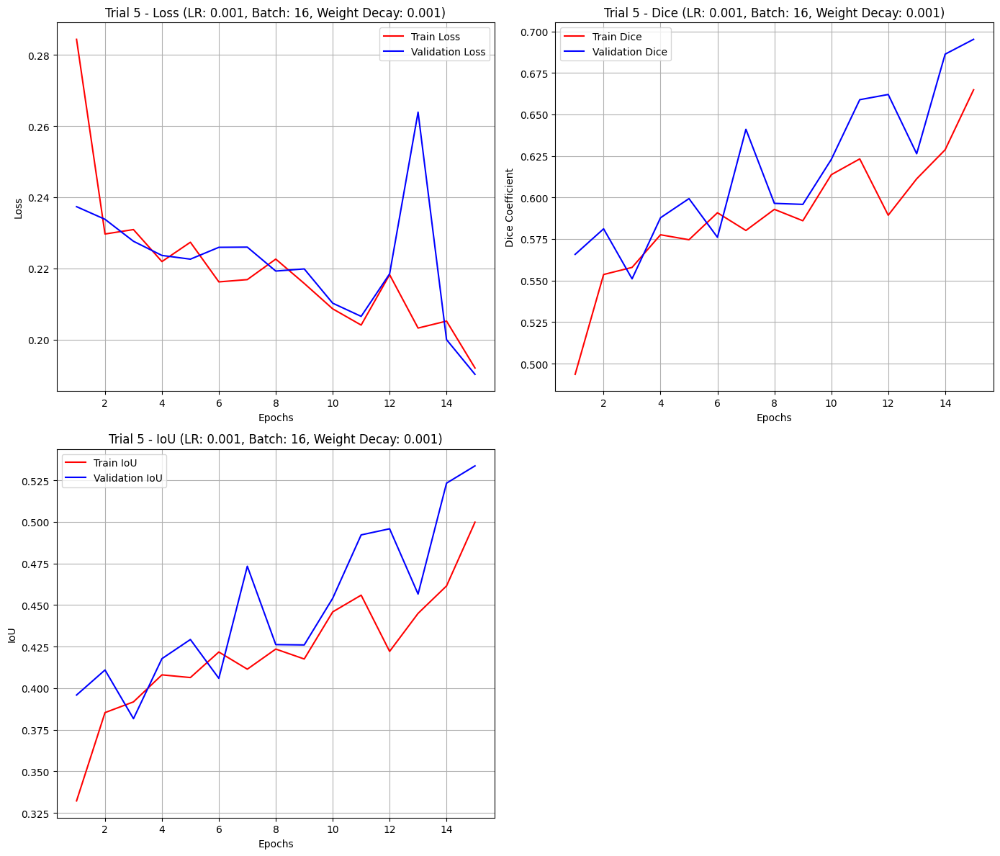

Best validation loss: 0.128455831669271
Best params: learning rate = 0.0001, batch size = 16, weight_decay = 0.0001


In [ ]:
# Tuning degli iperparametri
best_params2 = hyperparameter_tuning_pretrained(trainset2, validationset2, criterion2, device)

TESTING...
Final test loss: 0.13899928445999438, Final test Dice: 0.7986, Final test IoU: 0.6656
ALCUNE PREDIZIONI CORRETTE 



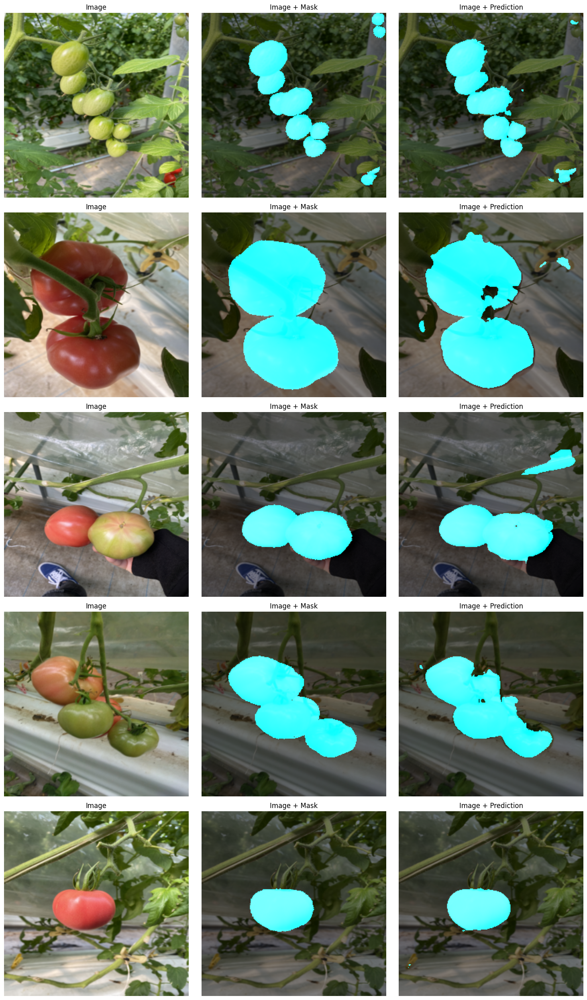

ALCUNE PREDIZIONI ERRATE 



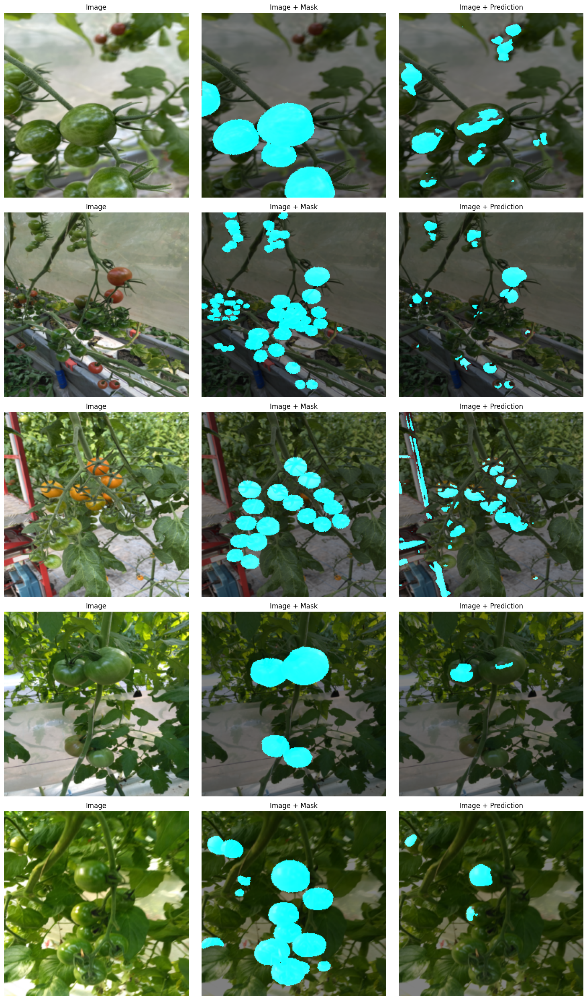

In [24]:
# Caricamento miglior modello e failure analysis
model2 = UNet(in_channels=3, out_channels=1).to(device)
model2.load_state_dict(torch.load('best_model_tomato.pth', weights_only=True))

failure_analysis(model2, criterion2, testset2, best_params2, device)